In [1]:
from caveclient import CAVEclient
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import pyplot
%matplotlib inline

In [2]:
pd.set_option('display.float_format', lambda x: '%.0f' % x)

In [3]:
client = CAVEclient()
datastack_name = 'fanc_production_mar2021'
client = CAVEclient(datastack_name)
client.materialize.get_tables()

['wing_motor_neuron_table_v0',
 'feco_axons_v0',
 'soma_jan2022',
 'synapses_nov2022',
 'motor_neuron_table_v7',
 'upstream_feco_axons',
 'somas_dec2022',
 'nucleus_mar2022',
 'wing_premotor_v4',
 'neuron_somas_dec2022',
 'glia_somas_dec2022',
 'neurotransmitter_hemilineage_table',
 'nerve_bundle_fibers_v0',
 'downstream_bristle_table_v0',
 'all_leg_motor_neuron_table_v0',
 'haltere_motor_neuron_table_v0',
 'bristle_axon_table',
 'hair_plate_table',
 'neck_motor_neuron_table_v0',
 'neck_connective_tag_table_v1',
 'proofreading_status_table_v0',
 'wing_premotor_jul22_v0',
 'downstream_feco_axons_v0',
 't1l_local_premotor_table_v3']

In [4]:
# get bristle tables and separate into leg and wing
bristle_df= client.materialize.query_table('bristle_axon_table')
bristle_df.head()
leg_df = bristle_df[bristle_df.classification_system=='T1_L']
wing_df = bristle_df[bristle_df.classification_system=='ADMN_L']
leg_filtered_df = leg_df.loc[(leg_df['cell_type']!= 'bristle_unsure') & (leg_df['cell_type']!= 'bristle_unsure_short')]
print(bristle_df.shape)
print(leg_df.shape, wing_df.shape)
#print(tactile_df.shape, gustatory_df.shape, unsure_df.shape)
#unsure_df.head(25)
#client.materialize.get_table_metadata('bristle_axon_table')

(582, 7)
(9, 7) (368, 7)


In [5]:
# pick the 1st pt_root_id to test
type_root_df = leg_df[['cell_type','pt_root_id']]
#test = 648518346512552862
type_root_df.shape

(9, 2)

In [6]:
# Get downstream table
dwn_df= client.materialize.query_table('downstream_bristle_table_v0')
print(dwn_df.shape)
dwn_df.head()
#client.materialize.get_table_metadata('downstream_bristle_table_v0')

(604, 7)


,id,valid,classification_system,cell_type,pt_supervoxel_id,pt_root_id,pt_position
0,72270625154007343,t,midline_ascending,midline_ascending,72413287593312433,648518346504802694,"[11120, 114800, 3008]"
1,45,t,ascending,local_ascending,72764856838938688,648518346501822025,"[21737, 107737, 3759]"
2,72551825387028492,t,midline_ascending,midline_ascending,73116425480765171,648518346471827867,"[31312, 98944, 3440]"
3,47,t,local,intersegmental,72905800150266963,648518346467234311,"[24795, 112769, 3161]"
4,72200256409829681,t,midline,midline,72413287459209434,648518346493088498,"[10368, 114960, 2801]"


In [7]:
# get table for synapse
syn_df = client.materialize.synapse_query(pre_ids=type_root_df.pt_root_id)
syn_df

,id,valid,pre_pt_supervoxel_id,pre_pt_root_id,post_pt_supervoxel_id,post_pt_root_id,score,pre_pt_position,post_pt_position
0,672498,t,72764994076624915,648518346501911881,72764994076619968,648518346493754933,22,"[21189, 110903, 3393]","[21203, 110875, 3395]"
1,672701,t,72764994076560586,648518346483186878,72764994076563375,648518346496046438,51,"[21397, 110779, 3375]","[21417, 110755, 3375]"
2,740311,t,72835431472831335,648518346504784243,72835362753528940,648518346474533314,33,"[23867, 112665, 3216]","[23859, 112633, 3216]"
3,740416,t,72835362753459546,648518346504784243,72835362753566223,648518346465032821,33,"[23977, 112441, 3214]","[23949, 112451, 3215]"
4,740574,t,72835362753443419,648518346504784243,72835362753584242,648518346503999950,48,"[24133, 112219, 3215]","[24163, 112211, 3216]"
...,...,...,...,...,...,...,...,...,...
3959,40318037,t,72905731565070981,648518346481688735,72905731565061735,648518346486799388,40,"[26267, 111881, 3422]","[26243, 111875, 3422]"
3961,43483646,t,72483381728059812,648518346475537844,72483381728050006,648518346365116101,42,"[14217, 108287, 3521]","[14243, 108271, 3522]"
3962,43774067,t,72976031589766371,648518346494140411,72976031589756191,648518346490999160,42,"[28201, 108945, 3432]","[28193, 108921, 3433]"
3963,43801605,t,72835294168502752,648518346481688735,72835294168502675,648518346502580848,18,"[24529, 110465, 3569]","[24527, 110423, 3569]"


In [8]:
# Found duplication
type_root_df[type_root_df.duplicated()]

,cell_type,pt_root_id


In [9]:
type_root_df[type_root_df.pt_root_id == 648518346492445881]

,cell_type,pt_root_id


In [10]:
type_root_df = type_root_df.drop_duplicates()

In [16]:
leg_syn_df = pd.merge(type_root_df, syn_df, how='inner', left_on='pt_root_id', right_on='pre_pt_root_id')
leg_syn_df.head()

,cell_type,pt_root_id,id,valid,pre_pt_supervoxel_id,pre_pt_root_id,post_pt_supervoxel_id,post_pt_root_id,score,pre_pt_position,post_pt_position
0,bristle_unsure,648518346501911881,672498,t,72764994076624915,648518346501911881,72764994076619968,648518346493754933,22,"[21189, 110903, 3393]","[21203, 110875, 3395]"
1,bristle_unsure,648518346501911881,5061773,t,72694556747125954,648518346501911881,72694556747104093,648518346398462440,29,"[19899, 110407, 3630]","[19903, 110413, 3628]"
2,bristle_unsure,648518346501911881,15328707,t,72905731631912698,648518346501911881,72905731631964528,648518346486635981,32,"[24597, 111633, 3470]","[24627, 111639, 3471]"
3,bristle_unsure,648518346501911881,16225794,t,72835087942835582,648518346501911881,72835087942833449,648518346483588015,18,"[23701, 103193, 3373]","[23677, 103223, 3373]"
4,bristle_unsure,648518346501911881,16811426,t,72975962870172767,648518346501911881,72975962870170224,648518346487723220,45,"[27983, 107841, 3383]","[28003, 107861, 3383]"


In [12]:
# gets synapses related to bristle axons and downstream partners
    # those with pre_pt_root_id of bristle axons
    # then use the post_pt_root_id of those to find matching pt_root_id of downstream
# since the synapse table already contains both, use post_ids to get classification system from downstream
syn_merged = pd.merge(dwn_df, leg_syn_df, left_on='pt_root_id', right_on='post_pt_root_id', how='inner',suffixes=('_dwn','_syn'))
filtered_df = syn_merged[['classification_system','cell_type_syn', 'pt_root_id_dwn','post_pt_root_id','pre_pt_position','pre_pt_root_id']]
print(filtered_df.shape)
filtered_df

(1788, 6)


,classification_system,cell_type_syn,pt_root_id_dwn,post_pt_root_id,pre_pt_position,pre_pt_root_id
0,midline_ascending,Bristle,648518346504802694,648518346504802694,"[25005, 104477, 3364]",648518346483186878
1,midline_ascending,Bristle,648518346471827867,648518346471827867,"[13683, 107333, 3563]",648518346475537844
2,local,bristle_unsure,648518346467234311,648518346467234311,"[23667, 111193, 3503]",648518346501911881
3,local,Bristle,648518346467234311,648518346467234311,"[23667, 111193, 3503]",648518346501911881
4,local,Bristle,648518346467234311,648518346467234311,"[22219, 114199, 3255]",648518346504784243
...,...,...,...,...,...,...
1783,ax_intersegmental_midline,Bristle,648518346491884911,648518346491884911,"[28359, 104391, 3139]",648518346504784243
1784,ax_intersegmental_midline,Bristle,648518346491884911,648518346491884911,"[23975, 112363, 3211]",648518346504784243
1785,ax_intersegmental_midline,Bristle,648518346491884911,648518346491884911,"[23083, 114205, 3113]",648518346504784243
1786,ax_intersegmental,Bristle,648518346491969931,648518346491969931,"[26409, 113493, 3164]",648518346481688735


In [18]:
len(filtered_df.pt_root_id_dwn.unique())

272

In [13]:
leg_syn_df.loc[(leg_syn_df.cell_type=='bristle_gustatory') | 
               (leg_syn_df.cell_type=='bristle_gustatory_ascending')].pt_root_id.unique().shape

(39,)

In [14]:
syn_merged.loc[(syn_merged.cell_type_syn=='bristle_gustatory') | 
               (syn_merged.cell_type_syn=='bristle_gustatory_ascending')].pt_root_id_syn.unique().shape

(38,)

In [15]:
leg_syn_df.loc[~(leg_syn_df.pt_root_id.isin(syn_merged.pt_root_id_syn))].head()

,cell_type,pt_root_id,id,valid,pre_pt_supervoxel_id,pre_pt_root_id,post_pt_supervoxel_id,post_pt_root_id,score,pre_pt_position,post_pt_position
46181,bristle_gustatory_ascending,648518346490201352,45690517,t,73187206541729653,648518346490201352,73187206541718988,648518346405179969,91,"[33713, 110807, 3398]","[33683, 110785, 3398]"
46182,bristle_gustatory_ascending,648518346490201352,45690525,t,73187206541729653,648518346490201352,73187206541735169,648518346405198401,35,"[33707, 110805, 3400]","[33693, 110767, 3401]"
46183,bristle_gustatory_ascending,648518346490201352,1089558,t,73187137822002136,648518346490201352,73187137821913056,648518346480095135,38,"[34215, 109271, 3338]","[34187, 109281, 3338]"


In [16]:
leg_syn_df[leg_syn_df.pt_root_id==648518346490201352]

,cell_type,pt_root_id,id,valid,pre_pt_supervoxel_id,pre_pt_root_id,post_pt_supervoxel_id,post_pt_root_id,score,pre_pt_position,post_pt_position
46181,bristle_gustatory_ascending,648518346490201352,45690517,t,73187206541729653,648518346490201352,73187206541718988,648518346405179969,91,"[33713, 110807, 3398]","[33683, 110785, 3398]"
46182,bristle_gustatory_ascending,648518346490201352,45690525,t,73187206541729653,648518346490201352,73187206541735169,648518346405198401,35,"[33707, 110805, 3400]","[33693, 110767, 3401]"
46183,bristle_gustatory_ascending,648518346490201352,1089558,t,73187137822002136,648518346490201352,73187137821913056,648518346480095135,38,"[34215, 109271, 3338]","[34187, 109281, 3338]"


In [17]:
syn_merged[syn_merged.pt_root_id_syn==648518346490201352]

,id_dwn,valid_dwn,classification_system,cell_type_dwn,pt_supervoxel_id,pt_root_id_dwn,pt_position,cell_type_syn,pt_root_id_syn,id_syn,valid_syn,pre_pt_supervoxel_id,pre_pt_root_id,post_pt_supervoxel_id,post_pt_root_id,score,pre_pt_position,post_pt_position


In [18]:
test = client.materialize.synapse_query(pre_ids=648518346490201352)
test.shape

(3, 9)

In [19]:
# convert into microns
def convert_to_microns(col, voxel_size=[4.3,4.3,45]):
    return np.vstack(col.values)*voxel_size/1000

In [20]:
def plot_entire(df, title, hue):
    # setting up size and axis handle for plot
    a4_dims = (15, 10)
    fig, ax = pyplot.subplots(1,2,figsize=a4_dims)
    # plots synapses with seaborn module based on classification systems
    syn_pos = convert_to_microns(df['pre_pt_position'])
    x = syn_pos[:, 0]
    y = syn_pos[:, 1]
    z = syn_pos[:, 2]
    sns.scatterplot(x=x, y=y, hue=hue,legend=False, ax=ax[0]).set_title(title)
    ax[0].set_aspect('equal')
    ax[0].set_xlabel('x (um)')
    ax[0].set_ylabel('y (um)')
    sns.scatterplot(x=x, y=z, hue=hue,legend='auto', ax=ax[1]).set_title(title)
    ax[1].set_aspect('equal')
    ax[1].set_xlabel('x (um)')
    ax[1].set_ylabel('z (um)')
    plt.legend(loc = 2, bbox_to_anchor = (1,1))
    return syn_pos

array([[131.3005, 463.4411, 156.06  ],
       [119.9743, 454.1359, 158.265 ],
       [100.9339, 442.2163, 154.17  ],
       ...,
       [ 60.0065, 474.2771, 156.6   ],
       [ 60.0237, 474.3631, 156.6   ],
       [ 60.0323, 474.3029, 156.645 ]])

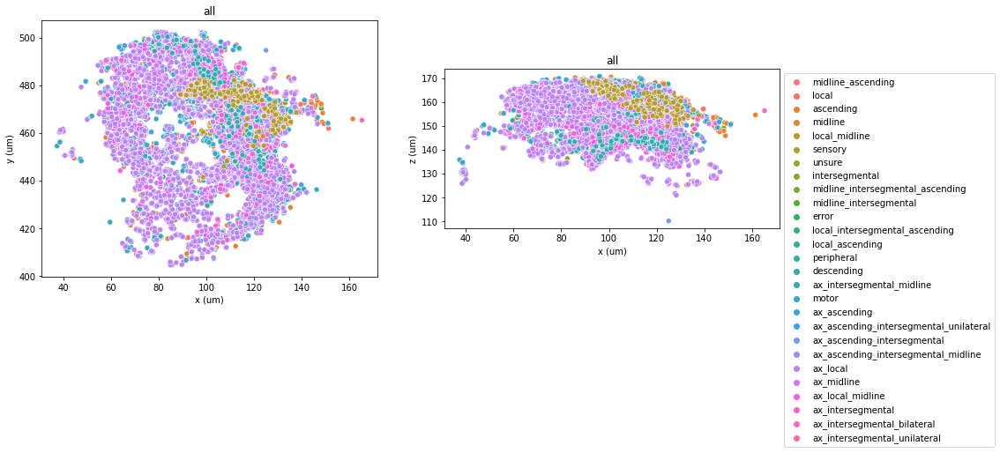

In [21]:
plot_entire(filtered_df, 'all', filtered_df.classification_system)

In [22]:
filtered_df.pre_pt_root_id.value_counts()

648518346496820708    590
648518346485401619    534
648518346494876298    530
648518346486178440    519
648518346470435838    508
                     ... 
648518346494022923     65
648518346485360403     64
648518346479366610     53
648518346486486449     32
648518346501274723     16
Name: pre_pt_root_id, Length: 139, dtype: int64

In [23]:
def plot_entire_alpha(df, dom_alpha, few_alpha):
    # visualizing with different opacities
    # separating positions of dominant classification systems from others
    dom_df = df.loc[(df['classification_system'] == 'local')]
#                    |(df['classification_system'] == 'ascending')
#                    |(df['classification_system'] == 'sensory')]
    #| (filtered_df['classification_system'] == 'ascending')
    dom_pos_df = convert_to_microns(dom_df['pre_pt_position'])
    x3 = dom_pos_df[:, 0]
    y3 = dom_pos_df[:, 1]
    z3 = dom_pos_df[:, 2]
    few_df = df.loc[(df['classification_system'] != 'local')]
#                    & (df['classification_system'] != 'ascending')
#                    & (df['classification_system'] != 'sensory')]
    #& (filtered_df['classification_system'] != 'ascending')
    few_pos_df = convert_to_microns(few_df['pre_pt_position'])
    x4 = few_pos_df[:, 0]
    y4 = few_pos_df[:, 1]
    z4 = few_pos_df[:, 2]
    # setting up size and axis handle for plot
    a4_dims = (15, 10)
    fig, ax3 = pyplot.subplots(1,2,figsize=a4_dims)
    # plots synapses with seaborn module based on classification system
    sns.scatterplot(x=x3, y=y3, hue=dom_df.classification_system,legend=False, ax=ax3[0], alpha=dom_alpha)
    sns.scatterplot(x=x4, y=y4, hue=few_df.classification_system,legend=False, ax=ax3[0], alpha=few_alpha)
    ax3[0].set_aspect('equal')
    ax3[0].set_xlabel('x (um)')
    ax3[0].set_ylabel('y (um)')
    sns.scatterplot(x=x3, y=z3, hue=dom_df.classification_system,legend='full', ax=ax3[1], alpha=dom_alpha)
    sns.scatterplot(x=x4, y=z4, hue=few_df.classification_system,legend='full', ax=ax3[1], alpha=few_alpha)
    ax3[1].set_aspect('equal')
    ax3[1].set_xlabel('x (um)')
    ax3[1].set_ylabel('z (um)')
    plt.legend(loc = 2, bbox_to_anchor = (1,1))

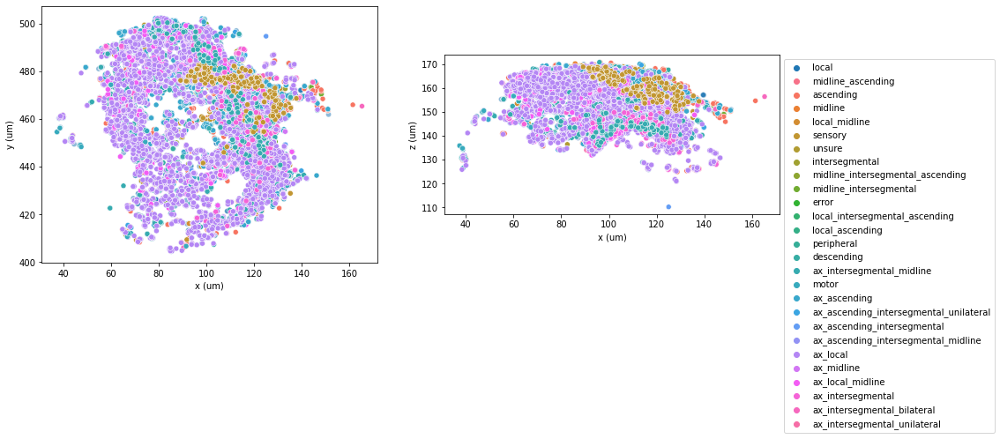

In [24]:
plot_entire_alpha(filtered_df,0.5,1)

In [25]:
def plot_a_class(df, classification,hue):
    # setting up size for plot
    a4_dims = (15, 10)
    fig, ax2 = pyplot.subplots(1,2,figsize=a4_dims)
    # plots synapses with seaborn module based on classification system
    a_class_df = df[df.classification_system==classification]
    syn_pos3 = convert_to_microns(a_class_df['pre_pt_position'])
    x5 = syn_pos3[:, 0]
    y5 = syn_pos3[:, 1]
    z5 = syn_pos3[:, 2]
    sns.scatterplot(x=x5, y=y5, hue=a_class_df.loc[:,hue],legend=False, ax=ax2[0]).set_title(classification)
#    ax2[0].set_aspect('equal')
    ax2[0].set_xlim(30, 180)
    ax2[0].set_ylim(400, 520)
    ax2[0].set_xlabel('x (um)')
    ax2[0].set_ylabel('y (um)')
    sns.scatterplot(x=x5, y=z5, hue=a_class_df.loc[:,hue],legend='auto', ax=ax2[1]).set_title(classification)
#    ax2[1].set_aspect('equal')
    ax2[1].set_xlim(30, 180)
    ax2[1].set_ylim(105, 180)
    ax2[1].set_xlabel('x (um)')
    ax2[1].set_ylabel('z (um)')
    plt.legend(loc = 2, bbox_to_anchor = (1,1))
    return a_class_df

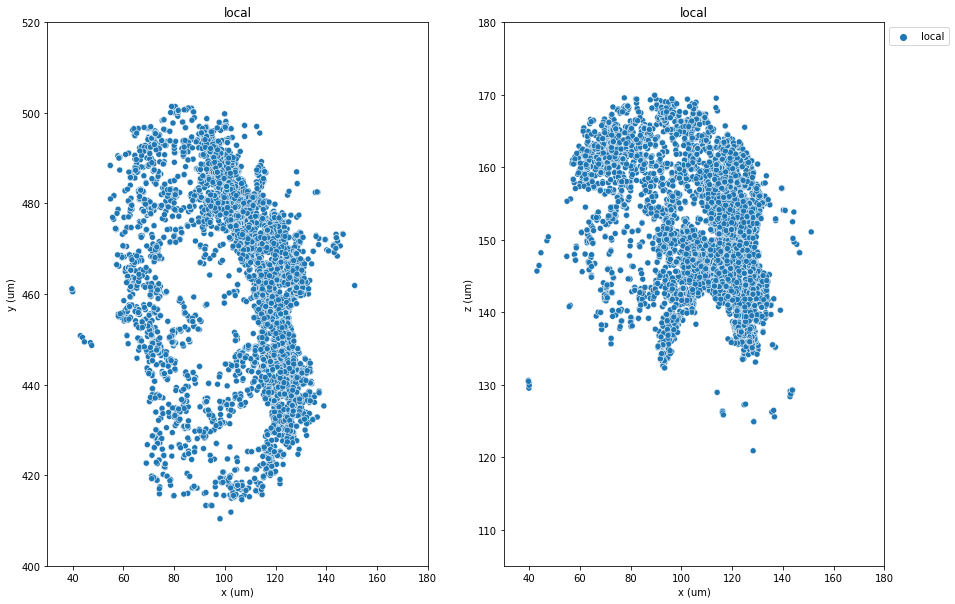

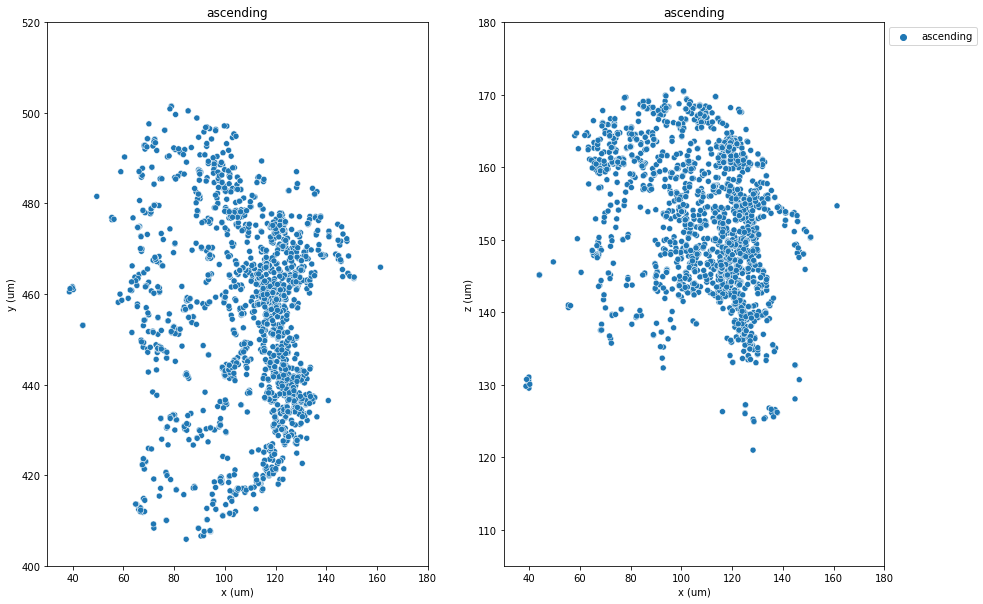

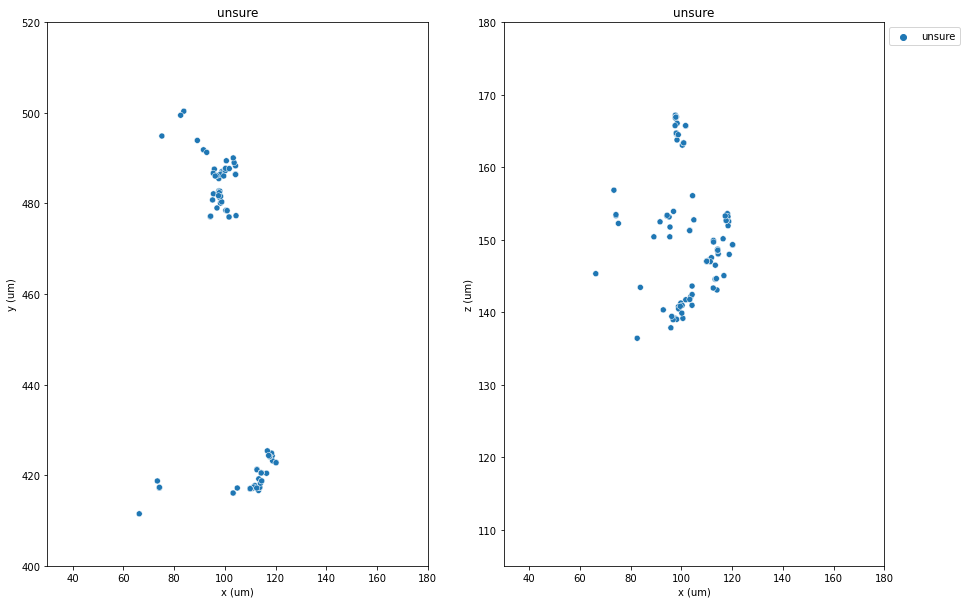

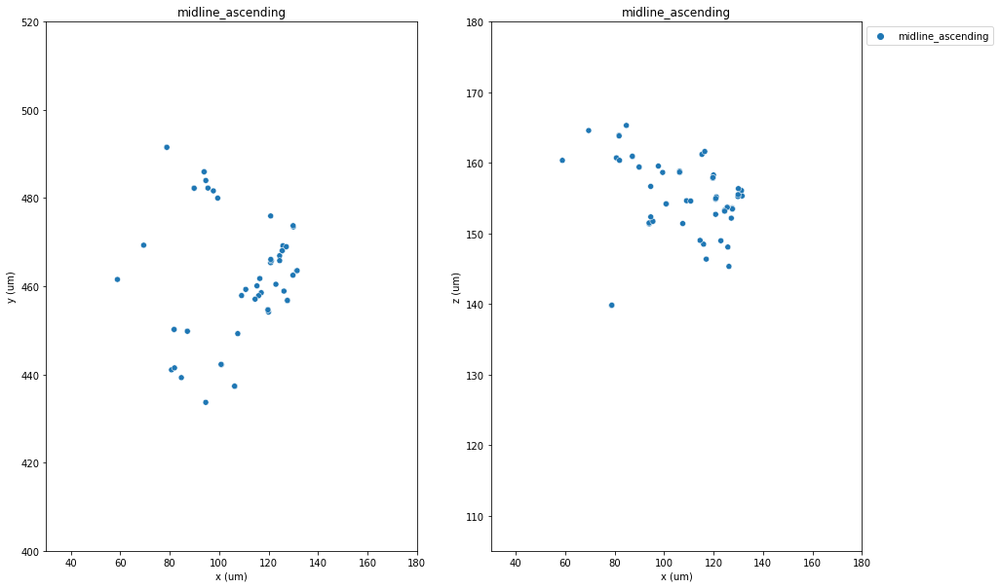

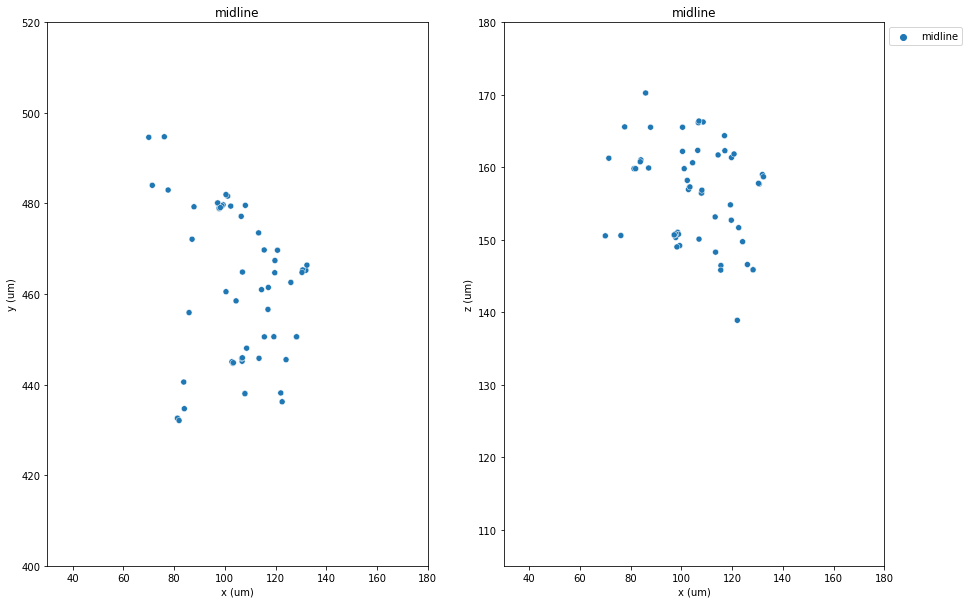

...

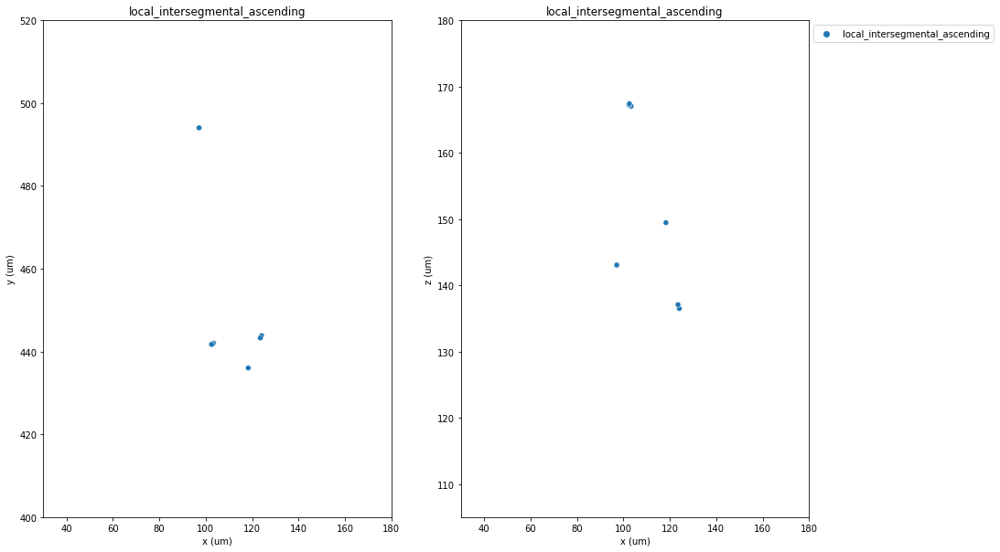

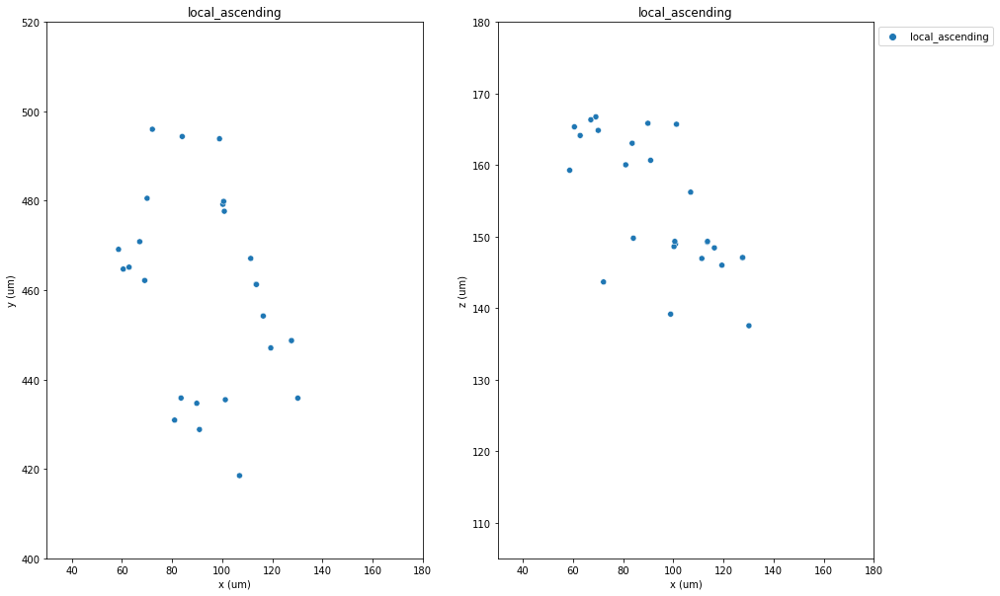

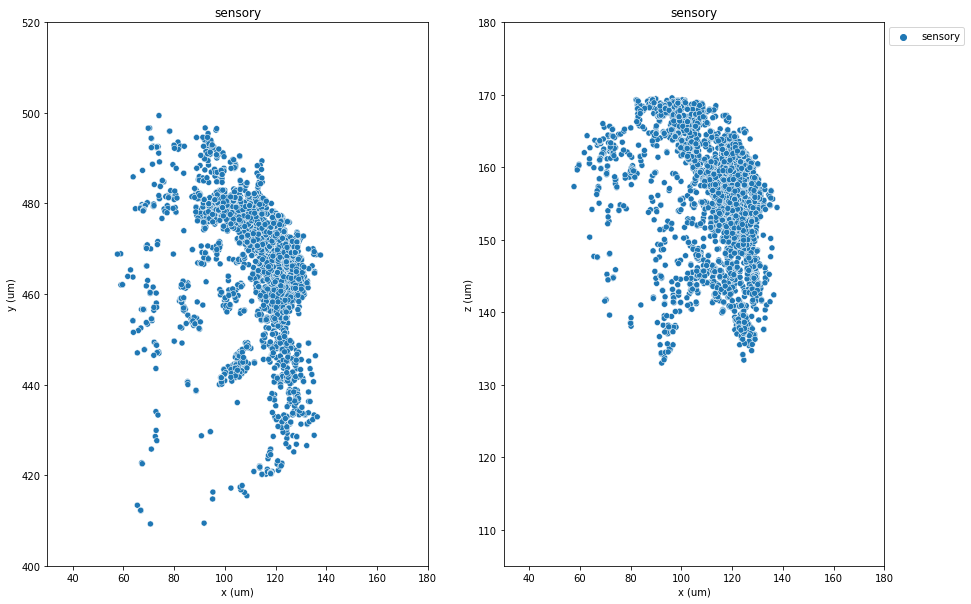

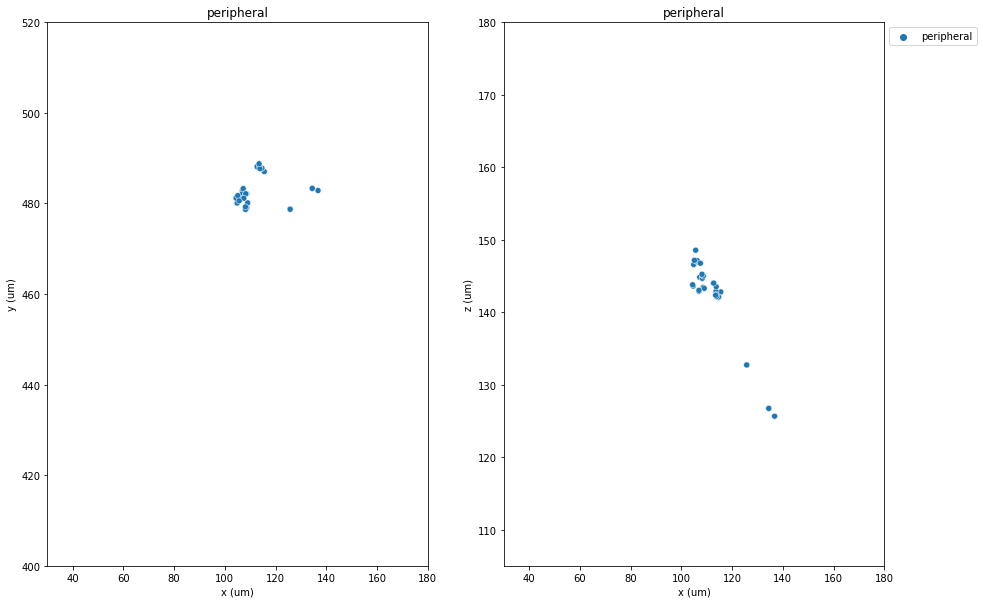

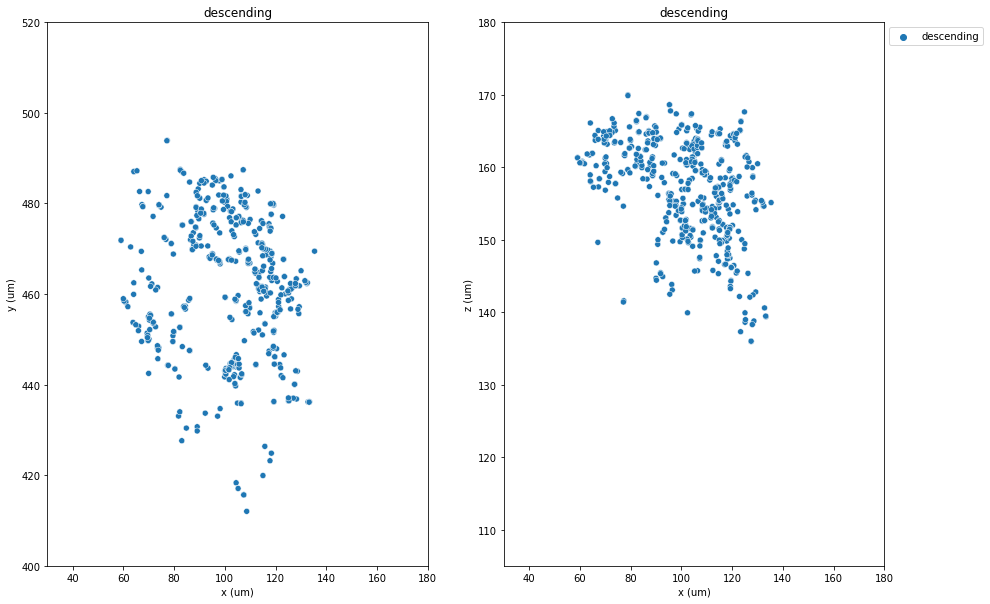

In [26]:
local_df = plot_a_class(filtered_df,'local','classification_system')
ascending_df = plot_a_class(filtered_df,'ascending','classification_system')
unsure_syn_df = plot_a_class(filtered_df,'unsure','classification_system')
midline_ascending_df = plot_a_class(filtered_df,'midline_ascending','classification_system')
midline_df = plot_a_class(filtered_df,'midline','classification_system')
intersegmental_df = plot_a_class(filtered_df,'intersegmental','classification_system')
local_midline_df = plot_a_class(filtered_df,'local_midline','classification_system')
motor_df = plot_a_class(filtered_df,'motor','classification_system')
midline_intersegmental_ascending_df = plot_a_class(filtered_df,'midline_intersegmental_ascending','classification_system')
midline_intersegmental_df = plot_a_class(filtered_df,'midline_intersegmental','classification_system')
error_df = plot_a_class(filtered_df,'error','classification_system')
#intersegmental_ascending_df = plot_a_class(filtered_df,'intersegmental_ascending','classification_system')
local_intersegmental_ascending_df = plot_a_class(filtered_df,'local_intersegmental_ascending','classification_system')
local_ascending_df = plot_a_class(filtered_df,'local_ascending','classification_system')
sensory_df = plot_a_class(filtered_df,'sensory','classification_system')
peripheral_df = plot_a_class(filtered_df,'peripheral','classification_system')
descending_df = plot_a_class(filtered_df,'descending','classification_system')


In [27]:
local_intersegmental_ascending_df.shape, sensory_df.shape, ascending_df.shape

((10, 6), (3774, 6), (1903, 6))

In [28]:
midline_intersegmental_df['post_pt_root_id'].unique()

array([648518346483159116, 648518346526243031, 648518346501864777,
       648518346472431051], dtype=int64)

In [29]:
midline_ascending_df.head()

,classification_system,cell_type_syn,pt_root_id_dwn,post_pt_root_id,pre_pt_position,pre_pt_root_id
0,midline_ascending,bristle_gustatory,648518346504802694,648518346504802694,"[30535, 107777, 3468]",648518346486271136
1,midline_ascending,bristle_unsure,648518346504802694,648518346504802694,"[27901, 105613, 3517]",648518346493973134
2,midline_ascending,bristle_unsure,648518346504802694,648518346504802694,"[23473, 102841, 3426]",648518346493973134
3,midline_ascending,bristle_unsure,648518346504802694,648518346504802694,"[23435, 102855, 3426]",648518346493973134
4,midline_ascending,bristle_gustatory,648518346504802694,648518346504802694,"[30591, 107801, 3451]",648518346490998904


In [30]:
# replacing anything that contains 'ascending' with only 'ascending' label
ascending_updated_df = filtered_df.copy()
ascending_updated_df = ascending_updated_df.replace(to_replace=
                                                     ['midline_ascending',
                                                     'midline_intersegmental_ascending',
                                                     'intersegmental_ascending',
                                                     'local_ascending',
                                                     'local_intersegmental_ascending'],
                                                    value='ascending')
ascending_updated_df.head()

C:\Users\trnan\anaconda3\envs\micronsbinder\lib\site-packages\pandas\core\array_algos\replace.py:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  op = lambda x: operator.eq(x, b)


,classification_system,cell_type_syn,pt_root_id_dwn,post_pt_root_id,pre_pt_position,pre_pt_root_id
0,ascending,bristle_gustatory,648518346504802694,648518346504802694,"[30535, 107777, 3468]",648518346486271136
1,ascending,bristle_unsure,648518346504802694,648518346504802694,"[27901, 105613, 3517]",648518346493973134
2,ascending,bristle_unsure,648518346504802694,648518346504802694,"[23473, 102841, 3426]",648518346493973134
3,ascending,bristle_unsure,648518346504802694,648518346504802694,"[23435, 102855, 3426]",648518346493973134
4,ascending,bristle_gustatory,648518346504802694,648518346504802694,"[30591, 107801, 3451]",648518346490998904


In [31]:
# removing rows with 'error' or 'unsure' label
updated_df = ascending_updated_df.loc[(ascending_updated_df['classification_system'] != 'error') &
                                      (ascending_updated_df['classification_system'] != 'unsure')]

In [32]:
# agregating tactile and gustatory labels
updated_df = updated_df.replace(to_replace=['bristle_tactile','bristle_tactile_crossover'], value='tactile')
updated_df = updated_df.replace(to_replace=['bristle_gustatory','bristle_gustatory_ascending'], value='gustatory')

C:\Users\trnan\anaconda3\envs\micronsbinder\lib\site-packages\pandas\core\array_algos\replace.py:84: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  op = lambda x: operator.eq(x, b)


In [33]:
tactile_df = updated_df[updated_df.cell_type_syn == 'tactile']
gustatory_df = updated_df[updated_df.cell_type_syn == 'gustatory']
unsure_type_df = updated_df.loc[(updated_df['cell_type_syn'] != 'tactile') & (updated_df['cell_type_syn'] != 'gustatory')]
no_unsure_df = pd.concat([tactile_df,gustatory_df],axis=0)
updated_df.shape, tactile_df.shape, gustatory_df.shape, unsure_type_df.shape, no_unsure_df.shape

((34269, 6), (14994, 6), (9012, 6), (10263, 6), (24006, 6))

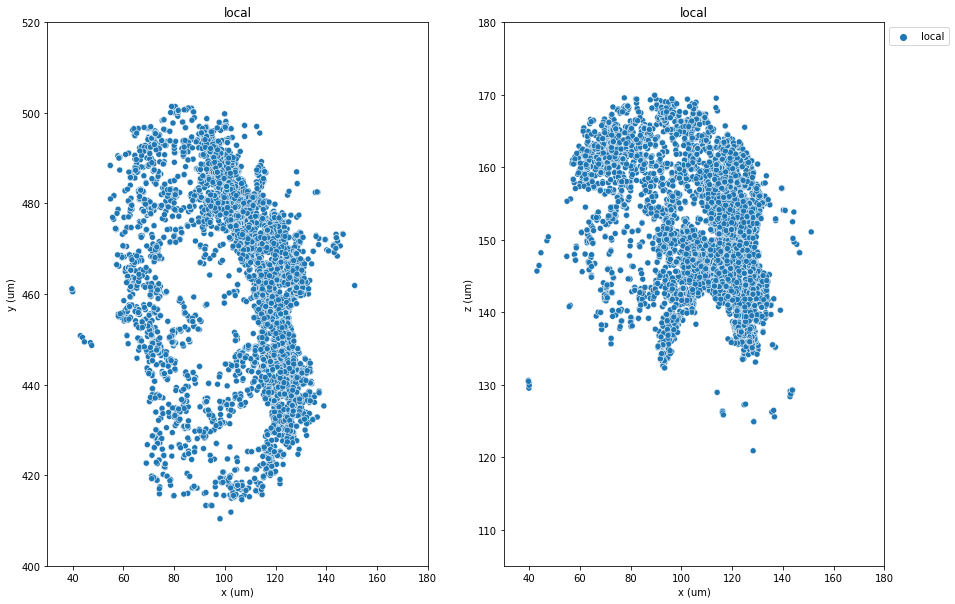

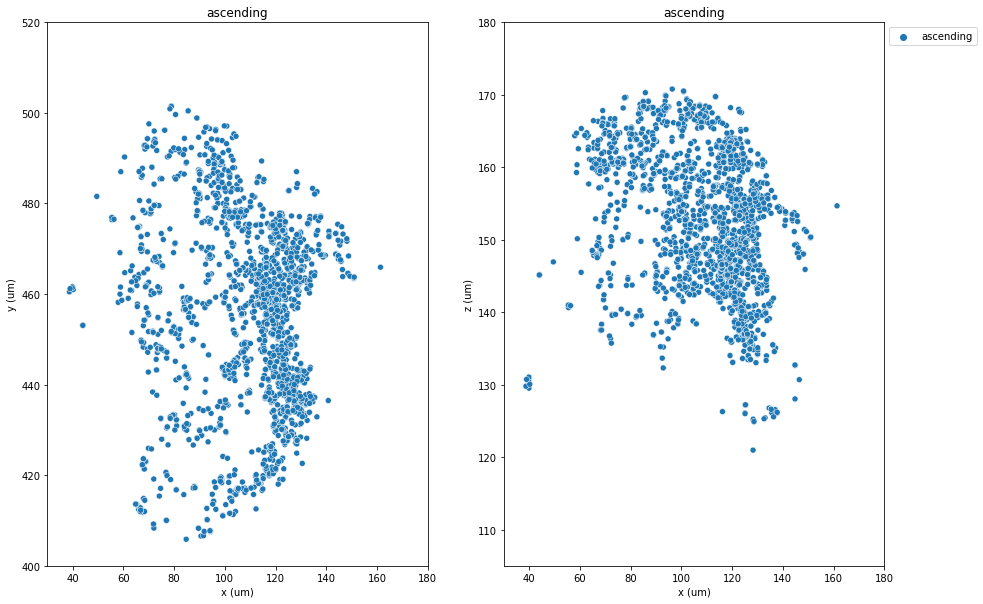

In [34]:
local_df = plot_a_class(updated_df,'local','classification_system')
ascending2_df = plot_a_class(updated_df,'ascending','classification_system')

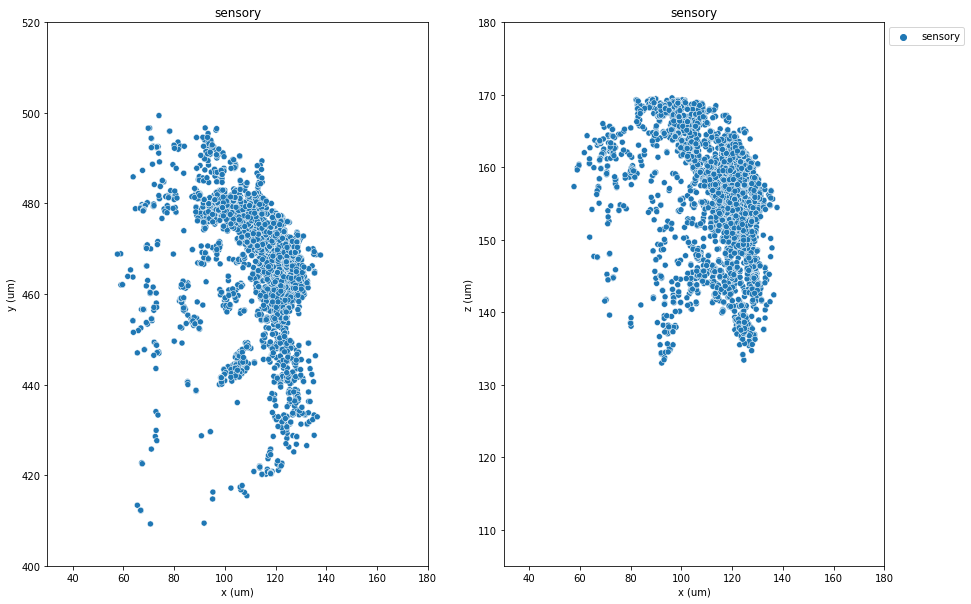

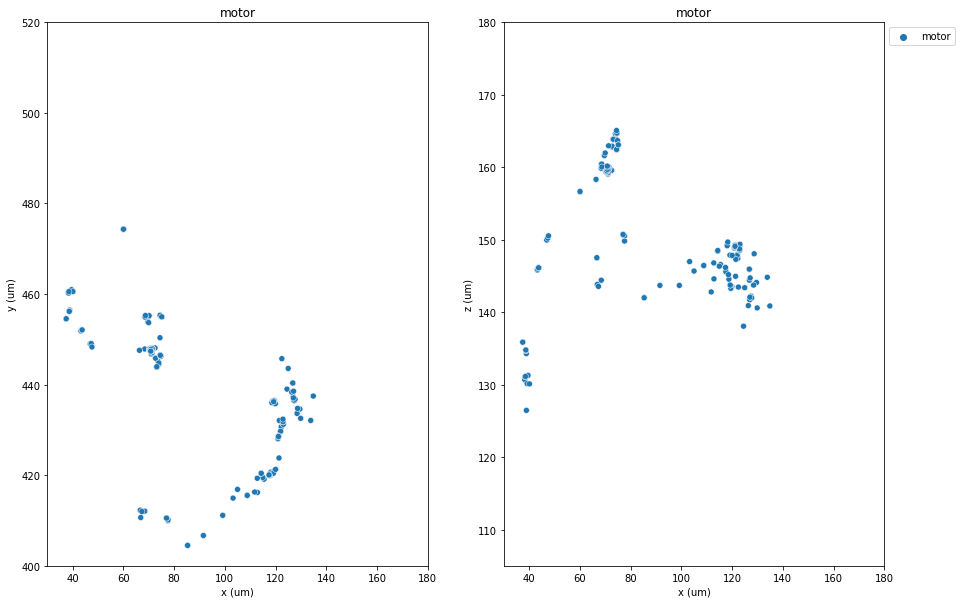

In [35]:
sensory_df = plot_a_class(updated_df,'sensory','classification_system')
motor_df = plot_a_class(updated_df,'motor','classification_system')

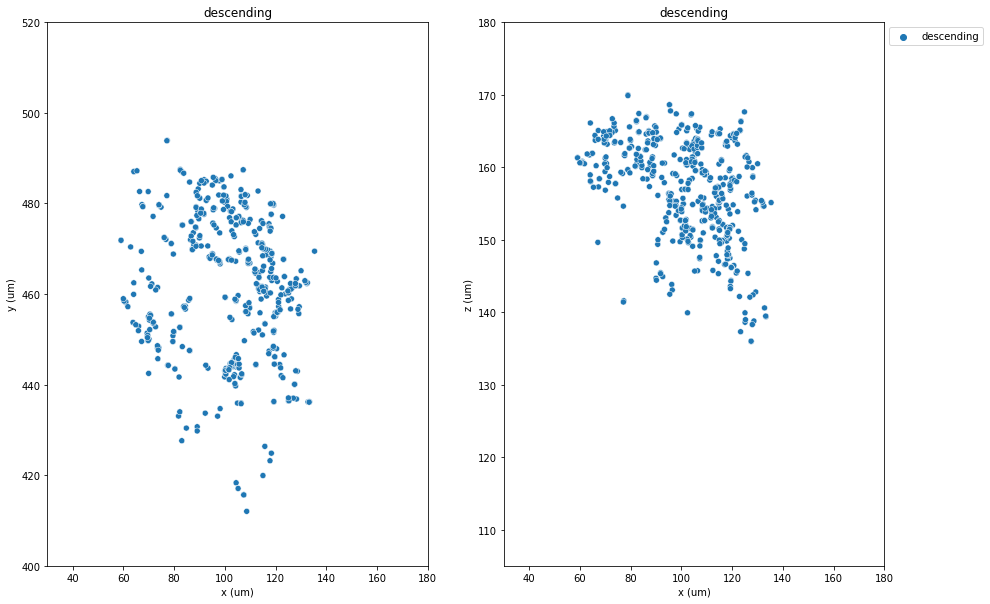

In [36]:
descending_df = plot_a_class(updated_df,'descending','classification_system')

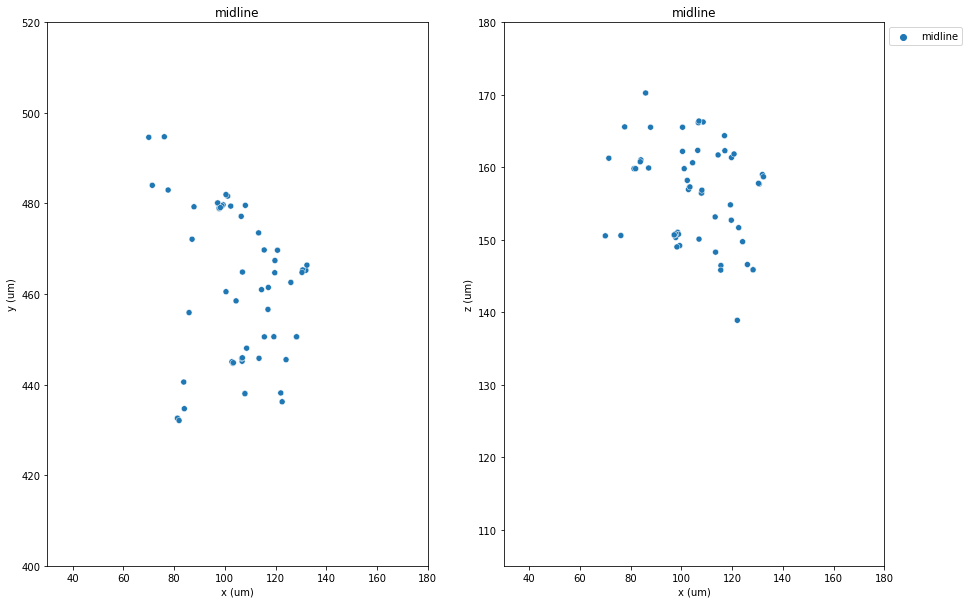

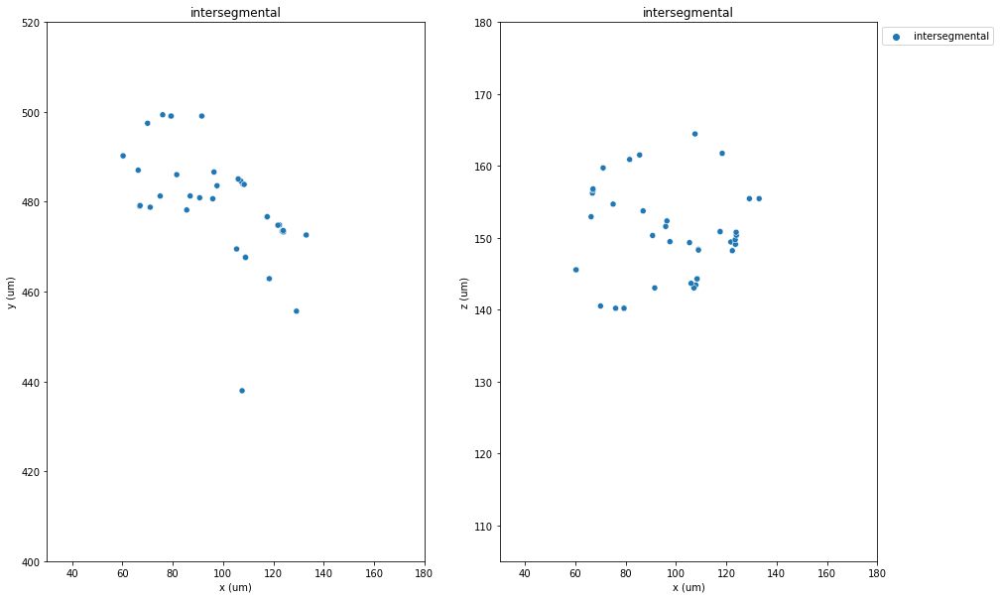

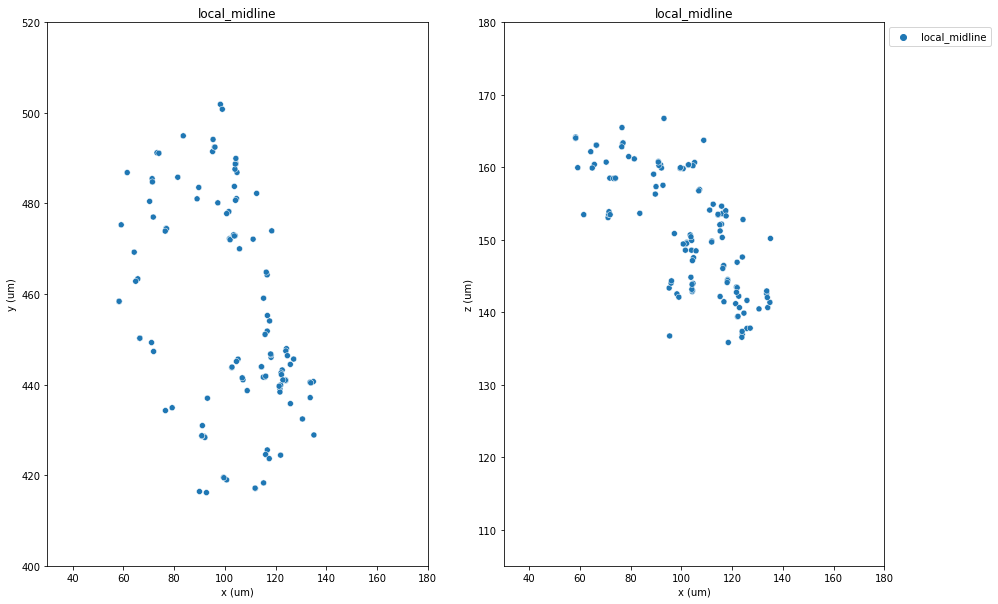

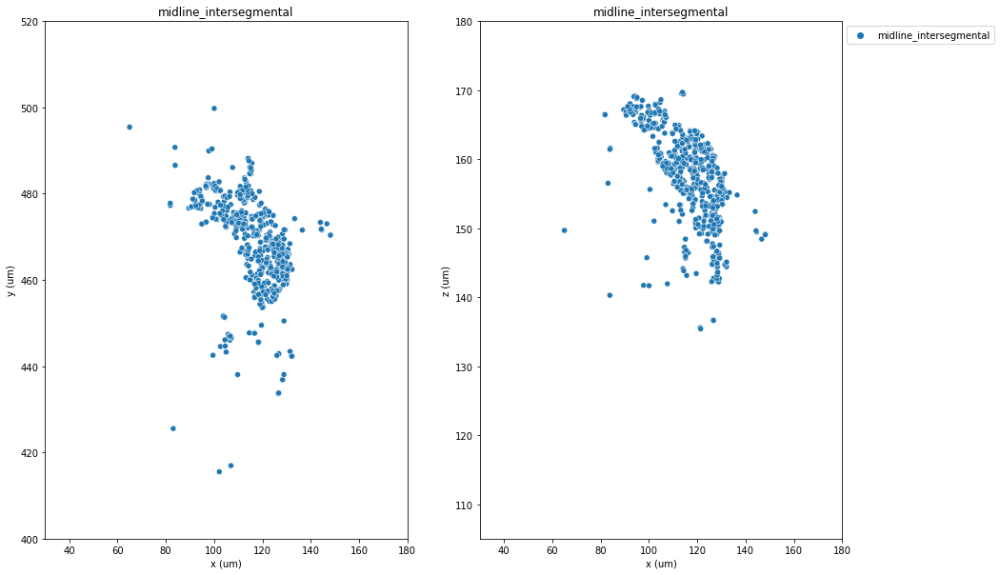

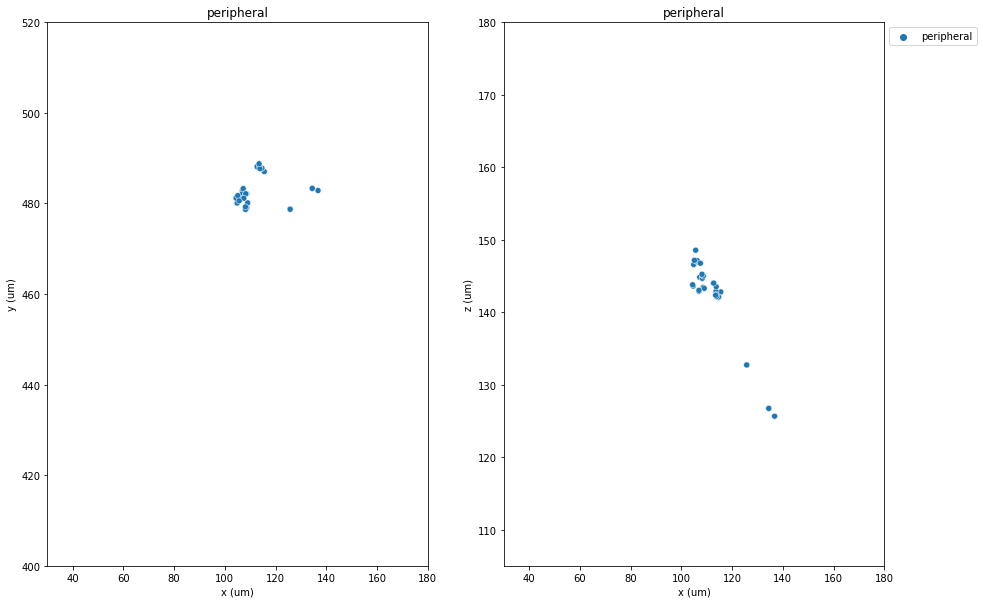

In [37]:
midline_df = plot_a_class(updated_df,'midline','classification_system')
intersegmental_df = plot_a_class(updated_df,'intersegmental','classification_system')
local_midline_df = plot_a_class(updated_df,'local_midline','classification_system')
midline_intersegmental_df = plot_a_class(updated_df,'midline_intersegmental','classification_system')
peripheral_df = plot_a_class(updated_df,'peripheral','classification_system')

In [38]:
# visualize a single bristle and its downstream partners
def plot_a_bristle(pt_root_ids, df, hue):
    n = 0
    for pt_root_id in pt_root_ids:
        n+=1
        syn_df_real2 = df[df.pre_pt_root_id==pt_root_id]
        #syn_df_real2
        # setting up size for plot
        a4_dims = (15, 10)
        fig, ax2 = pyplot.subplots(1,3,figsize=a4_dims)
        # plots synapses with seaborn module of a bristle axon and its downstream partner
        #syn_pos2 = convert_to_microns(filtered_df2['pre_pt_position'])
        syn_pos2 = convert_to_microns(syn_df_real2['pre_pt_position'])
        x2 = syn_pos2[:, 0]
        y2 = syn_pos2[:, 1]
        z2 = syn_pos2[:, 2]
        sns.scatterplot(x=x2, y=y2, hue=syn_df_real2.loc[:,hue], palette='Set2',legend=False, ax=ax2[0]).set_title(str(n))
        #ax2[0].set_aspect('equal')
        ax2[0].set_xlim(30, 180)
        ax2[0].set_ylim(400, 520)
        ax2[0].set_xlabel('x (um)')
        ax2[0].set_ylabel('y (um)')
        sns.scatterplot(x=x2, y=z2, hue=syn_df_real2.loc[:,hue], palette='Set2',legend=False, ax=ax2[1])
        #ax2[1].set_aspect('equal')
        ax2[1].set_xlim(30, 170)
        ax2[1].set_ylim(105, 180)
        ax2[1].set_xlabel('x (um)')
        ax2[1].set_ylabel('z (um)')
        sns.scatterplot(x=z2, y=y2, hue=syn_df_real2.loc[:,hue], palette='Set2',legend='auto', ax=ax2[2])
        ax2[2].set_aspect('equal')
        ax2[2].set_xlabel('z (um)')
        ax2[2].set_ylabel('y (um)')
        plt.legend(loc = 2, bbox_to_anchor = (1,1))

array([[131.3005, 463.4411, 156.06  ],
       [119.9743, 454.1359, 158.265 ],
       [100.9339, 442.2163, 154.17  ],
       ...,
       [ 60.0065, 474.2771, 156.6   ],
       [ 60.0237, 474.3631, 156.6   ],
       [ 60.0323, 474.3029, 156.645 ]])

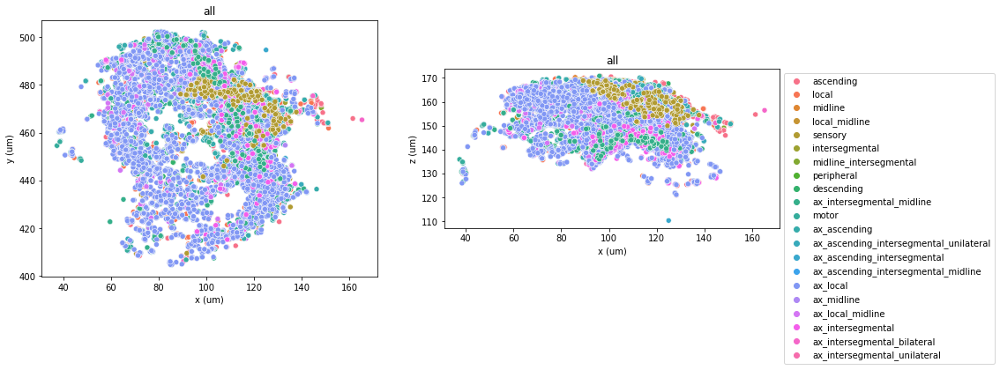

In [39]:
plot_entire(updated_df, 'all', updated_df.classification_system)

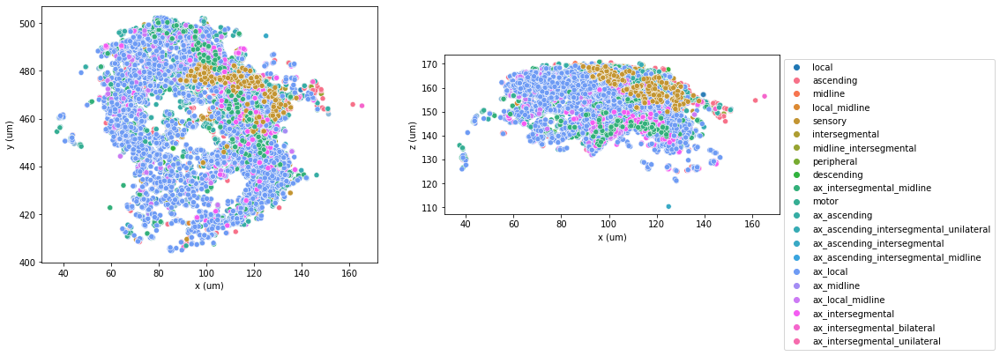

In [40]:
plot_entire_alpha(updated_df,0.5,1)

In [41]:
def plot_some_classes(df, classifications):
    title = classifications[0]
    combined_df = df[df.classification_system==classifications[0]]
    for classification in classifications:
        if classification != classifications[0]:
            title = '{0} and {1}'.format(title, classification)
            a_df = df[df.classification_system==classification]
            combined_df = pd.concat([combined_df, a_df])
    # setting up size for plot
    a4_dims = (15, 10)
    fig, ax2 = pyplot.subplots(1,2,figsize=a4_dims)
    # plots synapses with seaborn module based on classification system
    syn_pos3 = convert_to_microns(combined_df['pre_pt_position'])
    x5 = syn_pos3[:, 0]
    y5 = syn_pos3[:, 1]
    z5 = syn_pos3[:, 2]
    sns.scatterplot(x=x5, y=y5,size=5 ,hue=combined_df.classification_system,legend=False, ax=ax2[0]).set_title(title)
    ax2[0].set_aspect('equal')
#    ax2[0].set_xlim(30, 180)
#    ax2[0].set_ylim(400, 520)
    ax2[0].set_xlabel('x (um)')
    ax2[0].set_ylabel('y (um)')
    sns.scatterplot(x=x5, y=z5,size=5 ,hue=combined_df.classification_system,legend='auto', ax=ax2[1]).set_title(title)
    ax2[1].set_aspect('equal')
#    ax2[1].set_xlim(30, 170)
#    ax2[1].set_ylim(105, 180)
    ax2[1].set_xlabel('x (um)')
    ax2[1].set_ylabel('z (um)')
    plt.legend(loc = 2, bbox_to_anchor = (1,1))
    return combined_df

,classification_system,cell_type_syn,pt_root_id_dwn,post_pt_root_id,pre_pt_position,pre_pt_root_id
0,ascending,gustatory,648518346504802694,648518346504802694,"[30535, 107777, 3468]",648518346486271136
1,ascending,bristle_unsure,648518346504802694,648518346504802694,"[27901, 105613, 3517]",648518346493973134
2,ascending,bristle_unsure,648518346504802694,648518346504802694,"[23473, 102841, 3426]",648518346493973134
3,ascending,bristle_unsure,648518346504802694,648518346504802694,"[23435, 102855, 3426]",648518346493973134
4,ascending,gustatory,648518346504802694,648518346504802694,"[30591, 107801, 3451]",648518346490998904
...,...,...,...,...,...,...
34280,sensory,gustatory,648518346486271136,648518346486271136,"[29995, 108765, 3463]",648518346512198702
34281,sensory,gustatory,648518346486271136,648518346486271136,"[22933, 102687, 3752]",648518346512198702
34282,sensory,gustatory,648518346486271136,648518346486271136,"[22933, 102679, 3752]",648518346512198702
34283,sensory,gustatory,648518346486271136,648518346486271136,"[29909, 109377, 3484]",648518346482695209


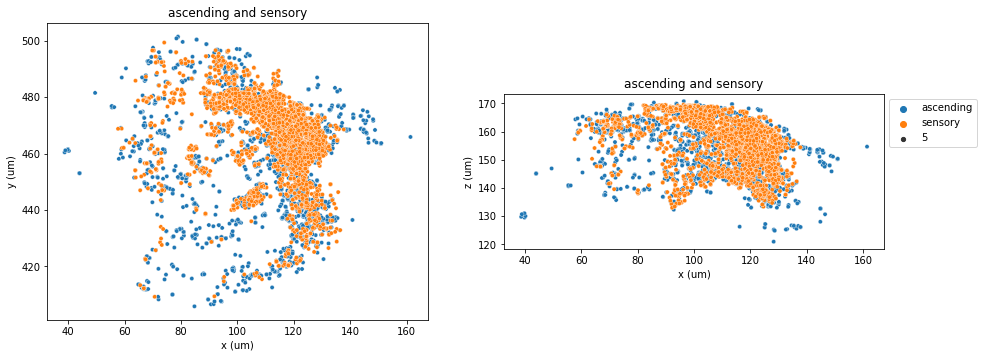

In [42]:
plot_some_classes(updated_df, ['ascending','sensory'])

In [43]:
updated_df.pre_pt_root_id.unique()

array([648518346486271136, 648518346493973134, 648518346490998904,
       648518346478891216, 648518346488625742, 648518346490400604,
       648518346490411100, 648518346494129655, 648518346483186878,
       648518346496820708, 648518346486270112, 648518346509047674,
       648518346479212732, 648518346495189174, 648518346480454913,
       648518346489480829, 648518346493061404, 648518346514401735,
       648518346481010522, 648518346491041057, 648518346494006283,
       648518346503004027, 648518346491054369, 648518346486176866,
       648518346504782707, 648518346470435838, 648518346526236887,
       648518346517728104, 648518346494729717, 648518346509686985,
       648518346494708899, 648518346504428012, 648518346459603716,
       648518346473025380, 648518346477914581, 648518346473053028,
       648518346475537844, 648518346493939598, 648518346496920728,
       648518346489638671, 648518346517728360, 648518346517453092,
       648518346466736494, 648518346476937232, 648518346504422

C:\Users\trnan\anaconda3\envs\micronsbinder\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.


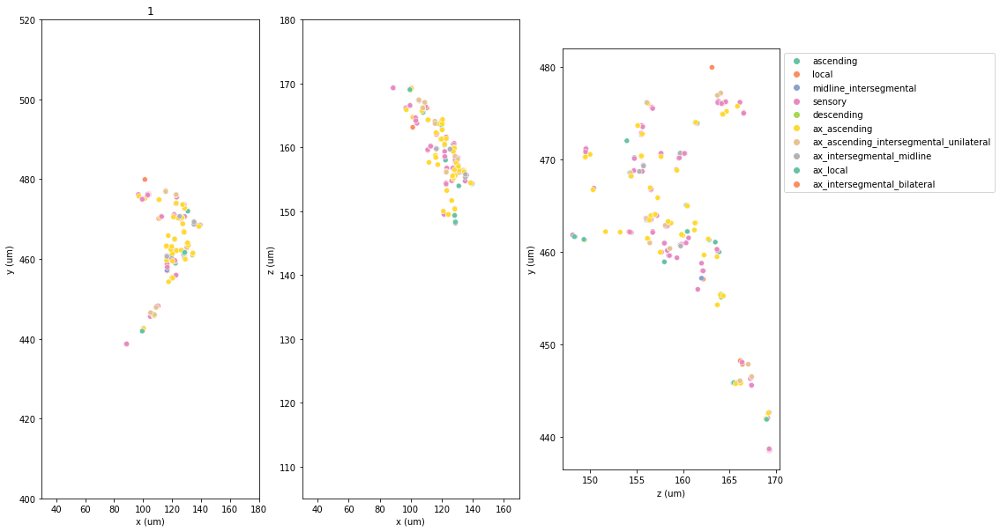

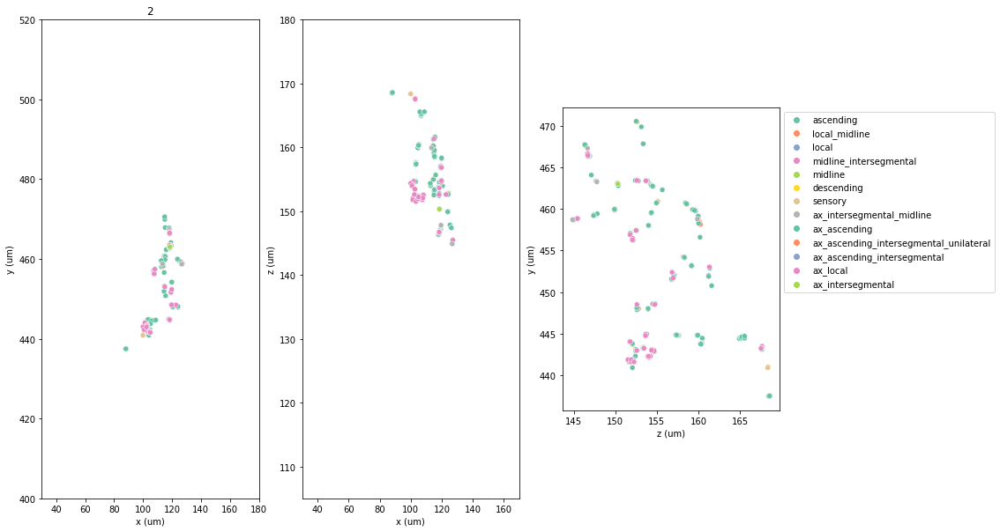

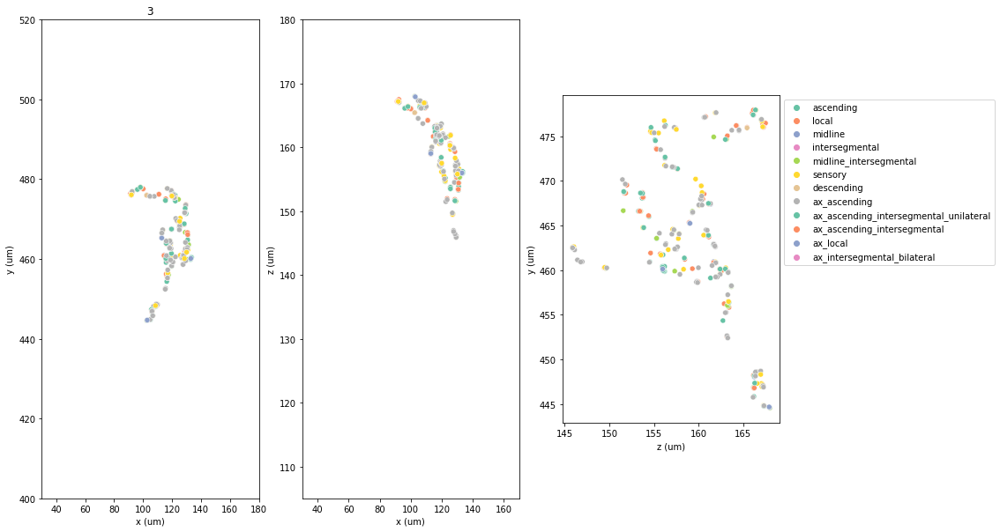

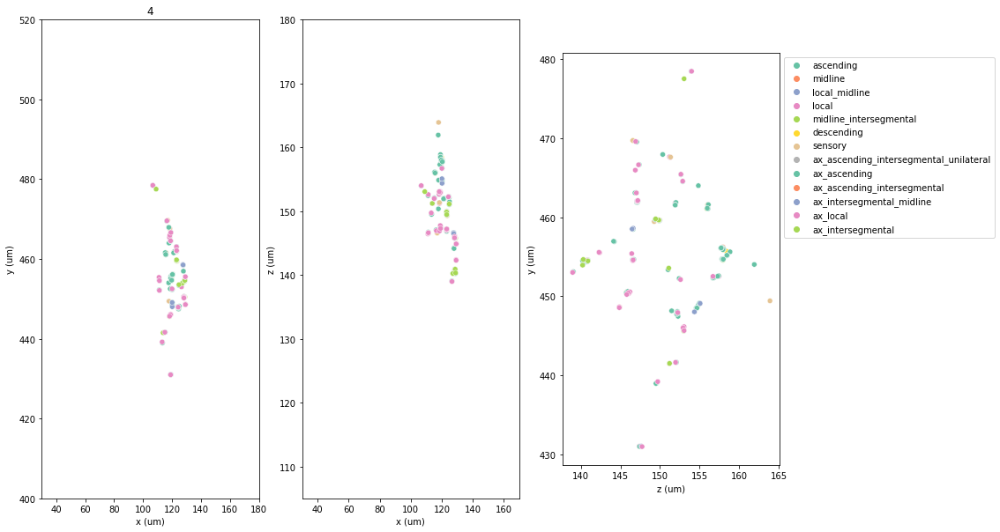

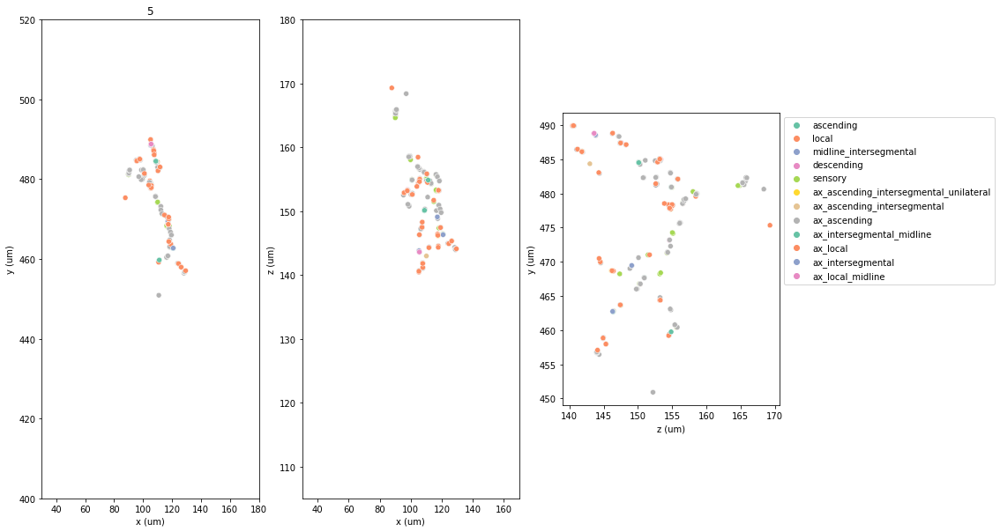

...

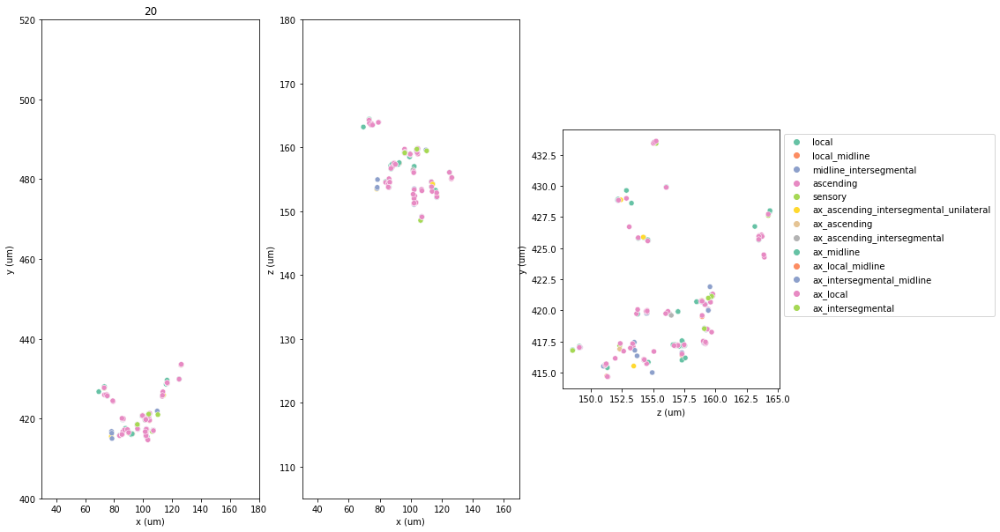

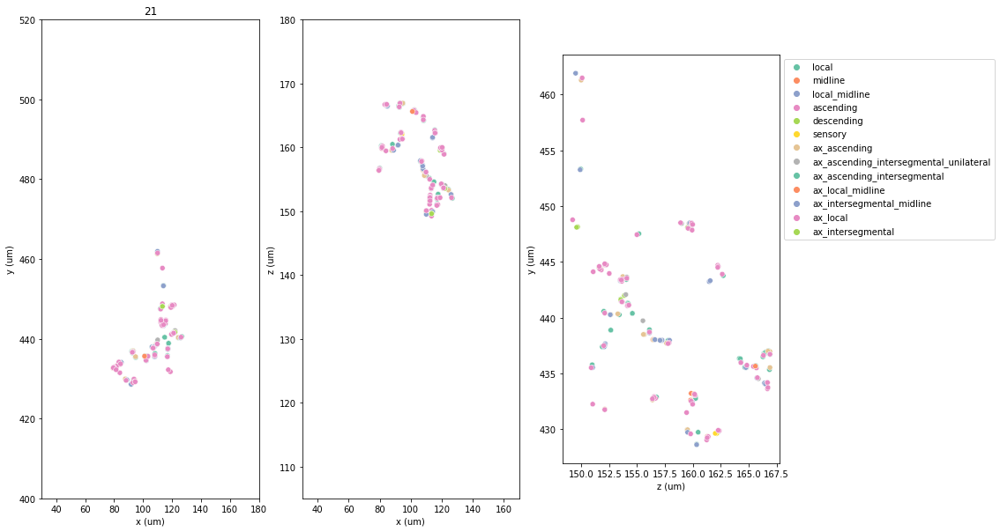

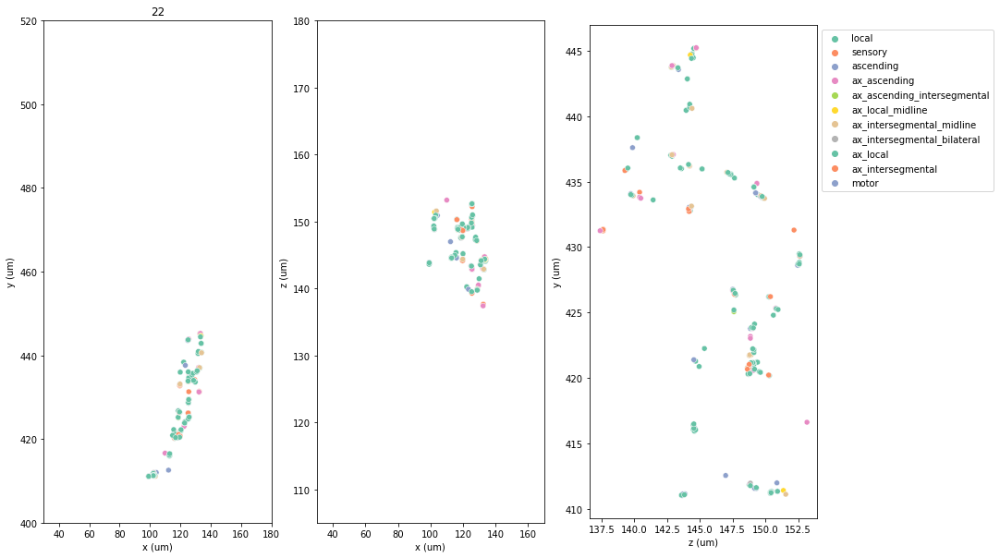

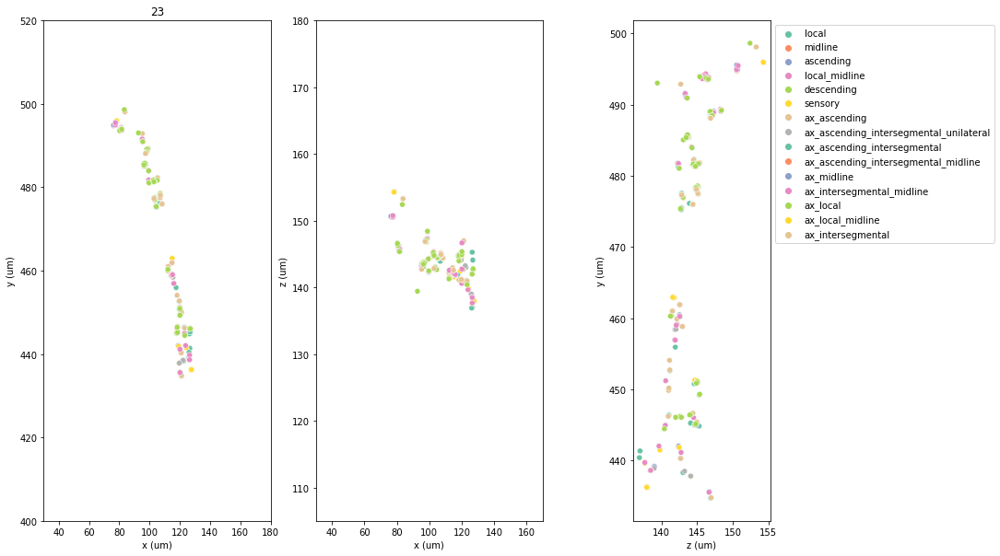

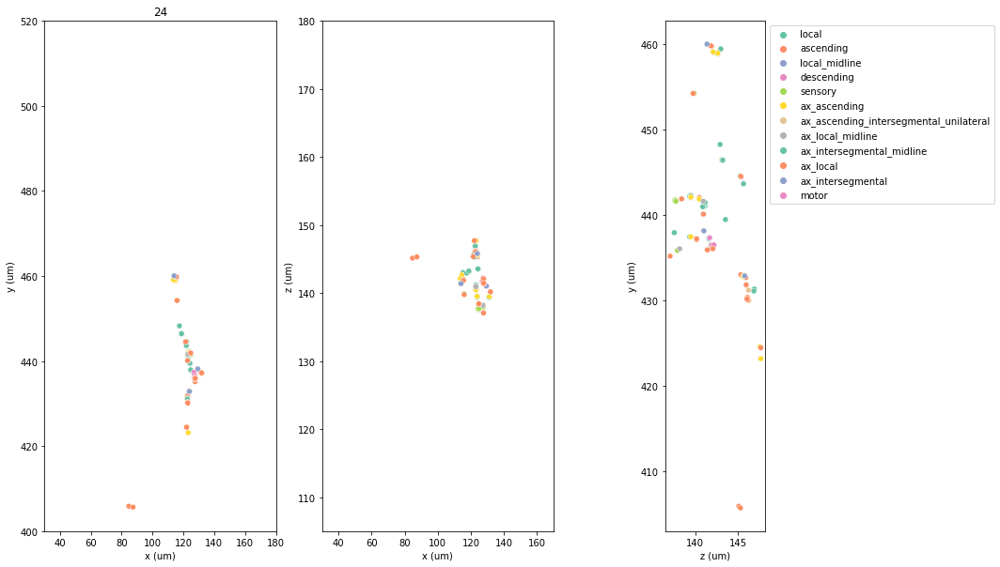

In [45]:
plot_a_bristle([648518346486271136, 648518346493973134, 648518346490998904,
       648518346478891216, 648518346488625742, 648518346490400604,
       648518346490411100, 648518346494129655, 648518346483186878,
       648518346496820708, 648518346486270112, 648518346509047674,
       648518346479212732, 648518346495189174, 648518346480454913,
       648518346489480829, 648518346493061404, 648518346514401735,
       648518346481010522, 648518346491041057, 648518346494006283,
       648518346503004027, 648518346491054369, 648518346486176866], 
               updated_df, 'classification_system')

In [46]:
# sensory seems to be at the outer ring while local and ascending forms the inner one

In [47]:
all_bristle_id = updated_df['pre_pt_root_id'].unique()
all_bristle_id

array([648518346486271136, 648518346493973134, 648518346490998904,
       648518346478891216, 648518346488625742, 648518346490400604,
       648518346490411100, 648518346494129655, 648518346483186878,
       648518346496820708, 648518346486270112, 648518346509047674,
       648518346479212732, 648518346495189174, 648518346480454913,
       648518346489480829, 648518346493061404, 648518346514401735,
       648518346481010522, 648518346491041057, 648518346494006283,
       648518346503004027, 648518346491054369, 648518346486176866,
       648518346504782707, 648518346470435838, 648518346526236887,
       648518346517728104, 648518346494729717, 648518346509686985,
       648518346494708899, 648518346504428012, 648518346459603716,
       648518346473025380, 648518346477914581, 648518346473053028,
       648518346475537844, 648518346493939598, 648518346496920728,
       648518346489638671, 648518346517728360, 648518346517453092,
       648518346466736494, 648518346476937232, 648518346504422

In [48]:
this_class_id = filtered_df[filtered_df.classification_system=='local']['pre_pt_root_id'].unique()
this_class_id

array([648518346496820708, 648518346486270112, 648518346509047674,
       648518346479212732, 648518346495189174, 648518346480454913,
       648518346489480829, 648518346493061404, 648518346514401735,
       648518346481010522, 648518346491041057, 648518346494006283,
       648518346503004027, 648518346491054369, 648518346486176866,
       648518346504782707, 648518346470435838, 648518346526236887,
       648518346517728104, 648518346494729717, 648518346509686985,
       648518346494708899, 648518346504428012, 648518346459603716,
       648518346473025380, 648518346477914581, 648518346473053028,
       648518346475537844, 648518346493939598, 648518346496920728,
       648518346489638671, 648518346517728360, 648518346517453092,
       648518346466736494, 648518346476937232, 648518346504422380,
       648518346501298264, 648518346486810595, 648518346476981448,
       648518346488576696, 648518346499351899, 648518346488609870,
       648518346479366610, 648518346502432838, 648518346477909

In [49]:
# somewhat similar to plot_some_class
def plot_entire_without(df):
    # separating positions of dominant classification systems from others
    fewer_df = df.loc[(df['classification_system'] != 'local')]
#                    & (df['classification_system'] != 'ascending')]
#                    & (df['classification_system'] != 'sensory')]
    fewer_pos_df = convert_to_microns(fewer_df['pre_pt_position'])
    x4 = fewer_pos_df[:, 0]
    y4 = fewer_pos_df[:, 1]
    z4 = fewer_pos_df[:, 2]
    # setting up size and axis handle for plot
    a4_dims = (15, 10)
    fig, ax3 = pyplot.subplots(1,2,figsize=a4_dims)
    # plots synapses with seaborn module based on classification system
    sns.scatterplot(x=x4, y=y4, hue=fewer_df.classification_system,legend=False, ax=ax3[0])
    ax3[0].set_aspect('equal')
    ax3[0].set_xlabel('x (um)')
    ax3[0].set_ylabel('y (um)')
    sns.scatterplot(x=x4, y=z4, hue=fewer_df.classification_system,legend='full', ax=ax3[1])
    ax3[1].set_aspect('equal')
    ax3[1].set_xlabel('x (um)')
    ax3[1].set_ylabel('z (um)')
    plt.legend(loc = 2, bbox_to_anchor = (1,1))

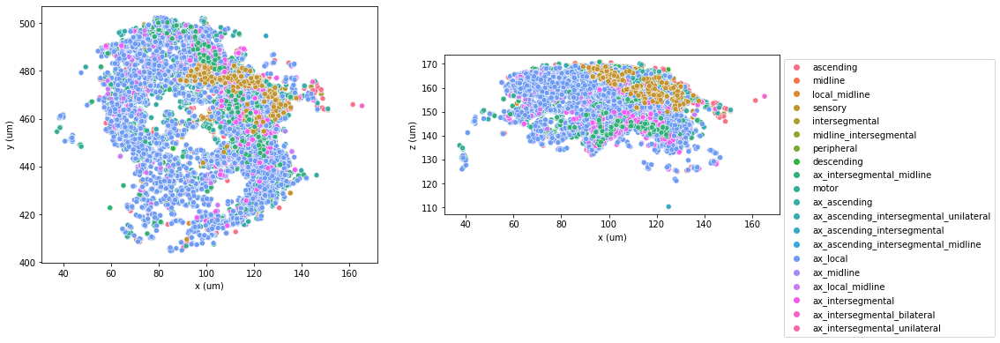

In [50]:
plot_entire_without(updated_df)

In [51]:
# plots a cell type (i.e. tactile, gustatory)
# only pass in a list
def plot_a_cell_type(cell_types):
    shape = ''
    for cell_type in cell_types:
        this_df = updated_df.loc[(updated_df['cell_type_syn'] == cell_type) 
                               & (updated_df['classification_system'] != 'local')]
        pos_df = convert_to_microns(this_df['pre_pt_position'])
        x4 = pos_df[:, 0]
        y4 = pos_df[:, 1]
        z4 = pos_df[:, 2]
        # setting up size and axis handle for plot
        a4_dims = (15, 10)
        fig, ax = pyplot.subplots(1,2,figsize=a4_dims)
        # plots synapses with seaborn module based on classification system
        sns.scatterplot(x=x4, y=y4, hue=this_df.classification_system,legend=False, ax=ax[0], alpha=1).set_title(cell_type)
        #ax[0].set_aspect('equal')
        ax[0].set_xlim(30, 180)
        ax[0].set_ylim(400, 520)
        ax[0].set_xlabel('x (um)')
        ax[0].set_ylabel('y (um)')
        sns.scatterplot(x=x4, y=z4, hue=this_df.classification_system,legend='full', ax=ax[1], alpha=1)
        #ax[1].set_aspect('equal')
        ax[1].set_xlim(30, 170)
        ax[1].set_ylim(105, 180)
        ax[1].set_xlabel('x (um)')
        ax[1].set_ylabel('z (um)')
        plt.legend(loc = 2, bbox_to_anchor = (1,1))
        shape = shape + str(this_df.shape)
    return shape

'(10852, 6)(7444, 6)'

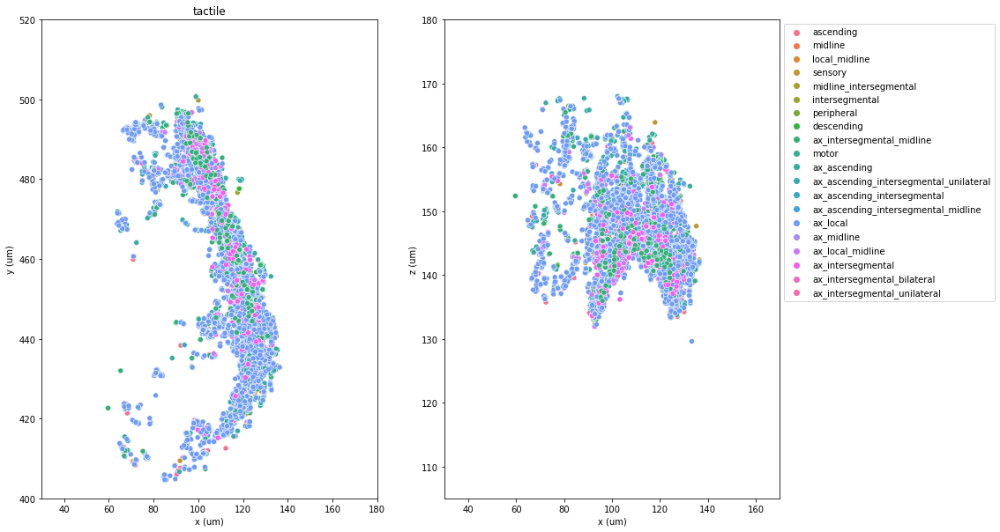

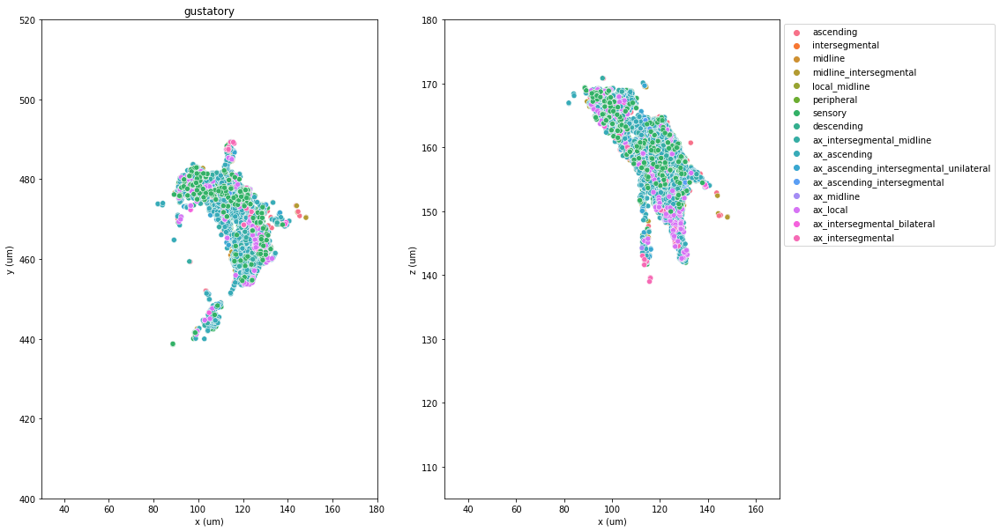

In [52]:
plot_a_cell_type(['tactile', 'gustatory'])

'(2407, 6)(5965, 6)'

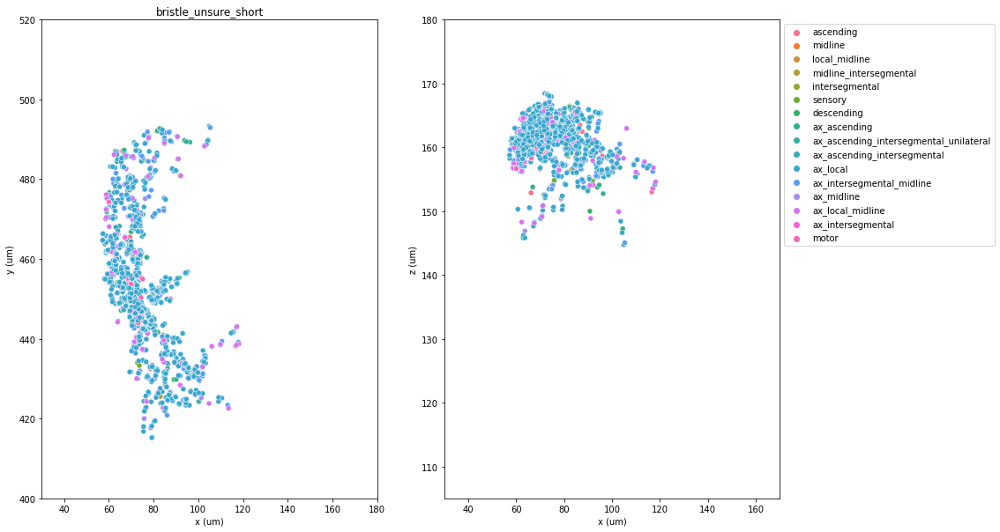

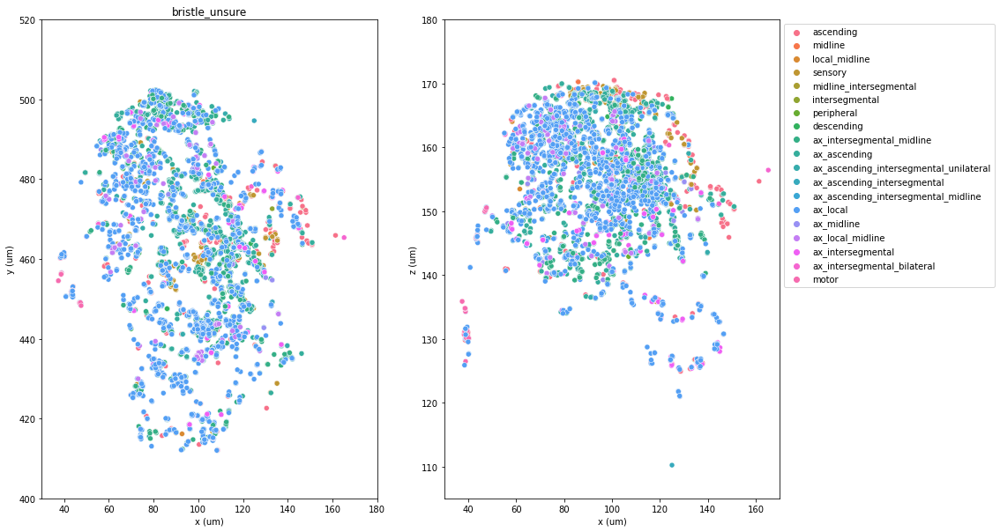

In [53]:
plot_a_cell_type(['bristle_unsure_short','bristle_unsure'])

array([[131.3005, 463.4411, 156.06  ],
       [119.9743, 454.1359, 158.265 ],
       [100.9339, 442.2163, 154.17  ],
       ...,
       [ 60.0065, 474.2771, 156.6   ],
       [ 60.0237, 474.3631, 156.6   ],
       [ 60.0323, 474.3029, 156.645 ]])

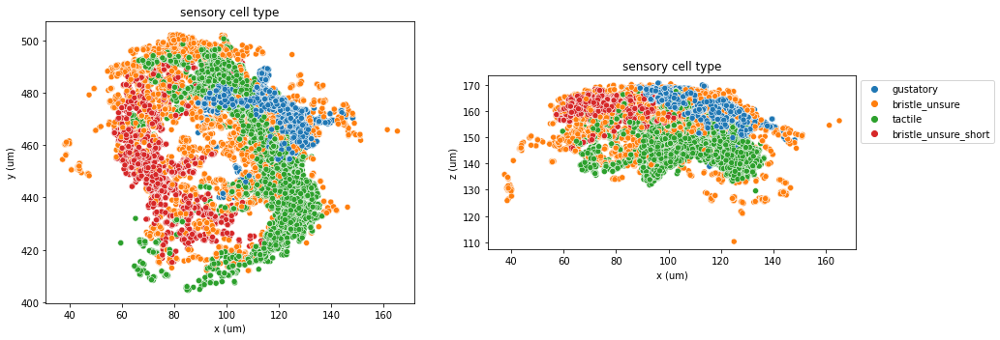

In [54]:
plot_entire(updated_df, 'sensory cell type', updated_df.cell_type_syn)

array([[131.3005, 463.4411, 156.06  ],
       [131.5413, 463.5443, 155.295 ],
       [110.2907, 448.2019, 166.185 ],
       ...,
       [ 98.6119, 441.5197, 168.84  ],
       [128.6087, 470.3211, 156.78  ],
       [116.8611, 461.0933, 160.74  ]])

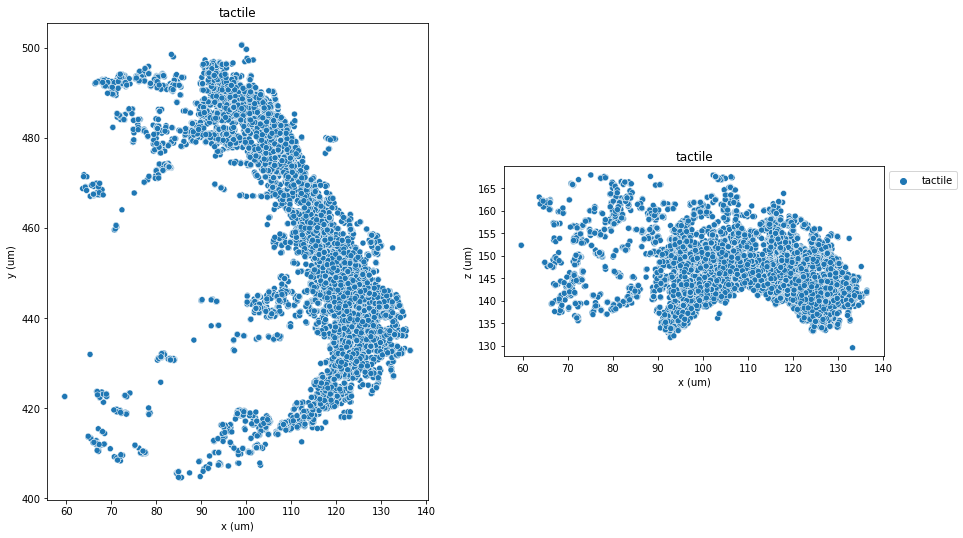

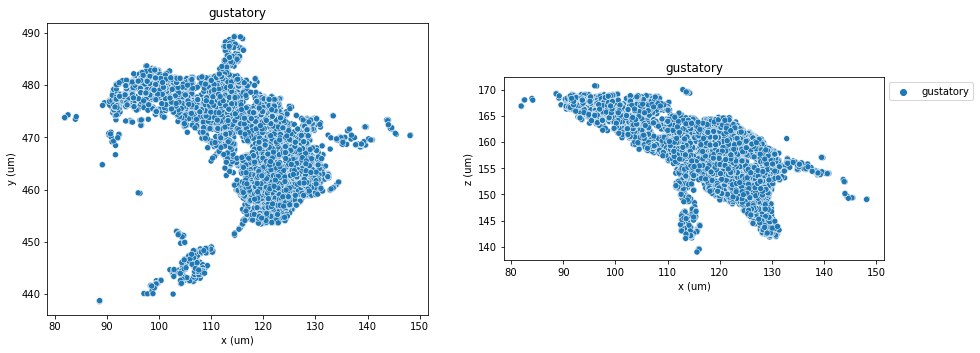

In [55]:
# plots with axes being equalized
plot_entire(tactile_df, 'tactile', tactile_df.cell_type_syn)
plot_entire(gustatory_df, 'gustatory', gustatory_df.cell_type_syn)

array([[119.7249, 454.6691, 157.86  ],
       [119.7077, 454.6949, 157.815 ],
       [119.7335, 454.6175, 157.905 ],
       ...,
       [ 98.6119, 441.5197, 168.84  ],
       [128.6087, 470.3211, 156.78  ],
       [116.8611, 461.0933, 160.74  ]])

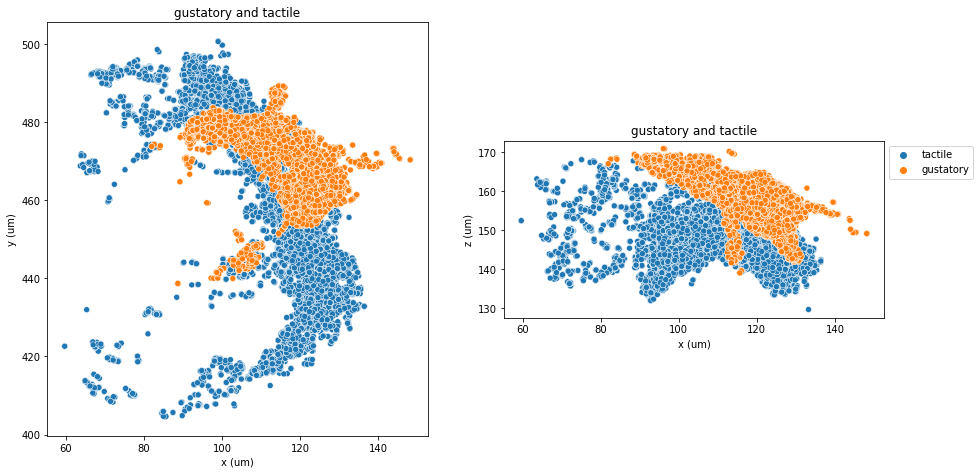

In [56]:
plot_entire(no_unsure_df, 'gustatory and tactile', no_unsure_df.cell_type_syn)

,classification_system,cell_type_syn,pt_root_id_dwn,post_pt_root_id,pre_pt_position,pre_pt_root_id
0,ascending,gustatory,648518346504802694,648518346504802694,"[30535, 107777, 3468]",648518346486271136
1,ascending,bristle_unsure,648518346504802694,648518346504802694,"[27901, 105613, 3517]",648518346493973134
2,ascending,bristle_unsure,648518346504802694,648518346504802694,"[23473, 102841, 3426]",648518346493973134
3,ascending,bristle_unsure,648518346504802694,648518346504802694,"[23435, 102855, 3426]",648518346493973134
4,ascending,gustatory,648518346504802694,648518346504802694,"[30591, 107801, 3451]",648518346490998904
...,...,...,...,...,...,...
14615,ascending,bristle_unsure,648518346496845284,648518346496845284,"[24159, 103231, 3550]",648518346490400604
14616,ascending,bristle_unsure,648518346496845284,648518346496845284,"[23663, 103331, 3466]",648518346490400604
14617,ascending,bristle_unsure_short,648518346496845284,648518346496845284,"[16839, 108861, 3616]",648518346495261622
14618,ascending,bristle_unsure,648518346496845284,648518346496845284,"[23933, 105683, 3574]",648518346494129655


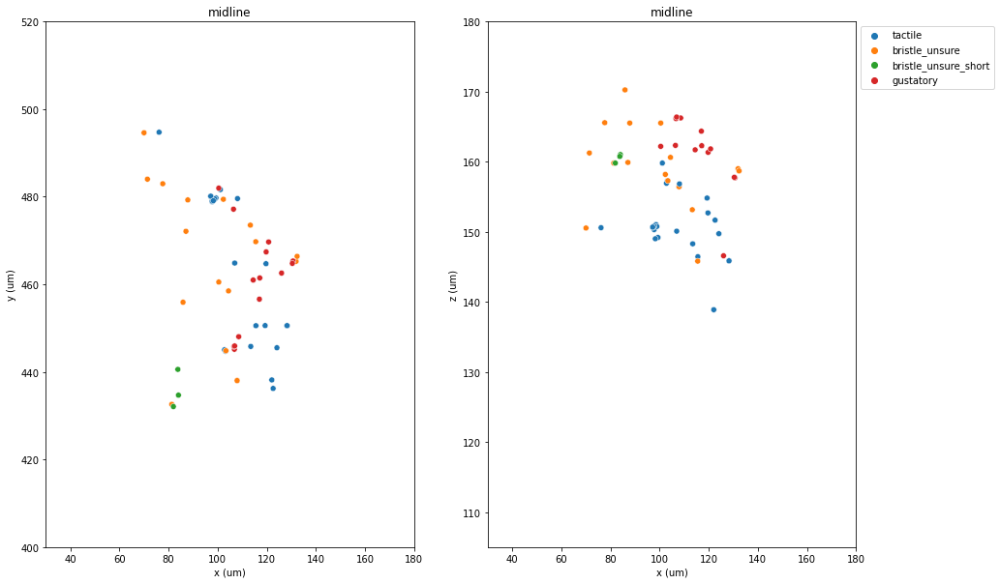

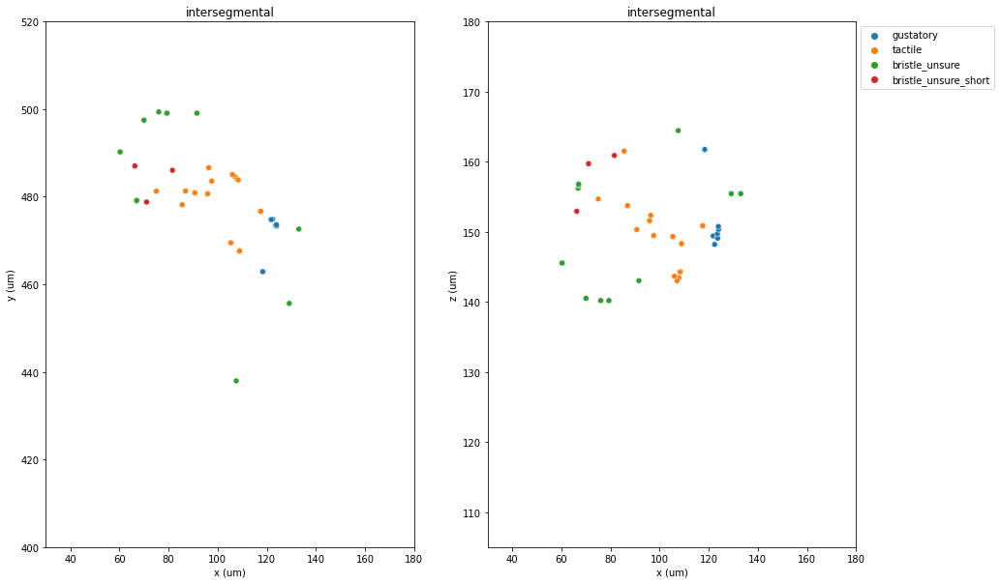

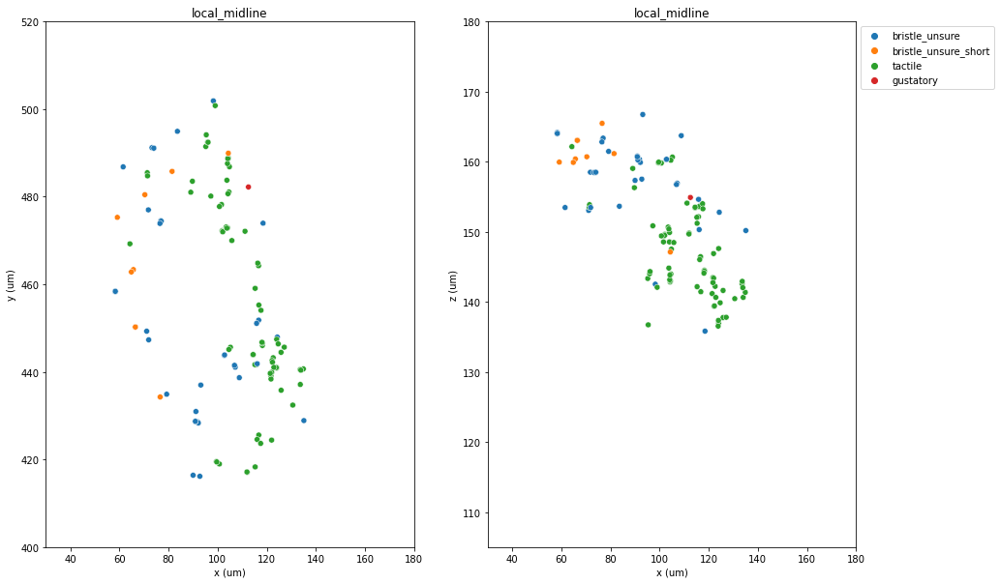

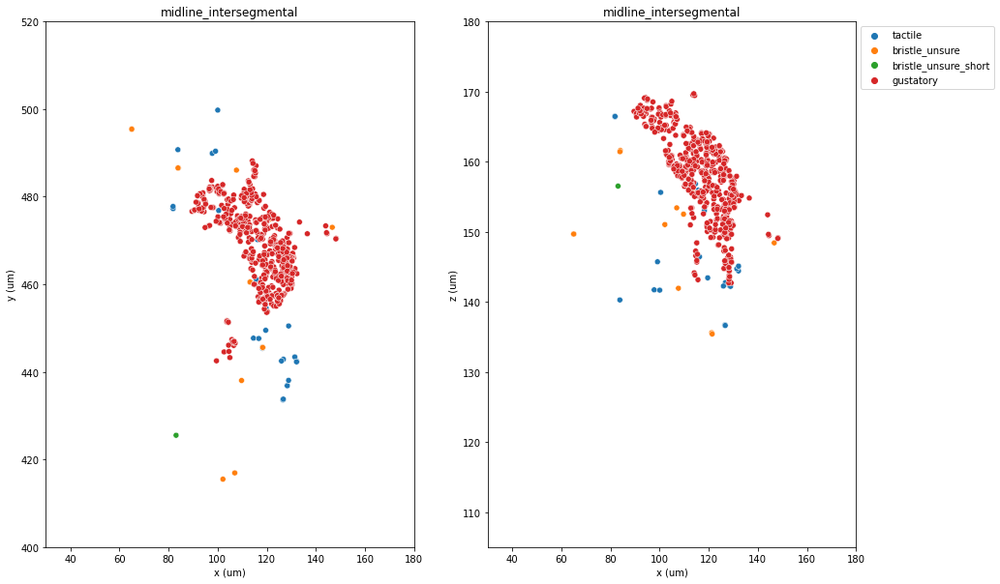

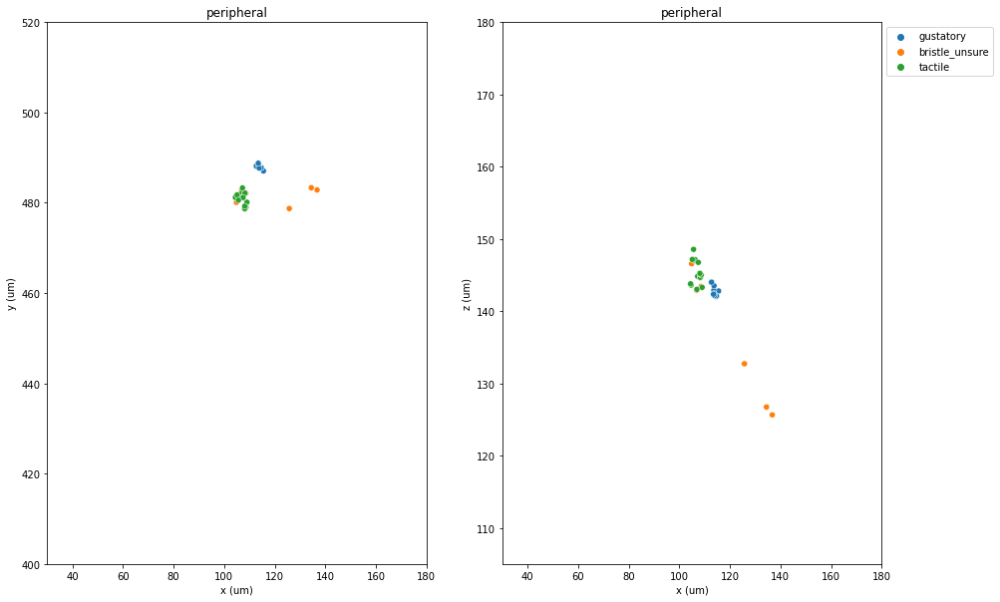

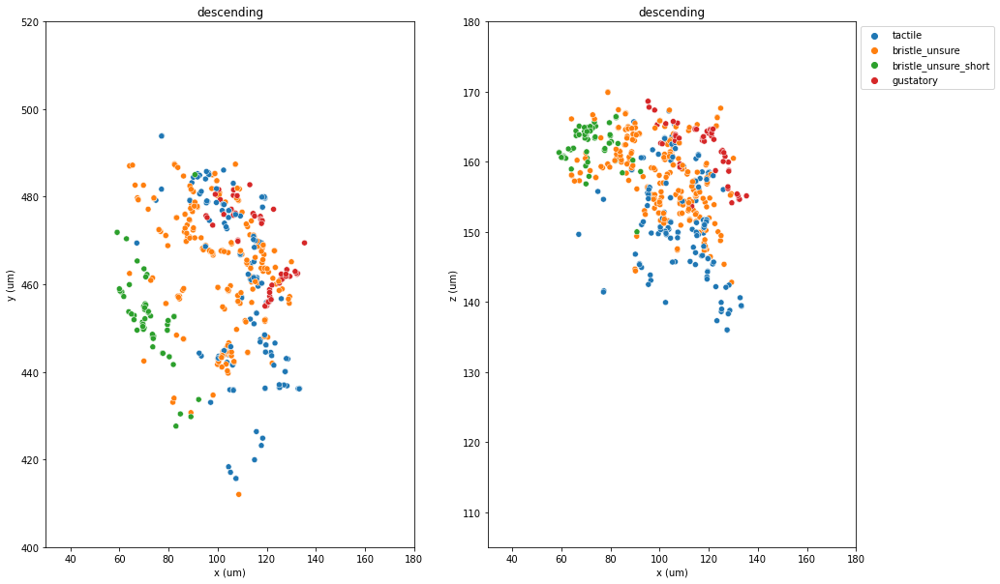

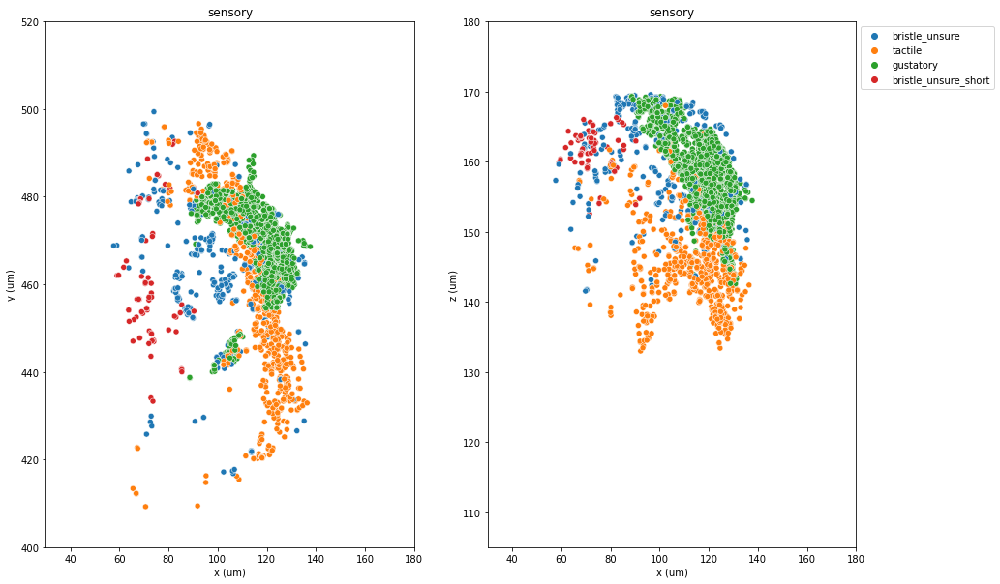

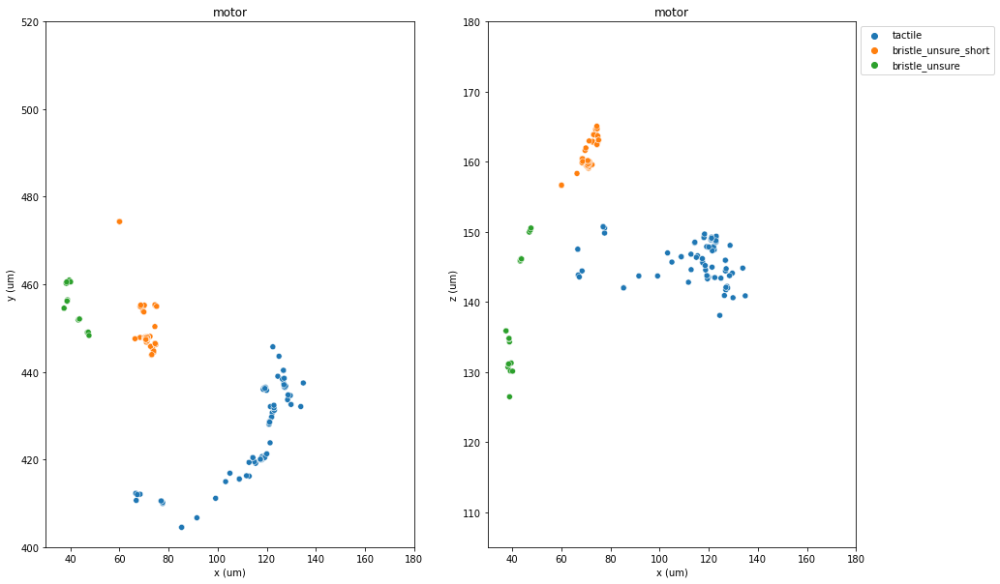

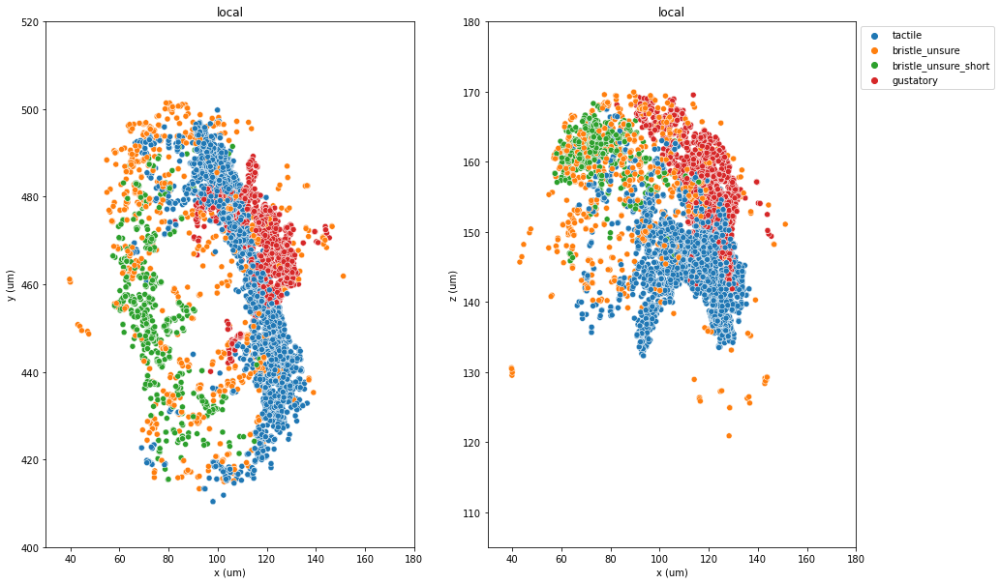

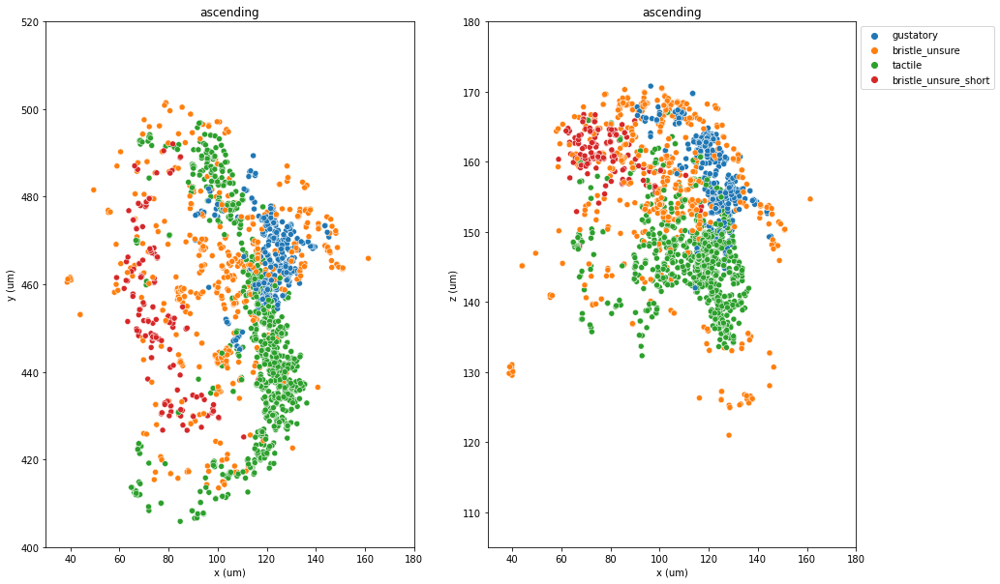

In [57]:
## plotting based on each class' synaptic locations

plot_a_class(updated_df,'midline','cell_type_syn')
plot_a_class(updated_df,'intersegmental','cell_type_syn')
plot_a_class(updated_df,'local_midline','cell_type_syn')
plot_a_class(updated_df,'midline_intersegmental','cell_type_syn')
plot_a_class(updated_df,'peripheral','cell_type_syn')
plot_a_class(updated_df,'descending','cell_type_syn')
plot_a_class(updated_df,'sensory','cell_type_syn')
plot_a_class(updated_df,'motor','cell_type_syn')
plot_a_class(updated_df,'local','cell_type_syn')
plot_a_class(updated_df,'ascending','cell_type_syn')

C:\Users\trnan\anaconda3\envs\micronsbinder\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.


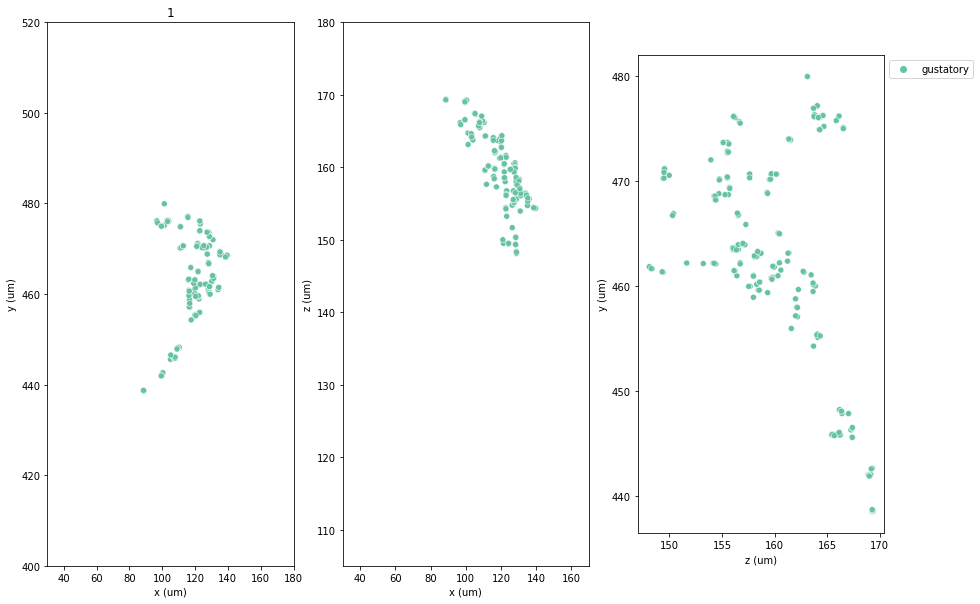

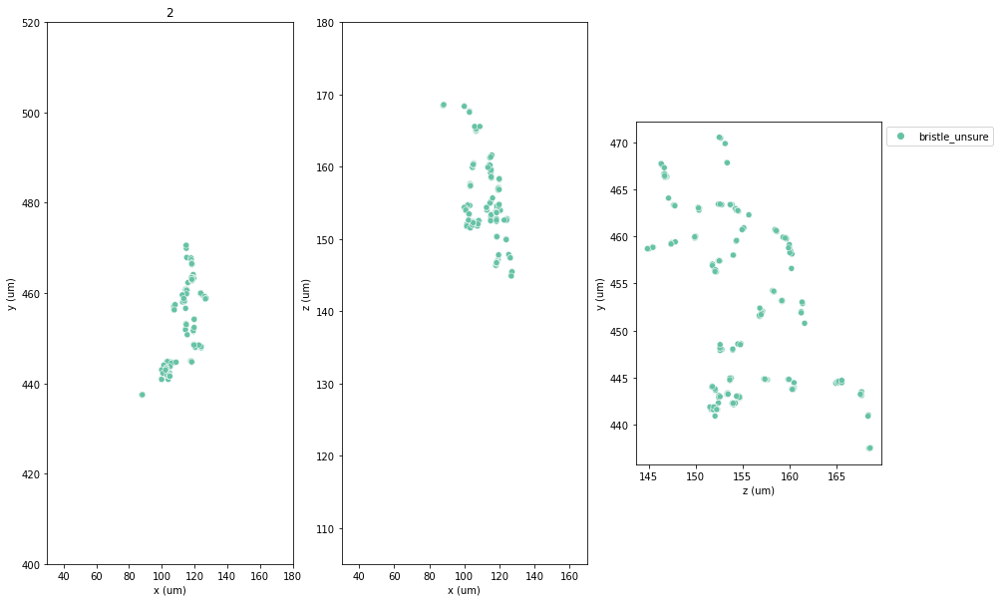

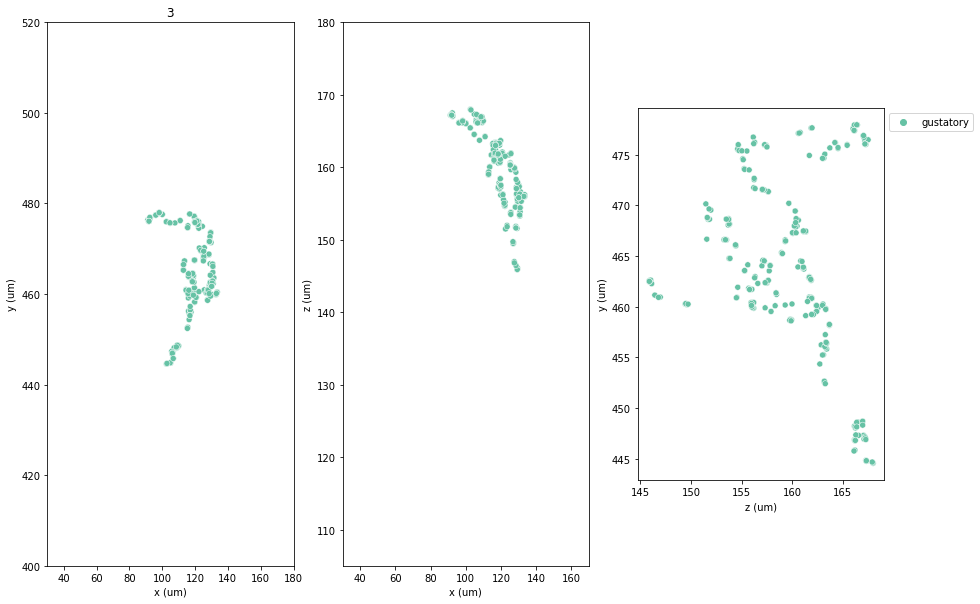

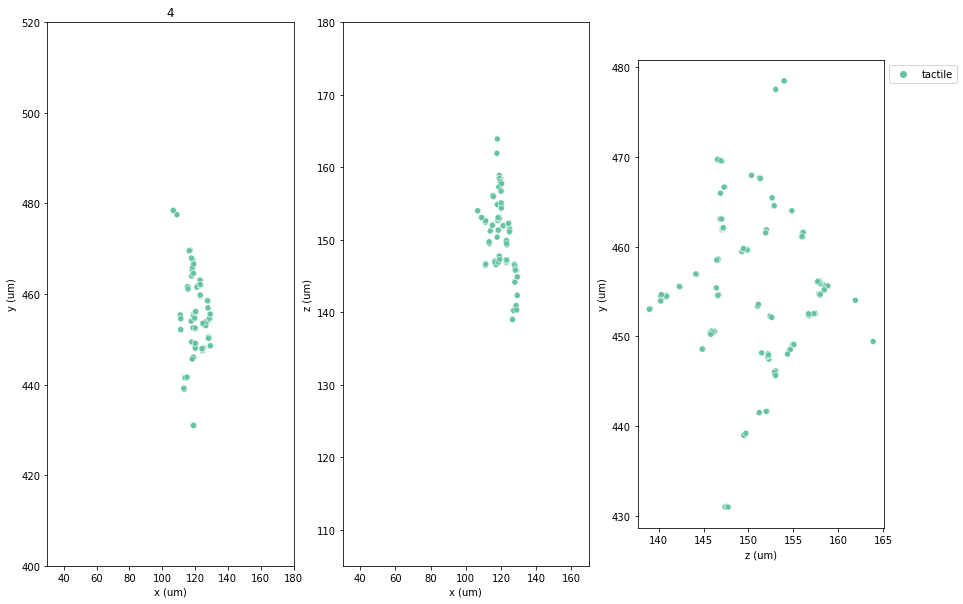

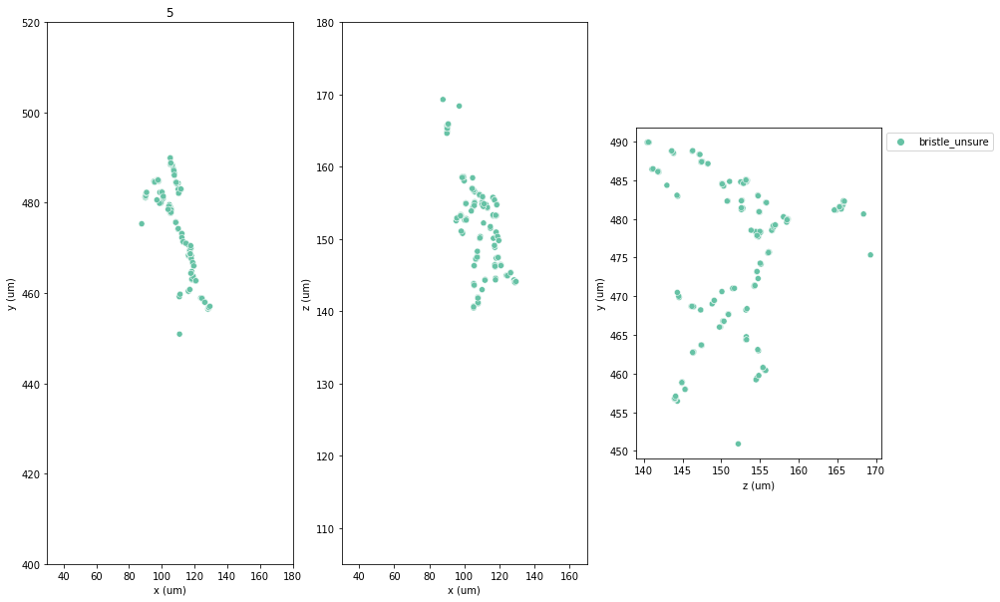

...

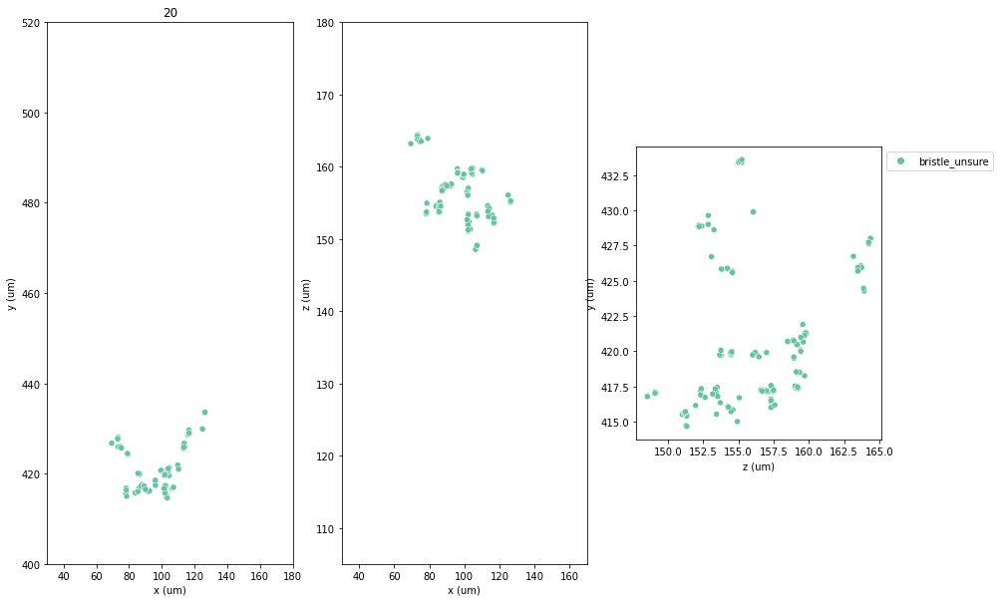

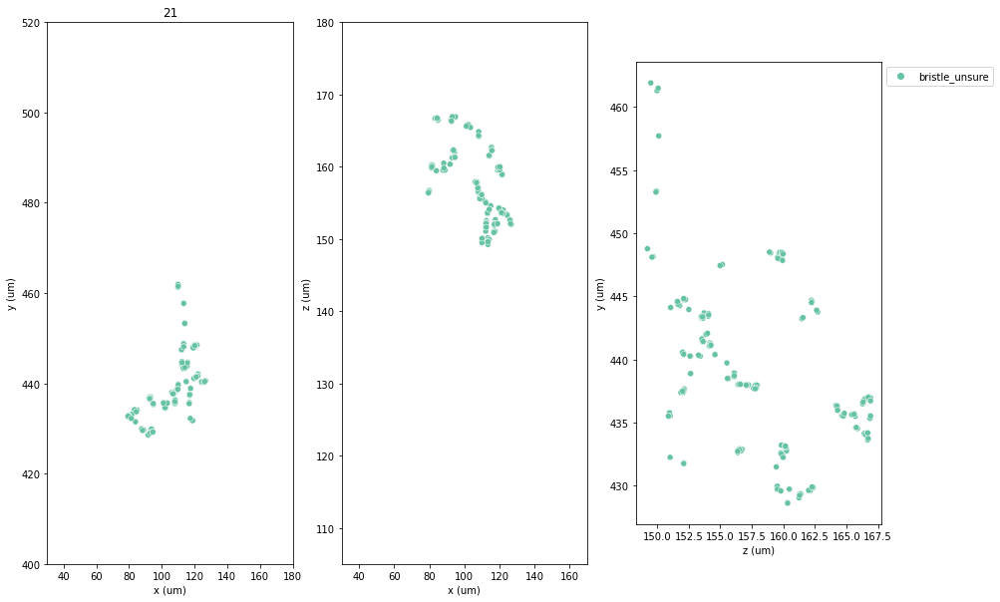

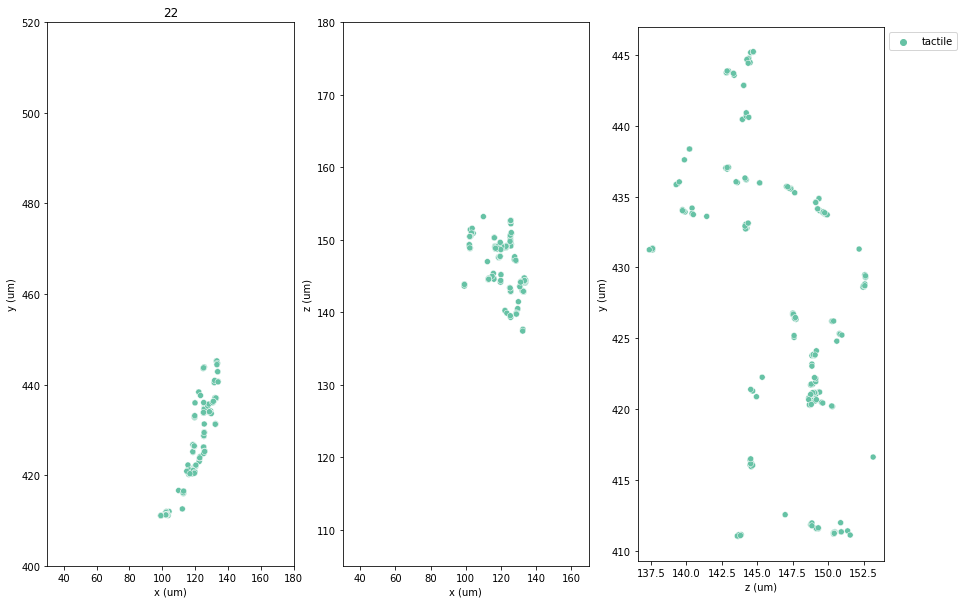

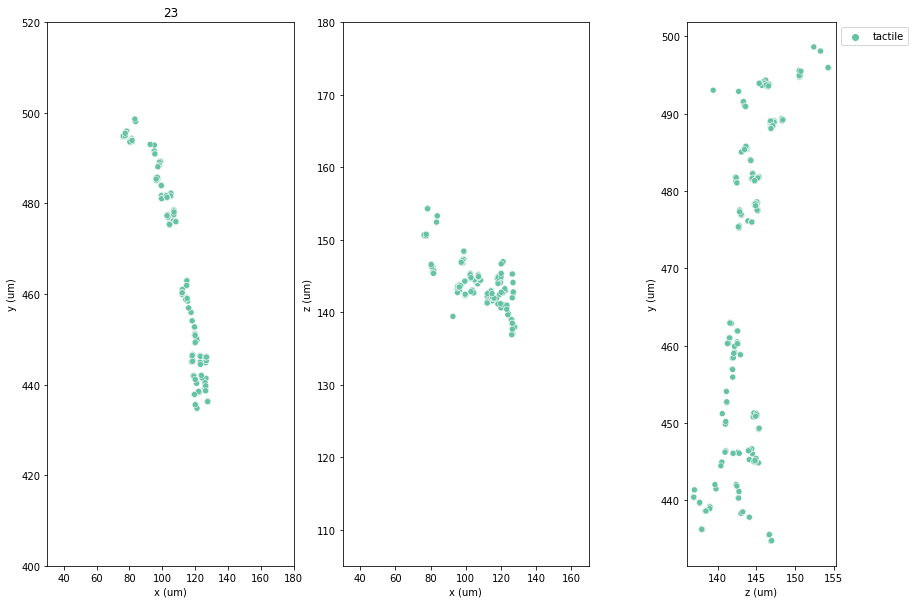

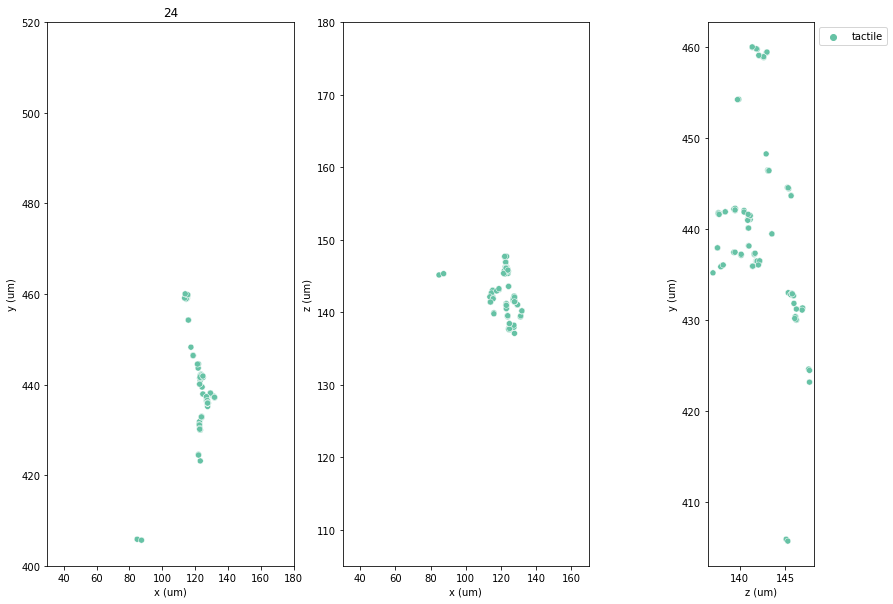

In [59]:
## Gustatory individual synaptic locations in xy, xy, yz

plot_a_bristle([648518346486271136, 648518346493973134, 648518346490998904,
       648518346478891216, 648518346488625742, 648518346490400604,
       648518346490411100, 648518346494129655, 648518346483186878,
       648518346496820708, 648518346486270112, 648518346509047674,
       648518346479212732, 648518346495189174, 648518346480454913,
       648518346489480829, 648518346493061404, 648518346514401735,
       648518346481010522, 648518346491041057, 648518346494006283,
       648518346503004027, 648518346491054369, 648518346486176866],
                updated_df, 'cell_type_syn')

In [60]:
def histoplot_entire(df, x_axis='x', bins=30):
    pos_df = convert_to_microns(df['pre_pt_position'])
    x = pos_df[:, 0]
    y = pos_df[:, 1]
    z = pos_df[:, 2]
    if x_axis =='x':
        ax = sns.histplot(x=x,kde=True,bins=bins)
        ax.set_xlabel('x (um)')
        plt.xlim(30, 170)
    elif x_axis =='y':
        ax = sns.histplot(x=y,kde=True,bins=bins)
        ax.set_xlabel('y (um)')
        plt.xlim(400, 520)
    else:
        ax = sns.histplot(x=z,kde=True,bins=bins)
        ax.set_xlabel('z (um)')
        plt.xlim(105, 180)
    plt.figure()

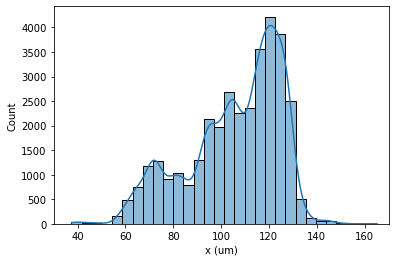

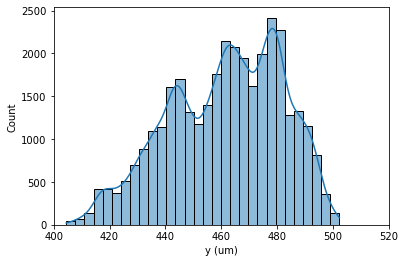

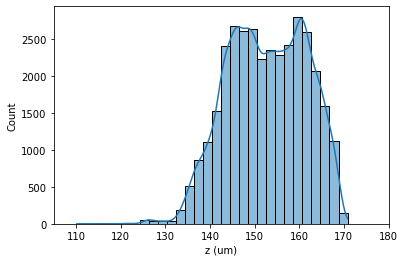

<Figure size 432x288 with 0 Axes>

In [61]:
histoplot_entire(updated_df, x_axis='x')
histoplot_entire(updated_df, x_axis='y')
histoplot_entire(updated_df, x_axis='z')

In [62]:
def histoplot_entire_class_layer(df, x_axis='x', bins=30, hue='classification_system',
                                 kde=True, multiple='layer', element='bars'):
    pos_df = convert_to_microns(df['pre_pt_position'])
    x = pos_df[:, 0]
    y = pos_df[:, 1]
    z = pos_df[:, 2]
    if x_axis =='x':
        ax = sns.histplot(x=x,kde=kde,bins=bins,hue=df.loc[:,hue],multiple=multiple,element=element)
        plt.xlabel('x (um)')
        plt.xlim(30, 170)
    elif x_axis =='y':
        ax = sns.histplot(x=y,kde=kde,bins=bins,hue=df.loc[:,hue],multiple=multiple,element=element)
        plt.xlabel('y (um)')
        plt.xlim(400, 520)
    else:
        ax = sns.histplot(x=z,kde=kde,bins=bins,hue=df.loc[:,hue],multiple=multiple,element=element)
        plt.xlabel('z (um)')
        plt.xlim(105, 180)
    sns.move_legend(ax, "upper right",frameon=False,bbox_to_anchor=(1.5, 1))
    plt.figure()

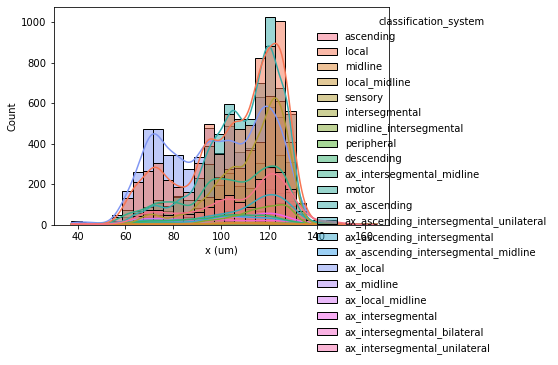

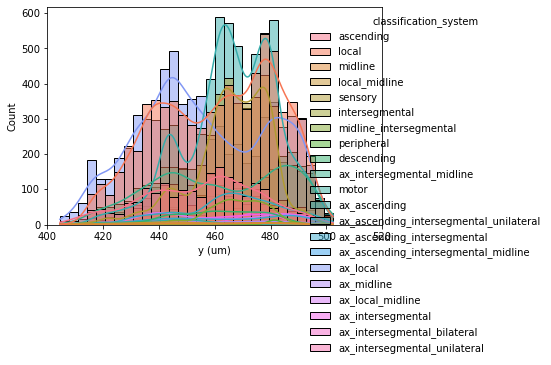

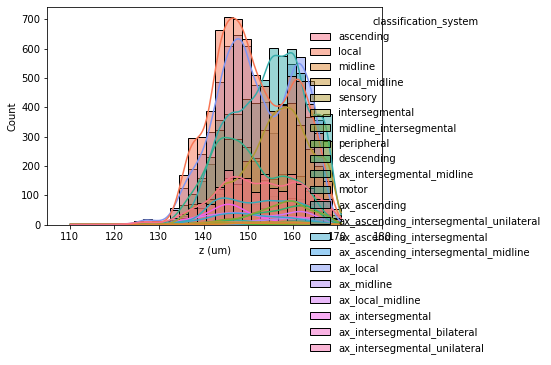

<Figure size 432x288 with 0 Axes>

In [63]:
histoplot_entire_class_layer(updated_df, x_axis='x',hue='classification_system')
histoplot_entire_class_layer(updated_df, x_axis='y',hue='classification_system')
histoplot_entire_class_layer(updated_df, x_axis='z',hue='classification_system')

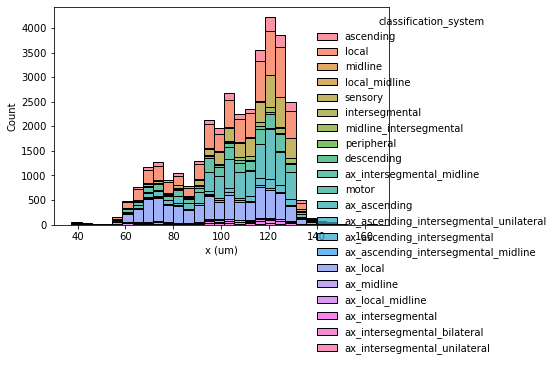

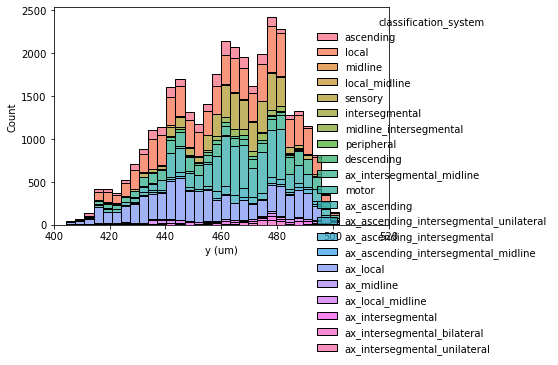

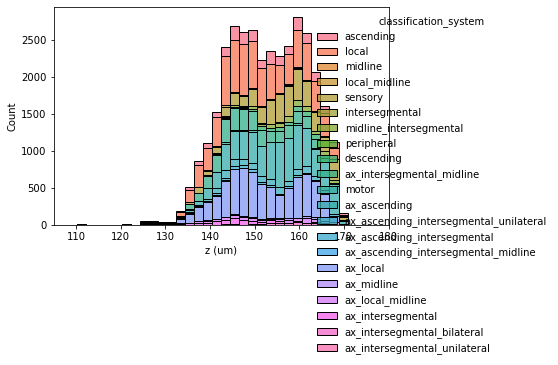

<Figure size 432x288 with 0 Axes>

In [64]:
histoplot_entire_class_layer(updated_df, x_axis='x',hue='classification_system',multiple='stack',kde=False)
histoplot_entire_class_layer(updated_df, x_axis='y',hue='classification_system',multiple='stack',kde=False)
histoplot_entire_class_layer(updated_df, x_axis='z',hue='classification_system',multiple='stack',kde=False)

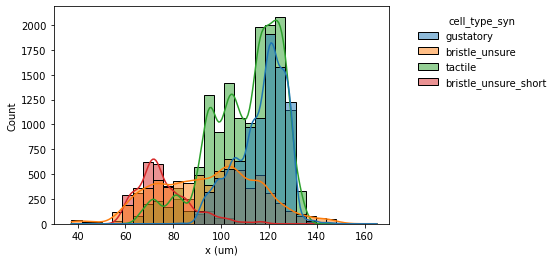

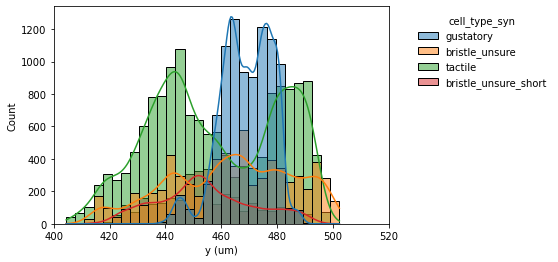

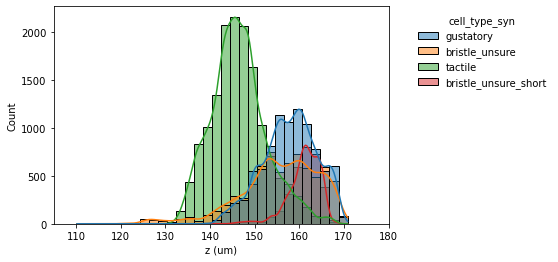

<Figure size 432x288 with 0 Axes>

In [65]:
histoplot_entire_class_layer(updated_df, x_axis='x',hue='cell_type_syn')
histoplot_entire_class_layer(updated_df, x_axis='y',hue='cell_type_syn')
histoplot_entire_class_layer(updated_df, x_axis='z',hue='cell_type_syn')

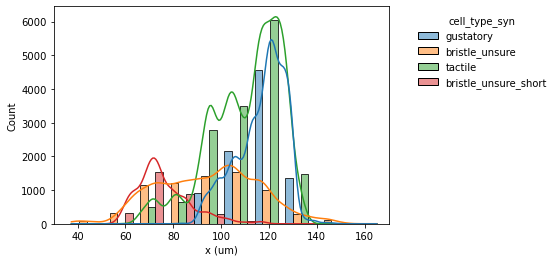

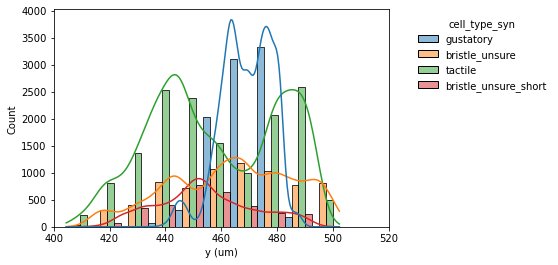

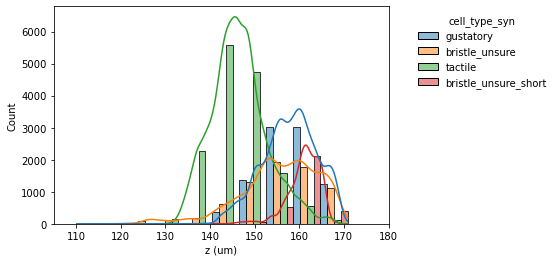

<Figure size 432x288 with 0 Axes>

In [66]:
histoplot_entire_class_layer(updated_df, x_axis='x',hue='cell_type_syn',multiple='dodge',bins=10)
histoplot_entire_class_layer(updated_df, x_axis='y',hue='cell_type_syn',multiple='dodge',bins=10)
histoplot_entire_class_layer(updated_df, x_axis='z',hue='cell_type_syn',multiple='dodge',bins=10)

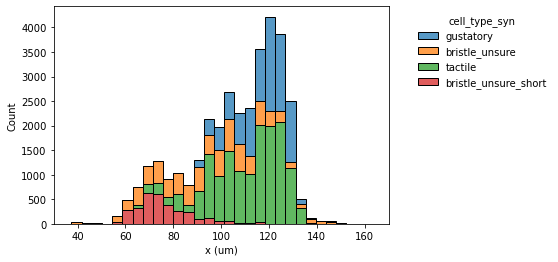

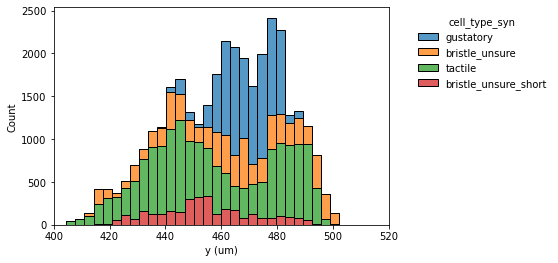

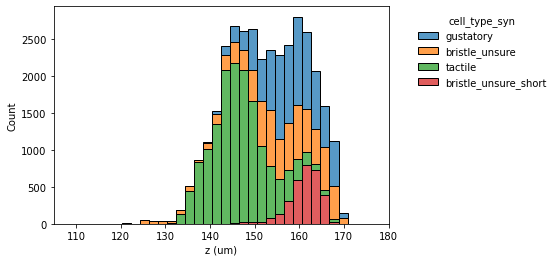

<Figure size 432x288 with 0 Axes>

In [67]:
histoplot_entire_class_layer(updated_df, x_axis='x',hue='cell_type_syn',multiple='stack',bins=30,kde=False)
histoplot_entire_class_layer(updated_df, x_axis='y',hue='cell_type_syn',multiple='stack',bins=30,kde=False)
histoplot_entire_class_layer(updated_df, x_axis='z',hue='cell_type_syn',multiple='stack',bins=30,kde=False)

In [68]:
def histoplot_a_bristle(bristle_list, df, x_axis='x', bins=30, hue='classification_system',
                        kde=True, multiple='layer', element='bars', binwidth=None):
    for pt_root_id in bristle_list:
        bristle = pt_root_id
        syn_df = df[df.pre_pt_root_id==pt_root_id]
        pos_df = convert_to_microns(syn_df['pre_pt_position'])
        x = pos_df[:, 0]
        y = pos_df[:, 1]
        z = pos_df[:, 2]
        if x_axis =='x':
            ax = sns.histplot(x=x,kde=kde,bins=bins,hue=syn_df.loc[:,hue],multiple=multiple,element=element,binwidth=binwidth)
            plt.xlabel('x (um)')
            plt.xlim(30, 170)
            plt.ylim(0, 200)
        elif x_axis =='y':
            ax = sns.histplot(x=y,kde=kde,bins=bins,hue=syn_df.loc[:,hue],multiple=multiple,element=element,binwidth=binwidth)
            plt.xlabel('y (um)')
            plt.xlim(400, 520)
            plt.ylim(0, 200)
        else:
            ax = sns.histplot(x=z,kde=kde,bins=bins,hue=syn_df.loc[:,hue],multiple=multiple,element=element,binwidth=binwidth)
            plt.xlabel('z (um)')  
            plt.xlim(105, 180)
            plt.ylim(0, 200)
        ax.set_title(str(bristle))
        sns.move_legend(ax, "upper right",frameon=False,bbox_to_anchor=(1.5, 1))
        plt.figure()

C:\Users\trnan\anaconda3\envs\micronsbinder\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


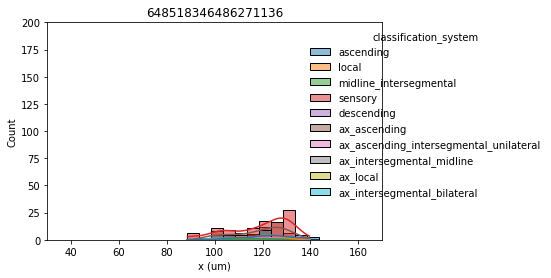

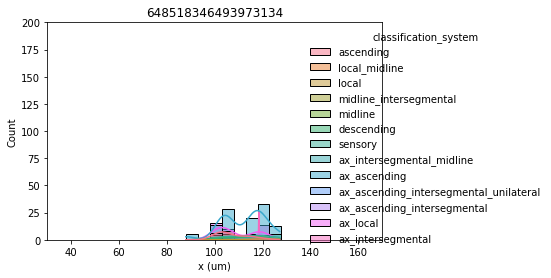

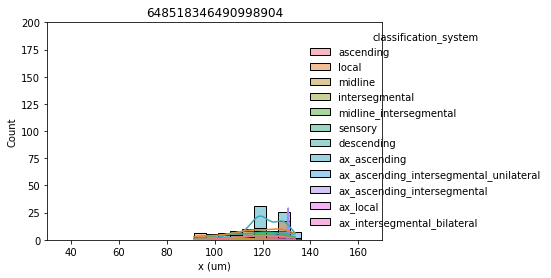

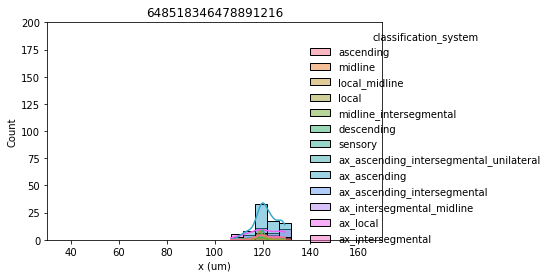

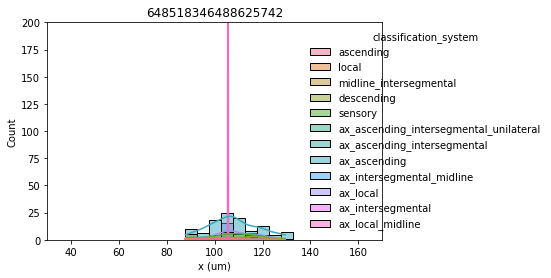

...

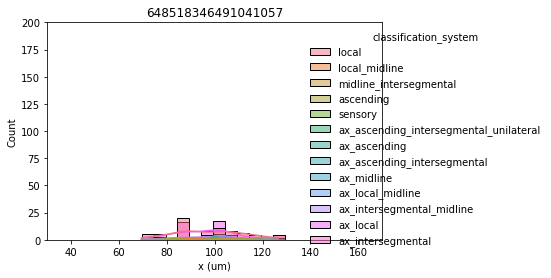

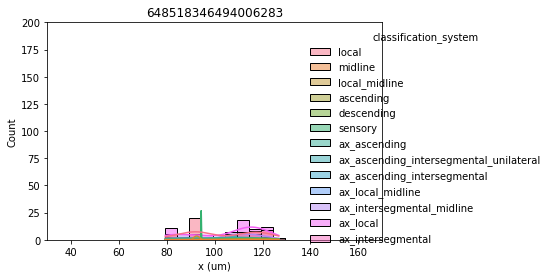

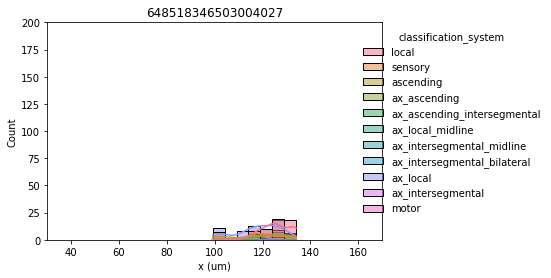

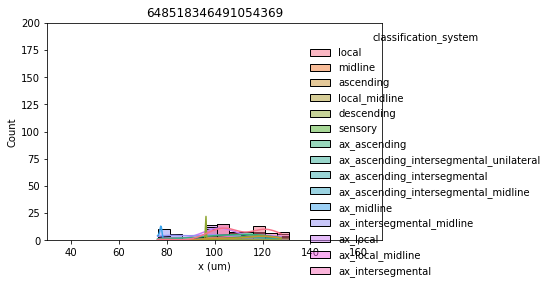

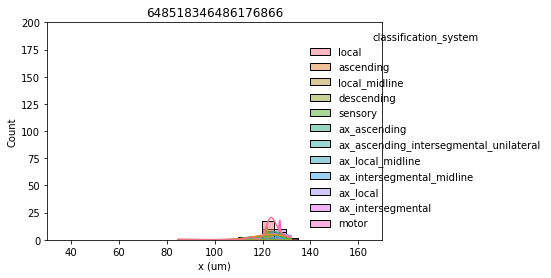

<Figure size 432x288 with 0 Axes>

In [70]:
histoplot_a_bristle([648518346486271136, 648518346493973134, 648518346490998904,
       648518346478891216, 648518346488625742, 648518346490400604,
       648518346490411100, 648518346494129655, 648518346483186878,
       648518346496820708, 648518346486270112, 648518346509047674,
       648518346479212732, 648518346495189174, 648518346480454913,
       648518346489480829, 648518346493061404, 648518346514401735,
       648518346481010522, 648518346491041057, 648518346494006283,
       648518346503004027, 648518346491054369, 648518346486176866], 
                    updated_df, hue='classification_system',x_axis='x', binwidth=5)

C:\Users\trnan\anaconda3\envs\micronsbinder\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


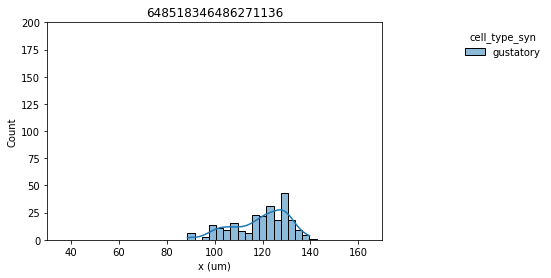

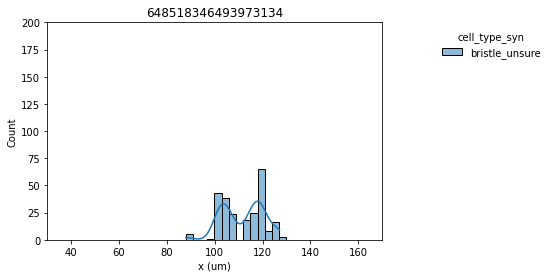

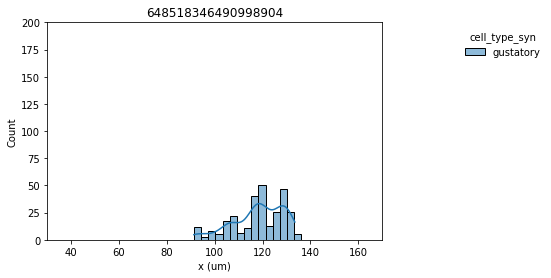

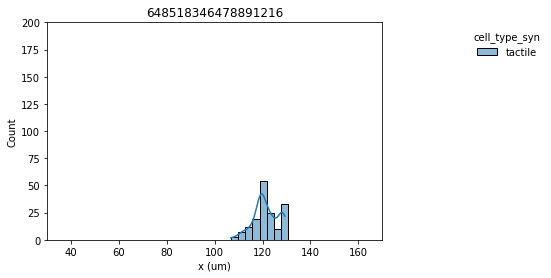

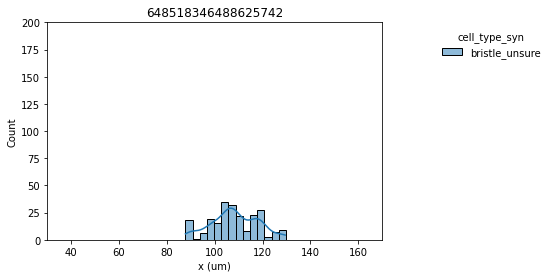

...

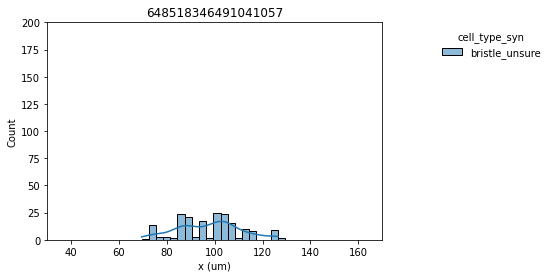

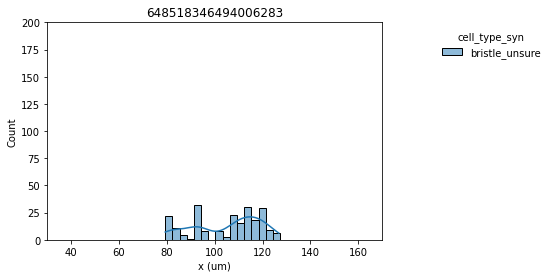

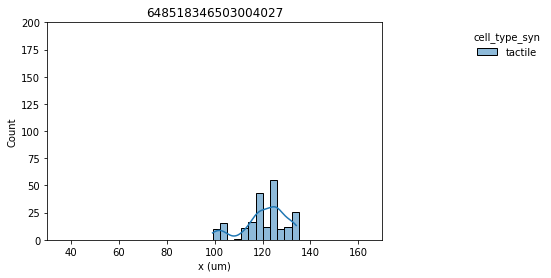

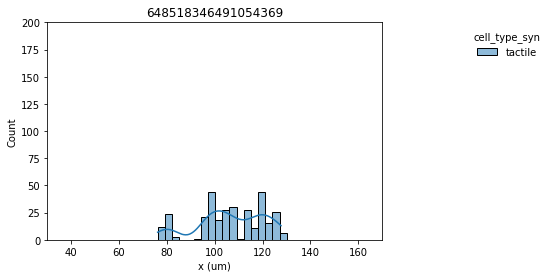

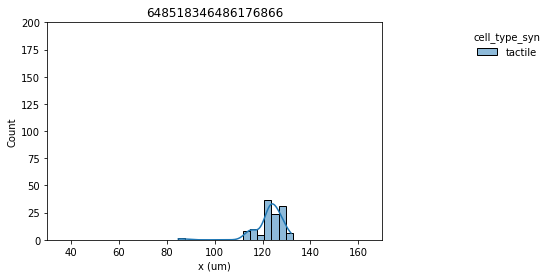

<Figure size 432x288 with 0 Axes>

In [71]:
histoplot_a_bristle([648518346486271136, 648518346493973134, 648518346490998904,
       648518346478891216, 648518346488625742, 648518346490400604,
       648518346490411100, 648518346494129655, 648518346483186878,
       648518346496820708, 648518346486270112, 648518346509047674,
       648518346479212732, 648518346495189174, 648518346480454913,
       648518346489480829, 648518346493061404, 648518346514401735,
       648518346481010522, 648518346491041057, 648518346494006283,
       648518346503004027, 648518346491054369, 648518346486176866], 
                    updated_df, hue='cell_type_syn',x_axis='x',bins=None,binwidth=3)

C:\Users\trnan\anaconda3\envs\micronsbinder\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


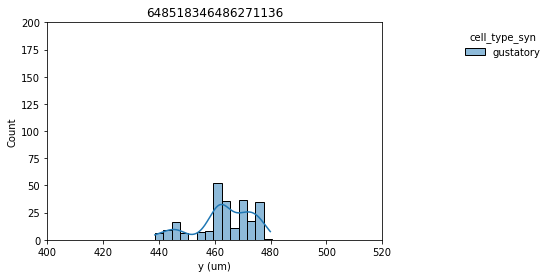

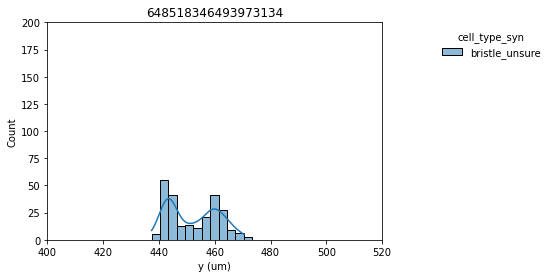

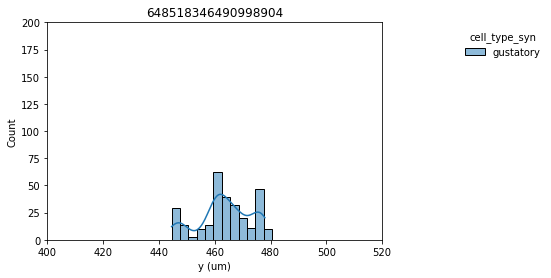

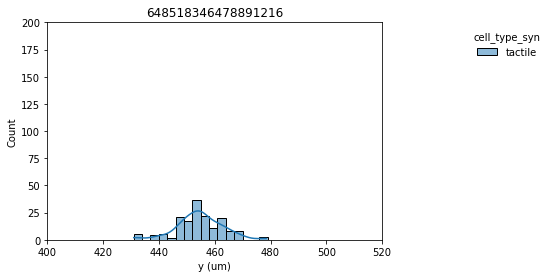

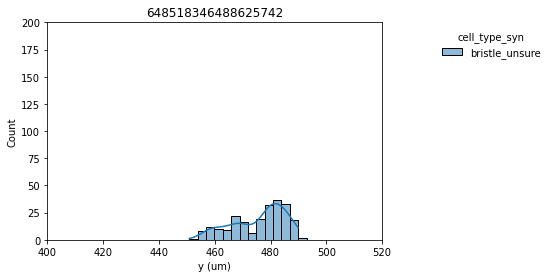

...

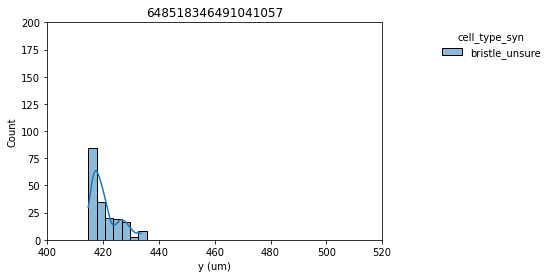

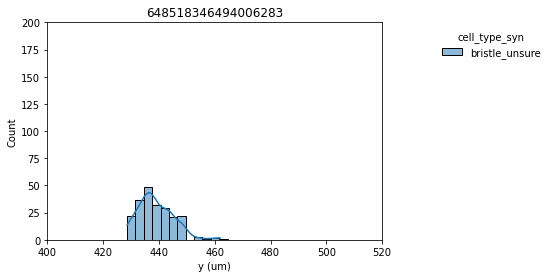

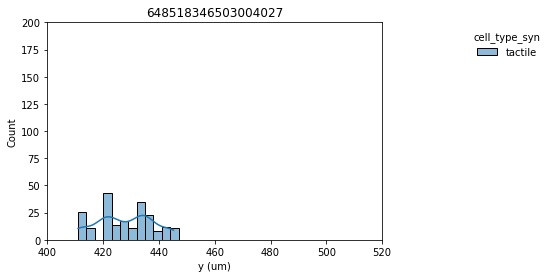

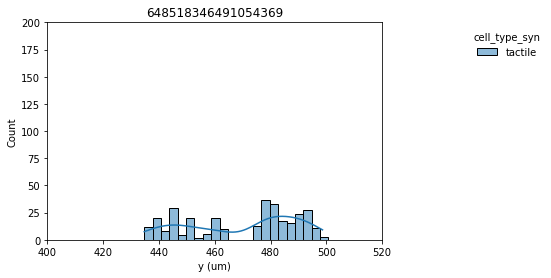

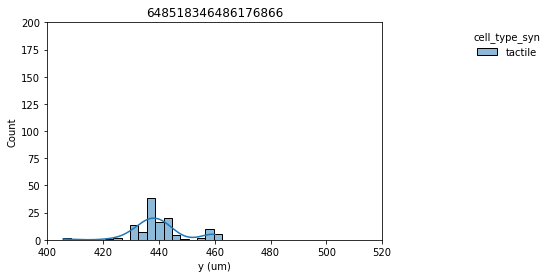

<Figure size 432x288 with 0 Axes>

In [72]:
histoplot_a_bristle([648518346486271136, 648518346493973134, 648518346490998904,
       648518346478891216, 648518346488625742, 648518346490400604,
       648518346490411100, 648518346494129655, 648518346483186878,
       648518346496820708, 648518346486270112, 648518346509047674,
       648518346479212732, 648518346495189174, 648518346480454913,
       648518346489480829, 648518346493061404, 648518346514401735,
       648518346481010522, 648518346491041057, 648518346494006283,
       648518346503004027, 648518346491054369, 648518346486176866], 
                    updated_df, hue='cell_type_syn',x_axis='y', binwidth=3)

C:\Users\trnan\anaconda3\envs\micronsbinder\lib\site-packages\ipykernel_launcher.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


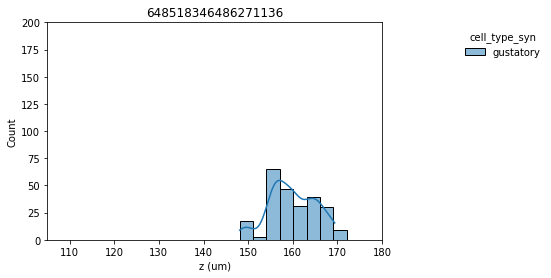

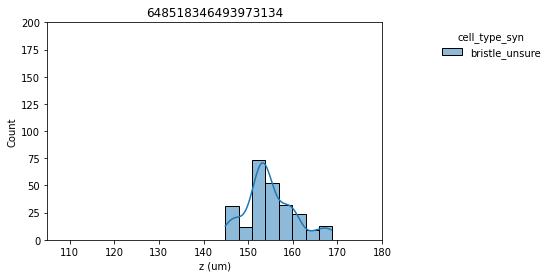

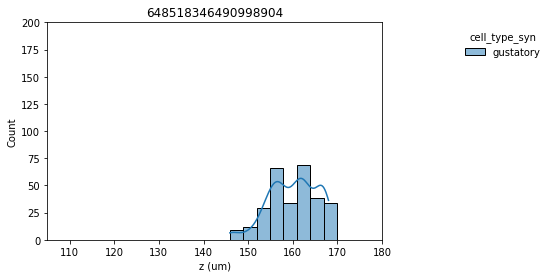

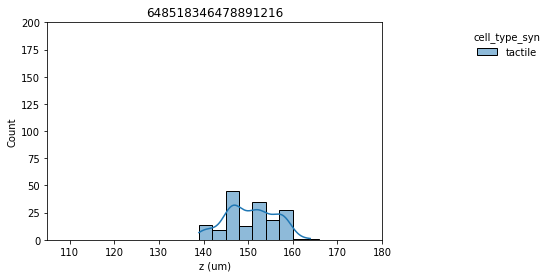

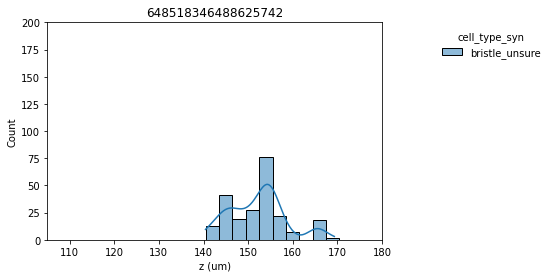

...

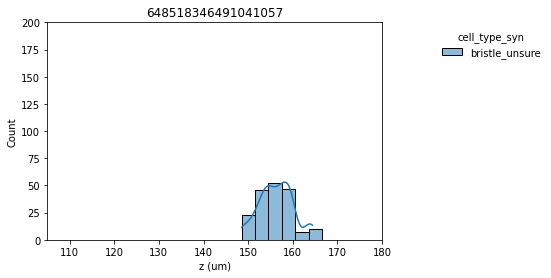

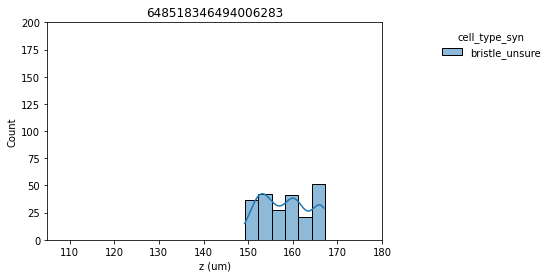

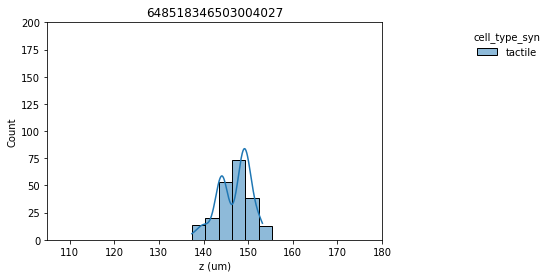

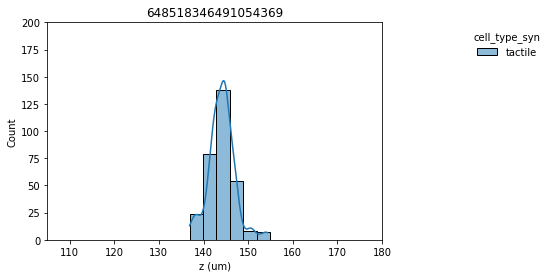

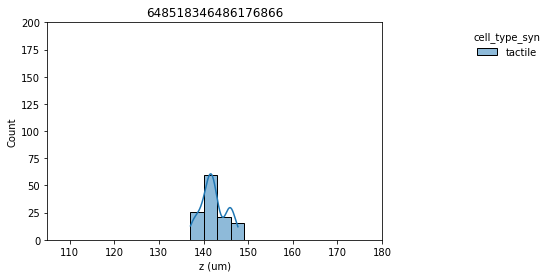

<Figure size 432x288 with 0 Axes>

In [73]:
histoplot_a_bristle([648518346486271136, 648518346493973134, 648518346490998904,
       648518346478891216, 648518346488625742, 648518346490400604,
       648518346490411100, 648518346494129655, 648518346483186878,
       648518346496820708, 648518346486270112, 648518346509047674,
       648518346479212732, 648518346495189174, 648518346480454913,
       648518346489480829, 648518346493061404, 648518346514401735,
       648518346481010522, 648518346491041057, 648518346494006283,
       648518346503004027, 648518346491054369, 648518346486176866], 
                    updated_df, hue='cell_type_syn',x_axis='z', binwidth=3)

In [74]:
updated_df.post_pt_root_id.unique().shape

(572,)

In [75]:
updated_df.head()

,classification_system,cell_type_syn,pt_root_id_dwn,post_pt_root_id,pre_pt_position,pre_pt_root_id
0,ascending,gustatory,648518346504802694,648518346504802694,"[30535, 107777, 3468]",648518346486271136
1,ascending,bristle_unsure,648518346504802694,648518346504802694,"[27901, 105613, 3517]",648518346493973134
2,ascending,bristle_unsure,648518346504802694,648518346504802694,"[23473, 102841, 3426]",648518346493973134
3,ascending,bristle_unsure,648518346504802694,648518346504802694,"[23435, 102855, 3426]",648518346493973134
4,ascending,gustatory,648518346504802694,648518346504802694,"[30591, 107801, 3451]",648518346490998904


In [76]:
syn_df = updated_df[updated_df.pre_pt_root_id==648518346509686985]
pos_df = convert_to_microns(syn_df['pre_pt_position'])
x_t = pos_df[:, 0]
y_t = pos_df[:, 1]
z_t = pos_df[:, 2]


In [77]:
syn_df

,classification_system,cell_type_syn,pt_root_id_dwn,post_pt_root_id,pre_pt_position,pre_pt_root_id
427,local,bristle_unsure,648518346493203264,648518346493203264,"[23369, 114903, 3342]",648518346509686985
428,local,bristle_unsure,648518346493203264,648518346493203264,"[21719, 114469, 3376]",648518346509686985
429,local,bristle_unsure,648518346493203264,648518346493203264,"[21373, 114655, 3349]",648518346509686985
430,local,bristle_unsure,648518346493203264,648518346493203264,"[16275, 115015, 3344]",648518346509686985
431,local,bristle_unsure,648518346493203264,648518346493203264,"[24325, 114613, 3290]",648518346509686985
...,...,...,...,...,...,...
32340,ax_local,bristle_unsure,648518346490939256,648518346490939256,"[24253, 114613, 3288]",648518346509686985
33000,ax_local,bristle_unsure,648518346488763741,648518346488763741,"[13797, 113381, 3321]",648518346509686985
33001,ax_local,bristle_unsure,648518346488763741,648518346488763741,"[13809, 113379, 3318]",648518346509686985
33107,ax_intersegmental_midline,bristle_unsure,648518346489684940,648518346489684940,"[13647, 113319, 3310]",648518346509686985


In [78]:
#sns.kdeplot(x=x_t,y=y_t,hue=syn_df.classification_system)

In [79]:
def contour(df, x_axis='y', hue='cell_type_syn', fill=True,palette='Set2', thresh=0.05, levels=10):
    pos_df = convert_to_microns(df['pre_pt_position'])
    x = pos_df[:, 0]
    y = pos_df[:, 1]
    z = pos_df[:, 2]
    if x_axis =='y':
        ax = sns.kdeplot(x=x,y=y,hue=df.loc[:,hue], fill=fill, palette=palette, thresh=thresh, levels=levels)
        plt.xlabel('x (um)')
        plt.xlim(30, 170)
        plt.ylabel('y (um)')
        plt.ylim(400, 520)
    else:
        ax = sns.kdeplot(x=x,y=z,hue=df.loc[:,hue],fill=fill,palette=palette,thresh=thresh, levels=levels)
        plt.ylabel('z (um)')
        plt.xlabel('x (um)')
        plt.xlim(30, 170)
        plt.ylim(105, 180)
    sns.move_legend(ax, "upper right",frameon=False,bbox_to_anchor=(1.5, 1))
    plt.figure()

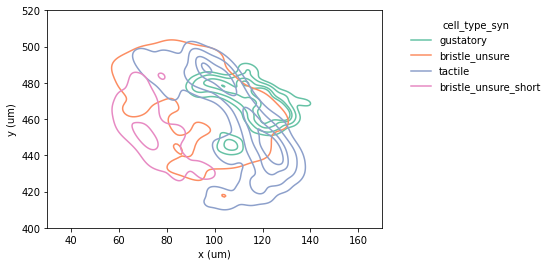

<Figure size 432x288 with 0 Axes>

In [80]:
contour(updated_df, x_axis='y', hue='cell_type_syn', palette='Set2', fill=False, thresh=0.1, levels=5)

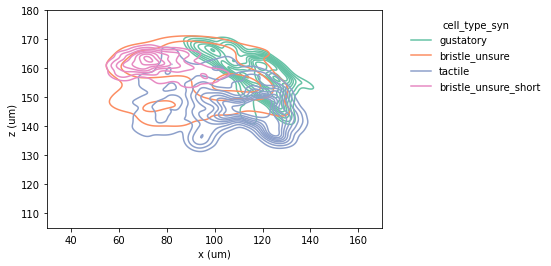

<Figure size 432x288 with 0 Axes>

In [81]:
contour(updated_df, x_axis='z', hue='cell_type_syn',palette='Set2', fill=False)

In [82]:
unsure_short_df = updated_df[updated_df.cell_type_syn=='bristle_unsure_short']
unsure_df = updated_df[updated_df.cell_type_syn=='bristle_unsure_short']

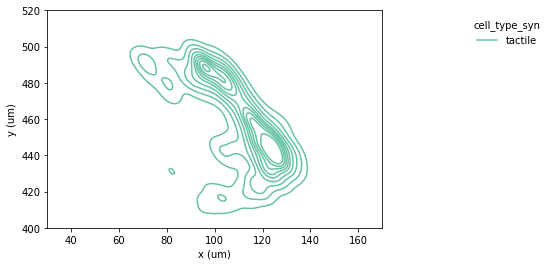

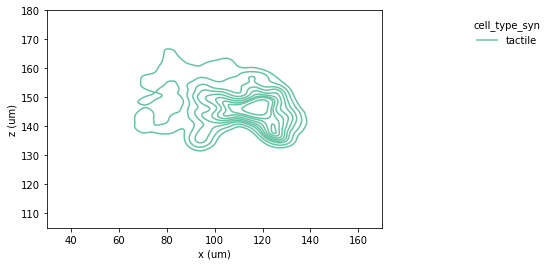

<Figure size 432x288 with 0 Axes>

In [83]:
contour(tactile_df, x_axis='y', hue='cell_type_syn', palette='Set2', fill=False)
contour(tactile_df, x_axis='z', hue='cell_type_syn', palette='Set2', fill=False)

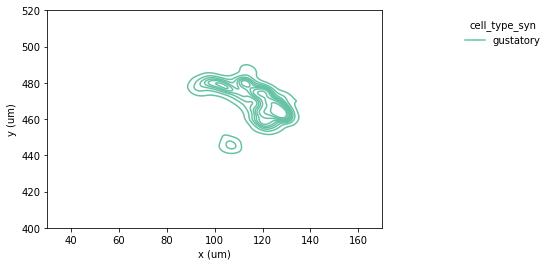

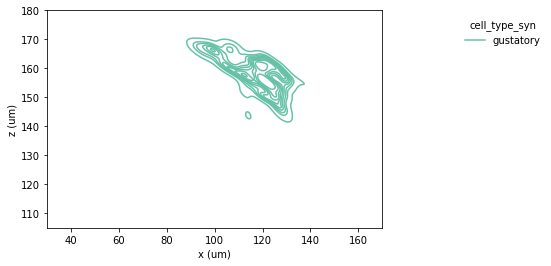

<Figure size 432x288 with 0 Axes>

In [84]:
contour(gustatory_df, x_axis='y', hue='cell_type_syn', palette='Set2', fill=False)
contour(gustatory_df, x_axis='z', hue='cell_type_syn', palette='Set2', fill=False)

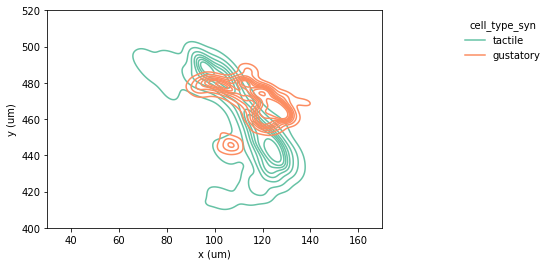

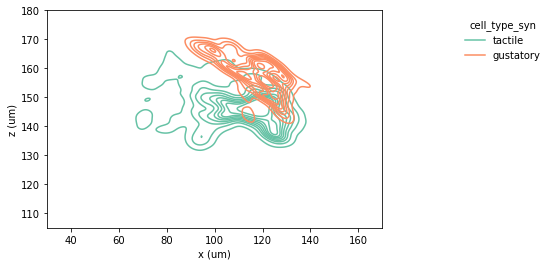

<Figure size 432x288 with 0 Axes>

In [85]:
contour(no_unsure_df, x_axis='y', hue='cell_type_syn', palette='Set2', fill=False)
contour(no_unsure_df, x_axis='z', hue='cell_type_syn', palette='Set2', fill=False)

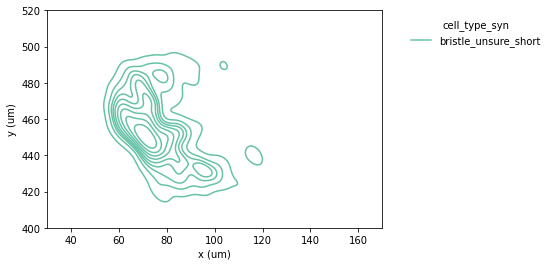

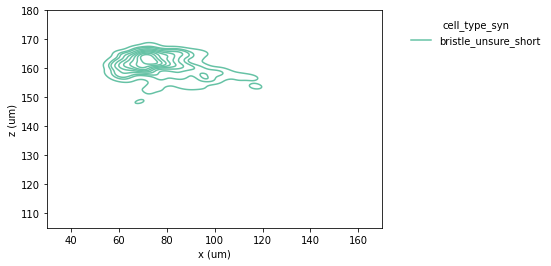

<Figure size 432x288 with 0 Axes>

In [86]:
contour(unsure_short_df, x_axis='y', hue='cell_type_syn', palette='Set2', fill=False)
contour(unsure_short_df, x_axis='z', hue='cell_type_syn', palette='Set2', fill=False)

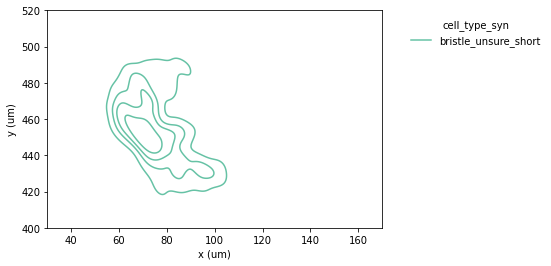

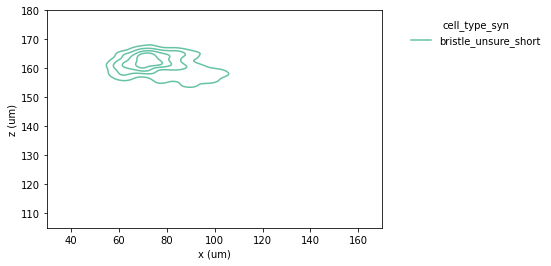

<Figure size 432x288 with 0 Axes>

In [87]:
contour(unsure_df, x_axis='y', hue='cell_type_syn', palette='Set2', fill=False, thresh=0.1, levels=5)
contour(unsure_df, x_axis='z', hue='cell_type_syn', palette='Set2', fill=False, thresh=0.1, levels=5)

In [88]:
large_df = pd.read_pickle('C:/Users/trnan/OneDrive/Desktop/uw/Tutill lab/repos/large_df')

In [89]:
def contour_same_fig(df, x_axis='y', hue='cell_type_syn', fill=True, palette='Set2', thresh=0.05, levels=10):
    pos_df = convert_to_microns(df['pre_pt_position'])
    x = pos_df[:, 0]
    y = pos_df[:, 1]
    z = pos_df[:, 2]
    if x_axis =='y':
        ax = sns.kdeplot(x=x,y=y,hue=df.loc[:,hue], fill=fill, palette=palette, thresh=thresh, levels=levels)
        plt.xlabel('x (um)')
        plt.xlim(30, 170)
        plt.ylabel('y (um)')
        plt.ylim(400, 520)
    else:
        ax = sns.kdeplot(x=x,y=z,hue=df.loc[:,hue],fill=fill,palette=palette,thresh=thresh, levels=levels)
        plt.ylabel('z (um)')
        plt.xlabel('x (um)')
        plt.xlim(30, 170)
        plt.ylim(105, 180)
    sns.move_legend(ax, "upper right",frameon=False,bbox_to_anchor=(1.5, 1))
    #plt.figure()

In [90]:
gust_df = pd.read_csv('gustatory.csv')
gust_df = gust_df.replace(to_replace=('bristle_gustatory','bristle_gustatory_ascending'), value='gustatory')

In [91]:
tac_dct = dict(zip(tactile_df.pre_pt_root_id,tactile_df.cell_type_syn))
gust_dct = dict(zip(gust_df.pt_root_id,gust_df.cell_type))
short_dct = dict(zip(unsure_short_df.pre_pt_root_id,unsure_short_df.cell_type_syn))
len(tac_dct)

49

In [92]:
tac_dct.update(gust_dct)

In [93]:
len(gust_dct)

39

In [94]:
tac_dct.update(short_dct)

In [95]:
len(short_dct)

14

In [96]:
len(tac_dct)

102

In [97]:
large_df.bristle_pt_root_id.unique().shape

(102,)

In [98]:
large_df['bristle_cell_type'] = large_df['bristle_pt_root_id'].map(tac_dct)

In [99]:
large_df.head()

,id,valid,pre_pt_supervoxel_id,pre_pt_root_id,post_pt_supervoxel_id,post_pt_root_id,score,pre_pt_position,post_pt_position,partner_pt_root_id,bristle_pt_root_id,tactile_partners,gustatory_partners,short_partners,classification_system,bristle_cell_type
0,175922,t,72976031589786328,648518346502580848,72976031589776648,648518346479847141,32,"[26929, 110335, 3439]","[26955, 110321, 3439]",648518346479847141,648518346502580848,None,recurrent,None,local,gustatory
1,176025,t,72976031589741915,648518346481688735,72976031589744490,648518346447418805,41,"[27039, 109959, 3419]","[27079, 109963, 3418]",648518346447418805,648518346481688735,None,downstream,None,NaN,NaN
2,176565,t,72976031589808697,648518346481688735,72976031589793424,648518346480988250,36,"[27613, 109847, 3447]","[27591, 109859, 3447]",648518346480988250,648518346481688735,downstream,recurrent,None,ax_ascending,NaN
3,2224130,t,72835156729602976,648518346491499974,72835156729597909,648518346355883134,51,"[24373, 104623, 3581]","[24409, 104631, 3581]",648518346355883134,648518346491499974,None,downstream,None,NaN,gustatory
4,2984779,t,72764994277880831,648518346517576040,72764994277871219,648518346496821988,15,"[21505, 111139, 3747]","[21487, 111131, 3745]",648518346496821988,648518346517576040,None,recurrent,None,sensory,gustatory


In [100]:
tactile_df = large_df[large_df.bristle_cell_type=='tactile']
short_df = large_df[large_df.bristle_cell_type=='bristle_unsure_short']
gustatory_df = large_df[large_df.bristle_cell_type=='gustatory']

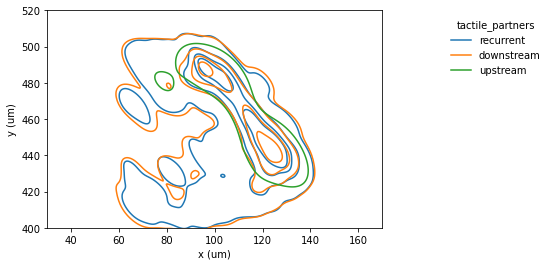

In [101]:
contour_same_fig(tactile_df.reset_index(), x_axis='y',hue='tactile_partners',fill=False, thresh=0.01, levels=5,palette=None)

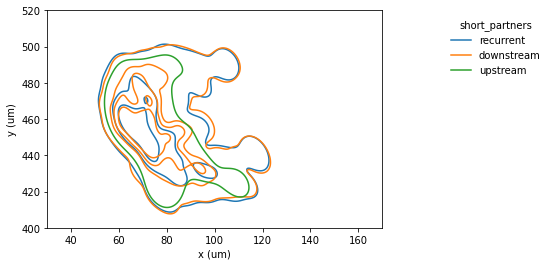

In [102]:
contour_same_fig(short_df.reset_index(), x_axis='y',hue='short_partners',fill=False, thresh=0.01, levels=5, palette = None)

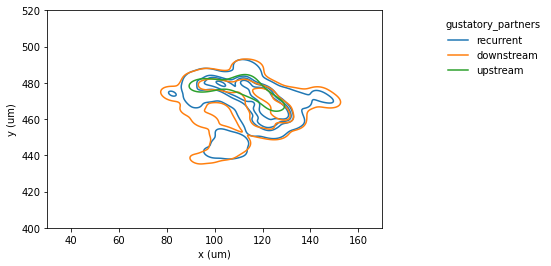

In [103]:
contour_same_fig(gustatory_df.reset_index(), x_axis='y',hue='gustatory_partners',fill=False, thresh=0.01, levels=5, palette=None)

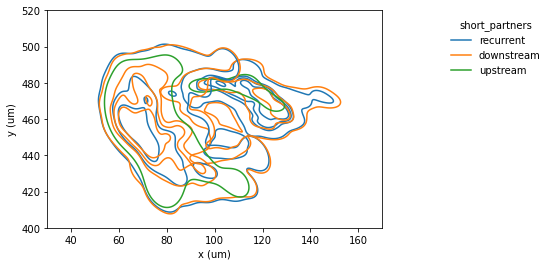

In [104]:
contour_same_fig(gustatory_df.reset_index(), x_axis='y',hue='gustatory_partners',fill=False, thresh=0.01, levels=5, palette=None)
contour_same_fig(short_df.reset_index(), x_axis='y',hue='short_partners',fill=False, thresh=0.01, levels=5, palette = None)

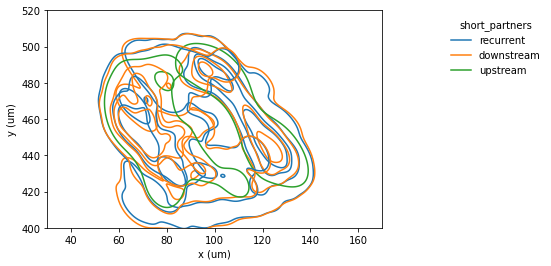

In [105]:
contour_same_fig(tactile_df.reset_index(), x_axis='y',hue='tactile_partners',fill=False, thresh=0.01, levels=5,palette=None)
contour_same_fig(short_df.reset_index(), x_axis='y',hue='short_partners',fill=False, thresh=0.01, levels=5, palette = None)

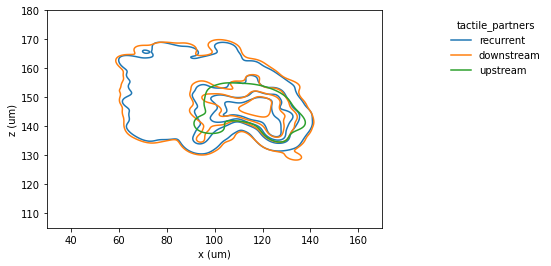

In [106]:
contour_same_fig(tactile_df.reset_index(), x_axis='z',hue='tactile_partners',fill=False, thresh=0.01, levels=5,palette=None)

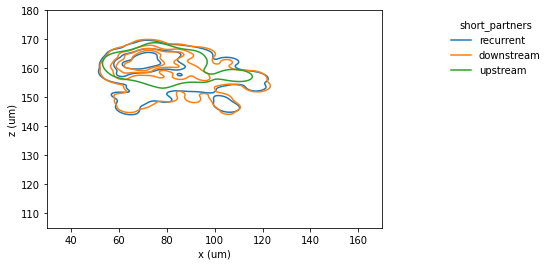

In [107]:
contour_same_fig(short_df.reset_index(), x_axis='z',hue='short_partners',fill=False, thresh=0.01, levels=5, palette = None)

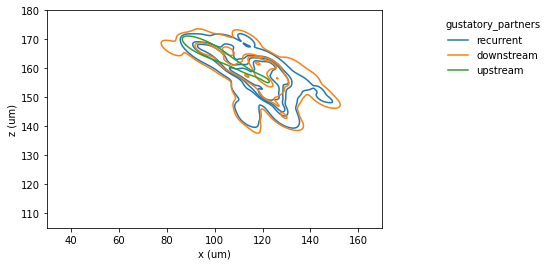

In [108]:
contour_same_fig(gustatory_df.reset_index(), x_axis='z',hue='gustatory_partners',fill=False, thresh=0.01, levels=5, palette=None)

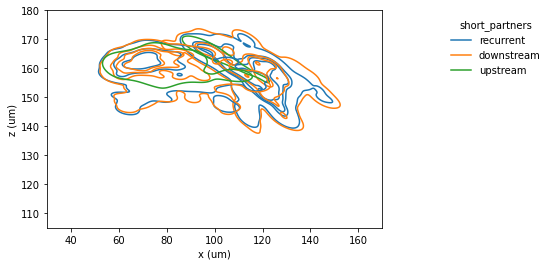

In [109]:
contour_same_fig(gustatory_df.reset_index(), x_axis='z',hue='gustatory_partners',fill=False, thresh=0.01, levels=5, palette=None)
contour_same_fig(short_df.reset_index(), x_axis='z',hue='short_partners',fill=False, thresh=0.01, levels=5, palette = None)

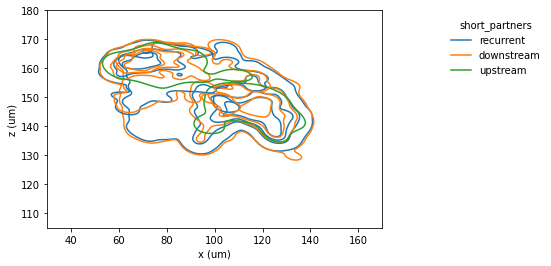

In [110]:
contour_same_fig(tactile_df.reset_index(), x_axis='z',hue='tactile_partners',fill=False, thresh=0.01, levels=5,palette=None)
contour_same_fig(short_df.reset_index(), x_axis='z',hue='short_partners',fill=False, thresh=0.01, levels=5, palette = None)

In [111]:
tac_edges = tactile_df.groupby(['partner_pt_root_id', 'bristle_pt_root_id']).size().sort_values(ascending=False).reset_index(name='count')
gust_edges = gustatory_df.groupby(['partner_pt_root_id', 'bristle_pt_root_id']).size().sort_values(ascending=False).reset_index(name='count')
short_edges = short_df.groupby(['partner_pt_root_id', 'bristle_pt_root_id']).size().sort_values(ascending=False).reset_index(name='count')

In [112]:
tac_new_edges = tac_edges.query('count > 3')
gust_new_edges = gust_edges.query('count > 3')
short_new_edges = short_edges.query('count > 3')

In [113]:
tac_edge_lst = tac_new_edges.partner_pt_root_id.to_list()
gust_edge_lst = gust_new_edges.partner_pt_root_id.to_list()
short_edge_lst = short_new_edges.partner_pt_root_id.to_list()

In [114]:
filtered_tac_df = tactile_df[tactile_df.partner_pt_root_id.isin(tac_edge_lst)]
filtered_gust_df = gustatory_df[gustatory_df.partner_pt_root_id.isin(gust_edge_lst)]
filtered_short_df = short_df[short_df.partner_pt_root_id.isin(short_edge_lst)]

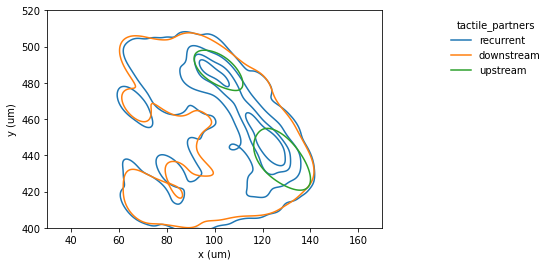

In [115]:
contour_same_fig(filtered_tac_df.reset_index(), x_axis='y',hue='tactile_partners',fill=False, thresh=0.01, levels=5,palette=None)

C:\Users\trnan\anaconda3\envs\micronsbinder\lib\site-packages\seaborn\distributions.py:1213: UserWarning: No contour levels were found within the data range.
  **contour_kws,


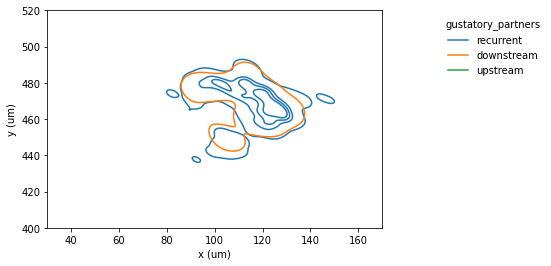

In [116]:
contour_same_fig(filtered_gust_df.reset_index(), x_axis='y',hue='gustatory_partners',fill=False, thresh=0.01, levels=5, palette = None)

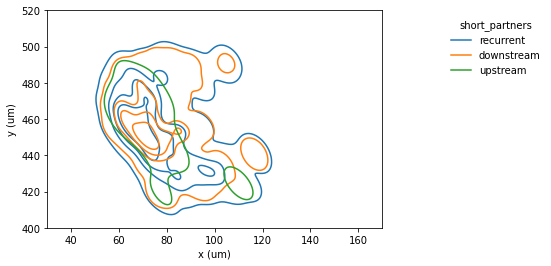

In [117]:
contour_same_fig(filtered_short_df.reset_index(), x_axis='y',hue='short_partners',fill=False, thresh=0.01, levels=5, palette = None)

C:\Users\trnan\anaconda3\envs\micronsbinder\lib\site-packages\seaborn\distributions.py:1213: UserWarning: No contour levels were found within the data range.
  **contour_kws,


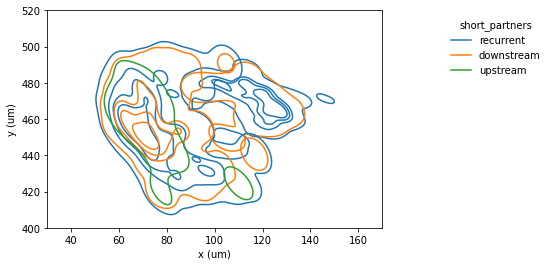

In [118]:
contour_same_fig(filtered_gust_df.reset_index(), x_axis='y',hue='gustatory_partners',fill=False, thresh=0.01, levels=5, palette=None)
contour_same_fig(filtered_short_df.reset_index(), x_axis='y',hue='short_partners',fill=False, thresh=0.01, levels=5, palette = None)

C:\Users\trnan\anaconda3\envs\micronsbinder\lib\site-packages\seaborn\distributions.py:1213: UserWarning: No contour levels were found within the data range.
  **contour_kws,


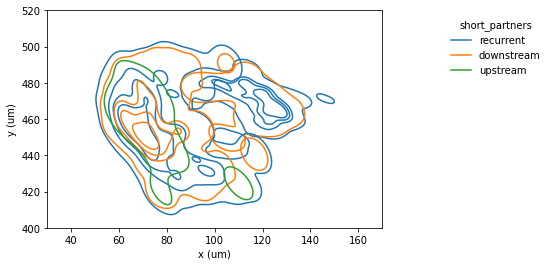

In [119]:
contour_same_fig(filtered_gust_df.reset_index(), x_axis='y',hue='gustatory_partners',fill=False, thresh=0.01, levels=5, palette=None)
contour_same_fig(filtered_short_df.reset_index(), x_axis='y',hue='short_partners',fill=False, thresh=0.01, levels=5, palette = None)

In [120]:
large_df.head()

,id,valid,pre_pt_supervoxel_id,pre_pt_root_id,post_pt_supervoxel_id,post_pt_root_id,score,pre_pt_position,post_pt_position,partner_pt_root_id,bristle_pt_root_id,tactile_partners,gustatory_partners,short_partners,classification_system,bristle_cell_type
0,175922,t,72976031589786328,648518346502580848,72976031589776648,648518346479847141,32,"[26929, 110335, 3439]","[26955, 110321, 3439]",648518346479847141,648518346502580848,None,recurrent,None,local,gustatory
1,176025,t,72976031589741915,648518346481688735,72976031589744490,648518346447418805,41,"[27039, 109959, 3419]","[27079, 109963, 3418]",648518346447418805,648518346481688735,None,downstream,None,NaN,NaN
2,176565,t,72976031589808697,648518346481688735,72976031589793424,648518346480988250,36,"[27613, 109847, 3447]","[27591, 109859, 3447]",648518346480988250,648518346481688735,downstream,recurrent,None,ax_ascending,NaN
3,2224130,t,72835156729602976,648518346491499974,72835156729597909,648518346355883134,51,"[24373, 104623, 3581]","[24409, 104631, 3581]",648518346355883134,648518346491499974,None,downstream,None,NaN,gustatory
4,2984779,t,72764994277880831,648518346517576040,72764994277871219,648518346496821988,15,"[21505, 111139, 3747]","[21487, 111131, 3745]",648518346496821988,648518346517576040,None,recurrent,None,sensory,gustatory


In [121]:
upstream_only_df = large_df.loc[(large_df.gustatory_partners == 'upstream') |
                                (large_df.tactile_partners == 'upstream') |
                                (large_df.short_partners == 'upstream')]
upstream_only_df.shape

(4795, 16)

In [122]:
upstream_only_df.head()

,id,valid,pre_pt_supervoxel_id,pre_pt_root_id,post_pt_supervoxel_id,post_pt_root_id,score,pre_pt_position,post_pt_position,partner_pt_root_id,bristle_pt_root_id,tactile_partners,gustatory_partners,short_partners,classification_system,bristle_cell_type
9,3341588,t,72975962937373891,648518346491499974,72975962937371314,648518346506627106,20,"[27523, 106773, 3547]","[27553, 106757, 3547]",648518346506627106,648518346491499974,upstream,recurrent,None,local,gustatory
42,11815226,t,72976100309294296,648518346490221320,72905731565094536,648518346506627106,31,"[26649, 111893, 3440]","[26613, 111897, 3441]",648518346506627106,648518346490221320,upstream,recurrent,None,local,NaN
48,14263596,t,73046331681788567,648518346493968782,73046331681834717,648518346512198702,21,"[29247, 106949, 3590]","[29221, 106963, 3591]",648518346512198702,648518346493968782,None,recurrent,upstream,sensory,NaN
51,14264077,t,73046331681567928,648518346491499974,73046331681565583,648518346506627106,20,"[29649, 106793, 3554]","[29633, 106761, 3555]",648518346506627106,648518346491499974,upstream,recurrent,None,local,gustatory
60,17271985,t,73046400333815485,648518346494140411,73046400333818034,648518346506627106,42,"[28745, 109939, 3374]","[28763, 109975, 3374]",648518346506627106,648518346494140411,upstream,recurrent,None,local,NaN


array([[118.3489, 459.1239, 159.615 ],
       [114.5907, 481.1399, 154.8   ],
       [125.7621, 459.8807, 161.55  ],
       ...,
       [ 83.0459, 493.1455, 158.49  ],
       [ 73.9729, 444.8737, 168.975 ],
       [ 69.0967, 475.5155, 161.685 ]])

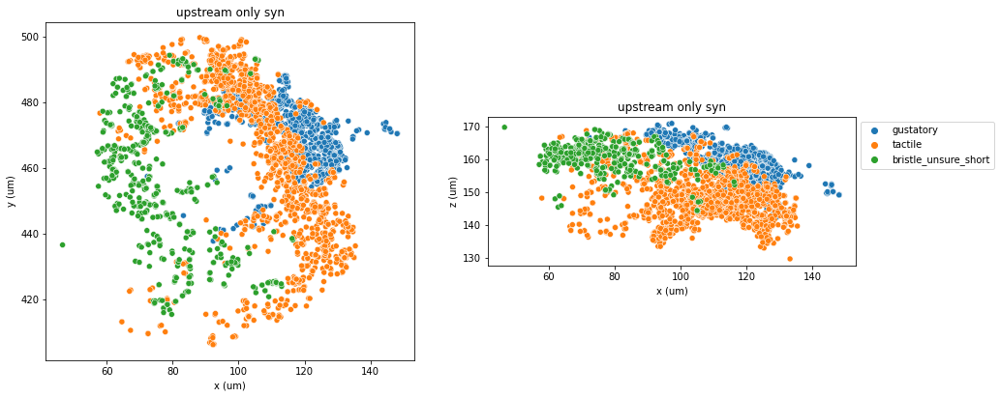

In [123]:
plot_entire(upstream_only_df, 'upstream only syn', upstream_only_df.bristle_cell_type)

In [124]:
test1 = large_df.loc[(large_df.gustatory_partners == 'upstream') &
                     (large_df.tactile_partners == 'None') &
                     (large_df.short_partners == 'None')]
test2 = large_df.loc[(large_df.gustatory_partners == 'None') &
                     (large_df.tactile_partners == 'upstream') &
                     (large_df.short_partners == 'None')]
test3 = large_df.loc[(large_df.gustatory_partners == 'None') &
                     (large_df.tactile_partners == 'None') &
                     (large_df.short_partners == 'upstream')]
test_df = pd.concat((test1,test2,test3))
test_df.shape

(941, 16)

In [125]:
test_df.head()

,id,valid,pre_pt_supervoxel_id,pre_pt_root_id,post_pt_supervoxel_id,post_pt_root_id,score,pre_pt_position,post_pt_position,partner_pt_root_id,bristle_pt_root_id,tactile_partners,gustatory_partners,short_partners,classification_system,bristle_cell_type
4,5044573,t,73046331547063182,648518346442372728,73046331547123126,648518346493767928,35,"[30251, 107173, 3215]","[30277, 107155, 3216]",648518346442372728,648518346493767928,None,upstream,None,NaN,gustatory
46,2984675,t,72764994277878647,648518346481790397,72764994277882983,648518346517576040,28,"[21335, 111229, 3748]","[21325, 111207, 3750]",648518346481790397,648518346517576040,None,upstream,None,NaN,gustatory
56,17662036,t,72764719399919186,648518346493008560,72764719399923229,648518346486178440,30,"[21951, 102603, 3733]","[21925, 102577, 3733]",648518346493008560,648518346486178440,None,upstream,None,NaN,gustatory
108,21282519,t,72764994210937485,648518346428428533,72764994210948014,648518346475523508,13,"[22277, 111975, 3697]","[22299, 111979, 3698]",648518346428428533,648518346475523508,None,upstream,None,NaN,NaN
110,23014927,t,72764994277823846,648518346429129973,72764994277856546,648518346500687795,36,"[21837, 111357, 3733]","[21877, 111357, 3733]",648518346429129973,648518346500687795,None,upstream,None,NaN,gustatory


array([[130.0793, 460.8439, 144.675 ],
       [ 91.7405, 478.2847, 168.66  ],
       [ 94.3893, 441.1929, 167.985 ],
       ...,
       [ 83.0459, 493.1455, 158.49  ],
       [ 73.9729, 444.8737, 168.975 ],
       [ 69.0967, 475.5155, 161.685 ]])

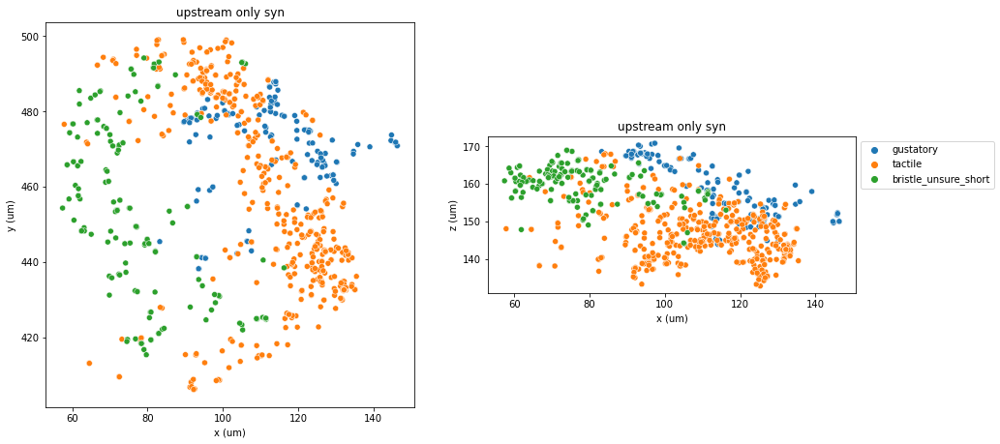

In [126]:
plot_entire(test_df, 'upstream only syn', test_df.bristle_cell_type)

In [127]:
large_df.bristle_cell_type.value_counts(dropna=False)

tactile                 40690
gustatory               14523
NaN                     11958
bristle_unsure_short    11386
Name: bristle_cell_type, dtype: int64

In [128]:
#large_df[large_df.bristle_pt_root_id==648518346491575870]
large_df[large_df.bristle_pt_root_id==648518346490201352]

,id,valid,pre_pt_supervoxel_id,pre_pt_root_id,post_pt_supervoxel_id,post_pt_root_id,score,pre_pt_position,post_pt_position,partner_pt_root_id,bristle_pt_root_id,tactile_partners,gustatory_partners,short_partners,classification_system,bristle_cell_type
885,45690517,t,73187206541729653,648518346490201352,73187206541718988,648518346405179969,91,"[33713, 110807, 3398]","[33683, 110785, 3398]",648518346405179969,648518346490201352,None,downstream,None,NaN,gustatory
13722,45690525,t,73187206541729653,648518346490201352,73187206541735169,648518346405198401,35,"[33707, 110805, 3400]","[33693, 110767, 3401]",648518346405198401,648518346490201352,None,downstream,None,NaN,gustatory
17980,1089558,t,73187137822002136,648518346490201352,73187137821913056,648518346480095135,38,"[34215, 109271, 3338]","[34187, 109281, 3338]",648518346480095135,648518346490201352,None,downstream,None,NaN,gustatory
4522,23433684,t,72764788119496592,648518346500349656,72764788119500564,648518346490201352,13,"[21631, 106091, 3785]","[21627, 106065, 3786]",648518346500349656,648518346490201352,None,upstream,None,NaN,gustatory


In [129]:
na = large_df.loc[(large_df.tactile_partners.isna())]
na

,id,valid,pre_pt_supervoxel_id,pre_pt_root_id,post_pt_supervoxel_id,post_pt_root_id,score,pre_pt_position,post_pt_position,partner_pt_root_id,bristle_pt_root_id,tactile_partners,gustatory_partners,short_partners,classification_system,bristle_cell_type


In [130]:
na.bristle_pt_root_id.unique()

array([], dtype=int64)

In [131]:
leg_syn_df[leg_syn_df.pt_root_id==648518346490201352]

,cell_type,pt_root_id,id,valid,pre_pt_supervoxel_id,pre_pt_root_id,post_pt_supervoxel_id,post_pt_root_id,score,pre_pt_position,post_pt_position
46181,bristle_gustatory_ascending,648518346490201352,45690517,t,73187206541729653,648518346490201352,73187206541718988,648518346405179969,91,"[33713, 110807, 3398]","[33683, 110785, 3398]"
46182,bristle_gustatory_ascending,648518346490201352,45690525,t,73187206541729653,648518346490201352,73187206541735169,648518346405198401,35,"[33707, 110805, 3400]","[33693, 110767, 3401]"
46183,bristle_gustatory_ascending,648518346490201352,1089558,t,73187137822002136,648518346490201352,73187137821913056,648518346480095135,38,"[34215, 109271, 3338]","[34187, 109281, 3338]"


In [132]:
large_df.bristle_pt_root_id.unique().shape

(102,)

In [133]:
leg_syn_df.head()

,cell_type,pt_root_id,id,valid,pre_pt_supervoxel_id,pre_pt_root_id,post_pt_supervoxel_id,post_pt_root_id,score,pre_pt_position,post_pt_position
0,bristle_tactile,648518346496820708,9466730,t,73046125254701366,648518346496820708,72975756510529004,648518346454352172,22,"[28675, 102241, 3047]","[28639, 102249, 3047]"
1,bristle_tactile,648518346496820708,10998092,t,72975756644584306,648518346496820708,72975756644589312,648518346493203264,78,"[27759, 101151, 3244]","[27723, 101147, 3245]"
2,bristle_tactile,648518346496820708,14240888,t,72975756644473234,648518346496820708,72975756644518226,648518346390742883,17,"[28135, 101677, 3213]","[28121, 101653, 3214]"
3,bristle_tactile,648518346496820708,24869353,t,72975962803049227,648518346496820708,72975962803028506,648518346486629089,27,"[27223, 106629, 3250]","[27213, 106659, 3250]"
4,bristle_tactile,648518346496820708,26698178,t,72975825498250430,648518346496820708,72975825498273319,648518346493203264,14,"[26715, 103697, 3494]","[26697, 103671, 3495]"


In [134]:
large_df.head()

,id,valid,pre_pt_supervoxel_id,pre_pt_root_id,post_pt_supervoxel_id,post_pt_root_id,score,pre_pt_position,post_pt_position,partner_pt_root_id,bristle_pt_root_id,tactile_partners,gustatory_partners,short_partners,classification_system,bristle_cell_type
0,175922,t,72976031589786328,648518346502580848,72976031589776648,648518346479847141,32,"[26929, 110335, 3439]","[26955, 110321, 3439]",648518346479847141,648518346502580848,None,recurrent,None,local,gustatory
1,176025,t,72976031589741915,648518346481688735,72976031589744490,648518346447418805,41,"[27039, 109959, 3419]","[27079, 109963, 3418]",648518346447418805,648518346481688735,None,downstream,None,NaN,NaN
2,176565,t,72976031589808697,648518346481688735,72976031589793424,648518346480988250,36,"[27613, 109847, 3447]","[27591, 109859, 3447]",648518346480988250,648518346481688735,downstream,recurrent,None,ax_ascending,NaN
3,2224130,t,72835156729602976,648518346491499974,72835156729597909,648518346355883134,51,"[24373, 104623, 3581]","[24409, 104631, 3581]",648518346355883134,648518346491499974,None,downstream,None,NaN,gustatory
4,2984779,t,72764994277880831,648518346517576040,72764994277871219,648518346496821988,15,"[21505, 111139, 3747]","[21487, 111131, 3745]",648518346496821988,648518346517576040,None,recurrent,None,sensory,gustatory


In [135]:
large_df.to_pickle("C:/Users/trnan/OneDrive/Desktop/uw/Tutill lab/repos/large_df")

In [136]:
len(updated_df.loc[(updated_df.classification_system=='sensory') & (updated_df.cell_type_syn=='gustatory')].post_pt_root_id.unique())

54

In [137]:
len(updated_df.loc[(updated_df.classification_system=='sensory') & (updated_df.cell_type_syn=='tactile')].post_pt_root_id.unique())

50

In [138]:
len(updated_df.loc[(updated_df.classification_system=='sensory') & (updated_df.cell_type_syn=='tactile')])

712

In [139]:
len(updated_df.loc[(updated_df.classification_system=='sensory') & (updated_df.cell_type_syn=='gustatory')])

2483

In [140]:
gustatory_lst = updated_df.loc[(updated_df.classification_system=='sensory') 
                               & (updated_df.cell_type_syn=='gustatory')].post_pt_root_id.unique()
tactile_lst = updated_df.loc[(updated_df.classification_system=='sensory') 
                               & (updated_df.cell_type_syn=='tactile')].post_pt_root_id.unique()

In [141]:
client.materialize.synapse_query(post_ids=tactile_lst).shape

(12701, 9)

In [142]:
client.materialize.synapse_query(post_ids=gustatory_lst).shape

(8437, 9)

In [143]:
print(len(updated_df.loc[(updated_df.classification_system=='sensory') 
                   & (updated_df.cell_type_syn=='gustatory')].post_pt_root_id.unique()))
print(len(updated_df.loc[(updated_df.classification_system=='sensory') 
                   & (updated_df.cell_type_syn=='tactile')].post_pt_root_id.unique()))

54
50


In [144]:
large_df.head()

,id,valid,pre_pt_supervoxel_id,pre_pt_root_id,post_pt_supervoxel_id,post_pt_root_id,score,pre_pt_position,post_pt_position,partner_pt_root_id,bristle_pt_root_id,tactile_partners,gustatory_partners,short_partners,classification_system,bristle_cell_type
0,175922,t,72976031589786328,648518346502580848,72976031589776648,648518346479847141,32,"[26929, 110335, 3439]","[26955, 110321, 3439]",648518346479847141,648518346502580848,None,recurrent,None,local,gustatory
1,176025,t,72976031589741915,648518346481688735,72976031589744490,648518346447418805,41,"[27039, 109959, 3419]","[27079, 109963, 3418]",648518346447418805,648518346481688735,None,downstream,None,NaN,NaN
2,176565,t,72976031589808697,648518346481688735,72976031589793424,648518346480988250,36,"[27613, 109847, 3447]","[27591, 109859, 3447]",648518346480988250,648518346481688735,downstream,recurrent,None,ax_ascending,NaN
3,2224130,t,72835156729602976,648518346491499974,72835156729597909,648518346355883134,51,"[24373, 104623, 3581]","[24409, 104631, 3581]",648518346355883134,648518346491499974,None,downstream,None,NaN,gustatory
4,2984779,t,72764994277880831,648518346517576040,72764994277871219,648518346496821988,15,"[21505, 111139, 3747]","[21487, 111131, 3745]",648518346496821988,648518346517576040,None,recurrent,None,sensory,gustatory
